# Bank Mid-Term Pipeline (Exploratory Notebook)

Mục tiêu: chạy thử toàn bộ pipeline cho **14 mã ngân hàng** với horizon trung hạn (30/60 ngày), sau đó mới đóng gói thành module Python.

**Lưu ý**: Notebook này chỉ để thử nghiệm. Khi chốt được các bước và tham số, sẽ chuyển logic sang các module `src/` và CLI.

In [672]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1. Data process

In [673]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
import plotly.figure_factory as ff
from keras.models import Sequential
from keras.layers import LSTM,Dropout,Dense


from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

## 1.1 OHCLV

In [674]:
# Imports & paths (Colab-friendly)
from __future__ import annotations

import json
import math
import os
import pathlib

from typing import Dict, List, Optional, Tuple

# 14 mã ngân hàng
BANK_TICKERS = [
    "ACB", "BID", "CTG", "HDB", "MBB", "SHB", "SSB", "STB",
    "TCB", "TPB", "VCB", "VIB", "VPB", "LPB",
]

HORIZONS = [30, 60]

ROOT_DIR = "/content/drive/MyDrive/Data_mining/Data"

ohlcv_dir = ROOT_DIR + "/vn30_2015_2025.csv"


In [675]:
ohlcv = pd.read_csv(ohlcv_dir)
ohlcv = ohlcv[ohlcv["symbol"].isin(BANK_TICKERS)].copy()    # lọc các mã ngân hàng

ohlcv["time"] = pd.to_datetime(ohlcv["time"])               #chuyển định dạng datetime

# In ra bảng và thông tin
print(ohlcv.head())
print(ohlcv.info())

# Lọc thời gian từ 2015 - 2025
ohlcv = ohlcv[ohlcv["time"] >= "2015-01-01"].copy()

# Khảo sát khoảng thời gian của từng mã
date_range_per_symbol = (
    ohlcv
    .groupby("symbol")["time"]
    .agg(start_date="min", end_date="max")
    .sort_values("start_date")
)

print(date_range_per_symbol)

# Số lượng dòng mỗi mã cổ phiếu
print("Rows per symbol (sample):")
grouped_symbols = ohlcv.groupby("symbol").size().sort_values(ascending=False)
print(grouped_symbols)



        time  open  high   low  close  volume symbol
0 2014-07-02  2.37  2.37  2.35   2.37  114809    ACB
1 2014-07-03  2.37  2.38  2.35   2.38  309194    ACB
2 2014-07-04  2.38  2.38  2.37   2.37  117744    ACB
3 2014-07-07  2.38  2.38  2.34   2.37  176864    ACB
4 2014-07-08  2.37  2.38  2.35   2.37  203651    ACB
<class 'pandas.core.frame.DataFrame'>
Index: 33294 entries, 0 to 72307
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    33294 non-null  datetime64[ns]
 1   open    33294 non-null  float64       
 2   high    33294 non-null  float64       
 3   low     33294 non-null  float64       
 4   close   33294 non-null  float64       
 5   volume  33294 non-null  int64         
 6   symbol  33294 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 2.0+ MB
None
       start_date   end_date
symbol                      
ACB    2015-01-05 2025-12-10
BID    201

In [676]:
ohlcv = pd.read_csv(ohlcv_dir)

# 1. Filter bank tickers
ohlcv = ohlcv[ohlcv["symbol"].isin(BANK_TICKERS)].copy()

# 2. Datetime
ohlcv["time"] = pd.to_datetime(ohlcv["time"])

# 3. Filter time range
ohlcv = ohlcv[ohlcv["time"] >= "2015-01-01"].copy()

# 4. Sort
ohlcv = ohlcv.sort_values(["symbol", "time"]).reset_index(drop=True)

# 5. Basic price sanity checks
ohlcv = ohlcv[
    (ohlcv["close"] > 0) &
    (ohlcv["open"] > 0) &
    (ohlcv["high"] > 0) &
    (ohlcv["low"] > 0)
].copy()

ohlcv = ohlcv[
    (ohlcv["high"] >= ohlcv[["open", "close"]].max(axis=1)) &
    (ohlcv["low"]  <= ohlcv[["open", "close"]].min(axis=1))
].copy()

# 6. Remove duplicates
ohlcv = ohlcv.drop_duplicates(subset=["symbol", "time"])

# 7. Snapshot raw layer
ohlcv_raw = ohlcv.copy()


In [677]:
# In ra bảng và thông tin
print(ohlcv.head())
print(ohlcv.info())

# Lọc thời gian từ 2015 - 2025
ohlcv = ohlcv[ohlcv["time"] >= "2015-01-01"].copy()

# Khảo sát khoảng thời gian của từng mã
date_range_per_symbol = (
    ohlcv
    .groupby("symbol")["time"]
    .agg(start_date="min", end_date="max")
    .sort_values("start_date")
)

print(date_range_per_symbol)

# Số lượng dòng mỗi mã cổ phiếu
print("Rows per symbol (sample):")
grouped_symbols = ohlcv.groupby("symbol").size().sort_values(ascending=False)
print(grouped_symbols)

        time  open  high   low  close  volume symbol
0 2015-01-05  2.35  2.35  2.32   2.34   55888    ACB
1 2015-01-06  2.32  2.37  2.31   2.37   89802    ACB
2 2015-01-07  2.37  2.45  2.37   2.40  232861    ACB
3 2015-01-08  2.40  2.42  2.38   2.42   14880    ACB
4 2015-01-09  2.42  2.49  2.38   2.43  693623    ACB
<class 'pandas.core.frame.DataFrame'>
Index: 32416 entries, 0 to 32417
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    32416 non-null  datetime64[ns]
 1   open    32416 non-null  float64       
 2   high    32416 non-null  float64       
 3   low     32416 non-null  float64       
 4   close   32416 non-null  float64       
 5   volume  32416 non-null  int64         
 6   symbol  32416 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 2.0+ MB
None
       start_date   end_date
symbol                      
ACB    2015-01-05 2025-12-10
BID    201

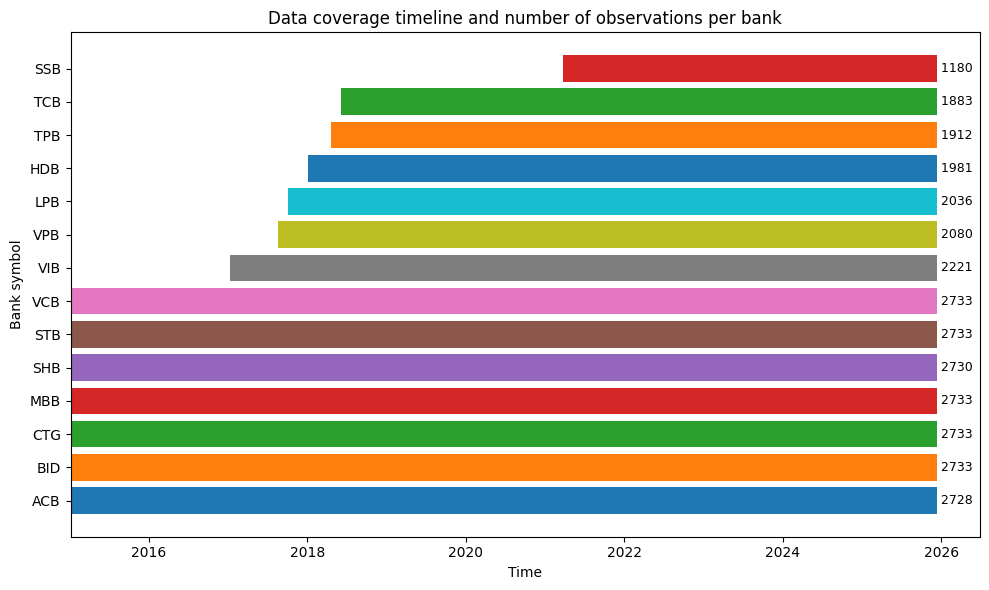

In [678]:
# Update the timeline bar chart with the corrected data provided by the user

import pandas as pd
import matplotlib.pyplot as plt

# Corrected dataset
data = {
    "symbol": ["ACB","BID","CTG","MBB","SHB","STB","VCB","VIB","VPB","LPB","HDB","TPB","TCB","SSB"],
    "start_date": [
        "2015-01-05","2015-01-05","2015-01-05","2015-01-05","2015-01-05","2015-01-05","2015-01-05",
        "2017-01-09","2017-08-17","2017-10-05","2018-01-05","2018-04-19","2018-06-04","2021-03-24"
    ],
    "end_date": ["2025-12-10"] * 14,
    "rows": [2728,2733,2733,2733,2730,2733,2733,2221,2080,2036,1981,1912,1883,1180]
}

df = pd.DataFrame(data)
df["start_date"] = pd.to_datetime(df["start_date"])
df["end_date"] = pd.to_datetime(df["end_date"])

# Sort by start date (earlier first)
df = df.sort_values("start_date")

# Plot horizontal timeline bar chart
plt.figure(figsize=(10, 6))

for i, row in enumerate(df.itertuples()):
    plt.barh(
        row.symbol,
        (row.end_date - row.start_date).days,
        left=row.start_date
    )
    plt.text(
        row.end_date,
        i,
        f" {row.rows}",
        va="center",
        fontsize=9
    )

plt.xlabel("Time")
plt.ylabel("Bank symbol")
plt.title("Data coverage timeline and number of observations per bank")
plt.tight_layout()
plt.show()


Câu hỏi EDA cốt lõi

1. Giá ngân hàng **biến động như thế nào theo thời gian?**
    
2. Ngân hàng nào:
    
    * ổn định
        
    * biến động
        
    * nhạy cảm tin tức
        
3. Có **regime change** không? (COVID, thắt chặt tiền tệ, v.v.)
    

EDA cần làm

* Timeline close / open
    
* Return distribution
    
* Volatility clustering
    
* Seasonal decomposition (period = 5, 21, 63)
    
* Candlestick (EDA trực quan)
    

Insight thường rút ra

* Ngân hàng lớn: volatility thấp, trend dài
    
* Ngân hàng nhỏ: phản ứng nhanh với tin tức
    
* Thị trường VN **ít seasonality rõ ràng**, nhiều shock
    

Kết luận:

> Giá không chỉ phụ thuộc lịch sử giá → cần thêm **external factors**

### Timeline

In [679]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def plot_ohlc_lines(df, symbol, start=None, end=None):
    """
    Plot OHLC line charts for a single stock symbol.

    Parameters
    ----------
    df : DataFrame
        OHLCV data
    symbol : str
        Stock ticker
    start, end : str or None
        Date filter (YYYY-MM-DD)
    """

    data = df[df["symbol"] == symbol].copy()

    if start:
        data = data[data["time"] >= start]
    if end:
        data = data[data["time"] <= end]

    data = data.set_index("time")

    fig = make_subplots(
        rows=4, cols=1,
        shared_xaxes=True,
        subplot_titles=("Open", "High", "Low", "Close")
    )

    fig.add_trace(
        go.Scatter(x=data.index, y=data["open"], mode="lines", name="Open"),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=data.index, y=data["high"], mode="lines", name="High"),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(x=data.index, y=data["low"], mode="lines", name="Low"),
        row=3, col=1
    )

    fig.add_trace(
        go.Scatter(x=data.index, y=data["close"], mode="lines", name="Close"),
        row=4, col=1
    )

    fig.update_layout(
        height=1400,
        width=1000,
        title_text=f"OHLC Line Plots – {symbol}",
        showlegend=False
    )

    fig.show()


In [680]:
for symbol in BANK_TICKERS:
    plot_ohlc_lines(ohlcv, symbol)


In [681]:
symbol = "CTG"
plot_ohlc_lines(ohlcv, symbol)

In [682]:
symbol = "VCB"
plot_ohlc_lines(ohlcv, symbol)

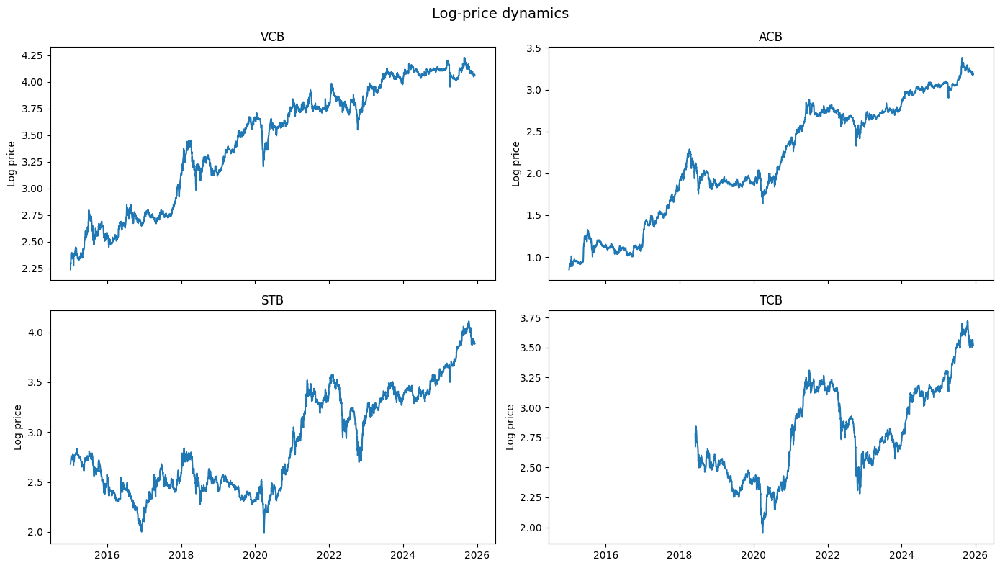

In [683]:
import matplotlib.pyplot as plt
import numpy as np

symbols = ["VCB", "ACB", "STB", "TCB"]

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(14, 8),
    sharex=True
)

axes = axes.flatten()

for ax, sym in zip(axes, symbols):
    sub = ohlcv[ohlcv["symbol"] == sym]
    ax.plot(sub["time"], np.log(sub["close"]))
    ax.set_title(sym)
    ax.set_ylabel("Log price")

fig.suptitle("Log-price dynamics", fontsize=14)
plt.tight_layout()
plt.show()


In [684]:
# fig, axes = plt.subplots(2, 2, figsize=(12, 8))
# axes = axes.flatten()

# for ax, sym in zip(axes, symbols):
#     sns.histplot(
#         ohlcv[ohlcv["symbol"] == sym]["return_1d"].dropna(),
#         bins=50,
#         kde=True,
#         ax=ax
#     )
#     ax.set_title(f"{sym} – Return distribution")

# plt.tight_layout()
# plt.show()


### Return distribution

In [685]:
import numpy as np
import pandas as pd

# --- Ensure correct ordering
ohlcv = ohlcv.copy()
ohlcv["time"] = pd.to_datetime(ohlcv["time"])
ohlcv = ohlcv.sort_values(["symbol", "time"]).reset_index(drop=True)

# --- Guard: close must be valid for return
ohlcv["close"] = pd.to_numeric(ohlcv["close"], errors="coerce")
ohlcv.loc[ohlcv["close"] <= 0, "close"] = np.nan

# --- Simple return (pct change)
ohlcv["return_1d"] = (
    ohlcv.groupby("symbol")["close"]
         .pct_change(1)
)

# --- Log return (more stable / additive)
ohlcv["log_return_1d"] = (
    ohlcv.groupby("symbol")["close"]
         .apply(lambda s: np.log(s / s.shift(1)))
         .reset_index(level=0, drop=True)
)

# --- Clean inf values (just in case)
ohlcv["return_1d"] = ohlcv["return_1d"].replace([np.inf, -np.inf], np.nan)
ohlcv["log_return_1d"] = ohlcv["log_return_1d"].replace([np.inf, -np.inf], np.nan)

# Quick sanity check
print(ohlcv[["symbol", "time", "close", "return_1d", "log_return_1d"]].head(10))
print("Missing rate return_1d:", ohlcv["return_1d"].isna().mean())
print("Missing rate log_return_1d:", ohlcv["log_return_1d"].isna().mean())


  symbol       time  close  return_1d  log_return_1d
0    ACB 2015-01-05   2.34        NaN            NaN
1    ACB 2015-01-06   2.37   0.012821       0.012739
2    ACB 2015-01-07   2.40   0.012658       0.012579
3    ACB 2015-01-08   2.42   0.008333       0.008299
4    ACB 2015-01-09   2.43   0.004132       0.004124
5    ACB 2015-01-12   2.46   0.012346       0.012270
6    ACB 2015-01-13   2.52   0.024390       0.024098
7    ACB 2015-01-14   2.48  -0.015873      -0.016000
8    ACB 2015-01-15   2.43  -0.020161      -0.020367
9    ACB 2015-01-16   2.43   0.000000       0.000000
Missing rate return_1d: 0.00043188548864758145
Missing rate log_return_1d: 0.00043188548864758145


In [686]:
def plot_return_distribution(df, symbol, horizon=1):
    """
    Plot return distribution for a given stock.

    horizon: 1 = daily, 5 = weekly, 21 = monthly
    """
    data = df[df["symbol"] == symbol].copy()
    data = data.sort_values("time")

    data[f"ret_{horizon}d"] = (
        data["close"]
        .pct_change(horizon)
    )

    returns = data[f"ret_{horizon}d"].dropna()

    plt.figure(figsize=(8,4))
    sns.histplot(returns, bins=50, kde=True)
    plt.title(f"{symbol} – Return Distribution ({horizon}d)")
    plt.xlabel("Return")
    plt.show()


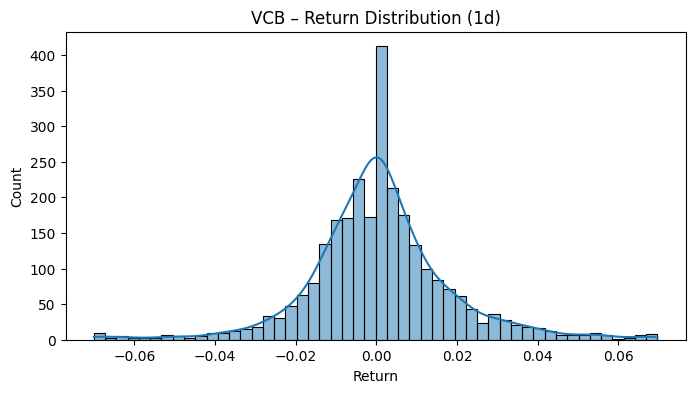

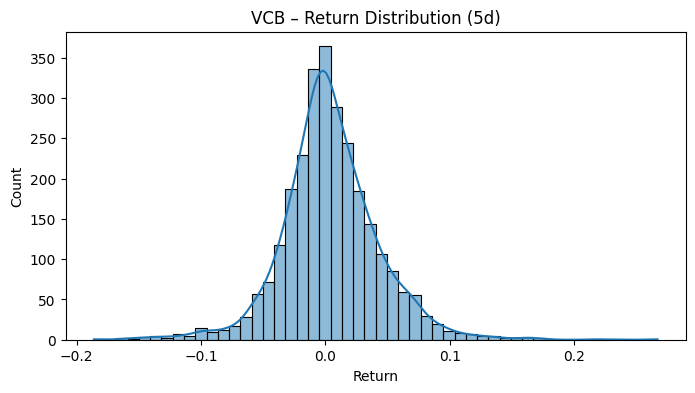

In [687]:
# Return tính theo 1 ngày và 5 ngày
plot_return_distribution(ohlcv, "VCB", horizon=1)
plot_return_distribution(ohlcv, "VCB", horizon=5)

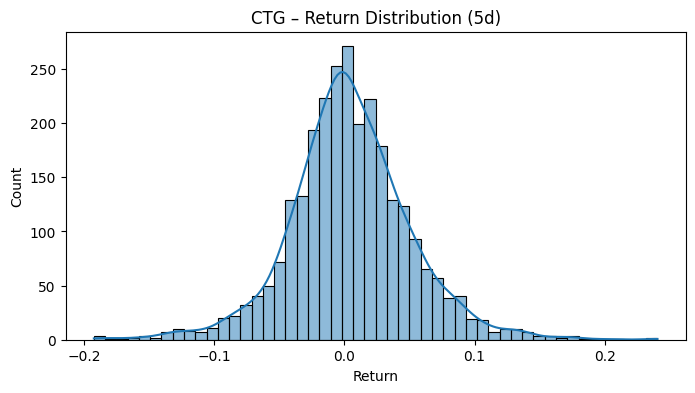

In [688]:
# Return tính theo 5 ngày
plot_return_distribution(ohlcv, "CTG", horizon=5)

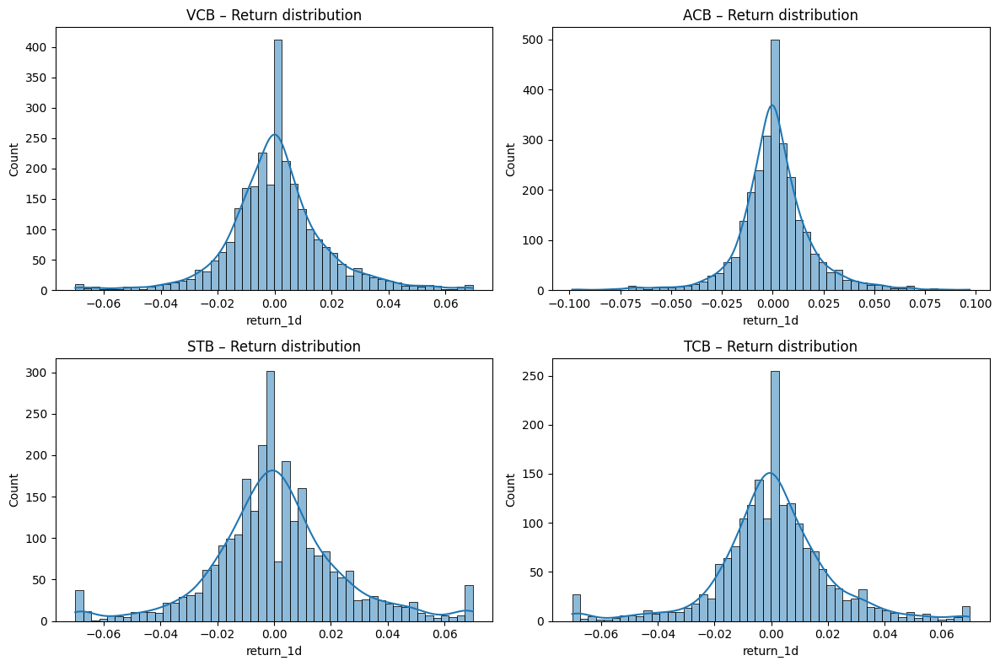

In [689]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for ax, sym in zip(axes, symbols):
    sns.histplot(
        ohlcv[ohlcv["symbol"] == sym]["return_1d"].dropna(),
        bins=50,
        kde=True,
        ax=ax
    )
    ax.set_title(f"{sym} – Return distribution")

plt.tight_layout()
plt.show()


### Volatility clustering

In [690]:
def plot_volatility_clustering(df, symbol, window=21):
    """
    Plot rolling volatility to observe clustering.
    """
    data = df[df["symbol"] == symbol].copy()
    data = data.sort_values("time")

    data["ret_1d"] = data["close"].pct_change()
    data[f"vol_{window}d"] = data["ret_1d"].rolling(window).std()

    plt.figure(figsize=(10,4))
    plt.plot(data["time"], data[f"vol_{window}d"])
    plt.title(f"{symbol} – {window}D Rolling Volatility")
    plt.ylabel("Volatility")
    plt.show()


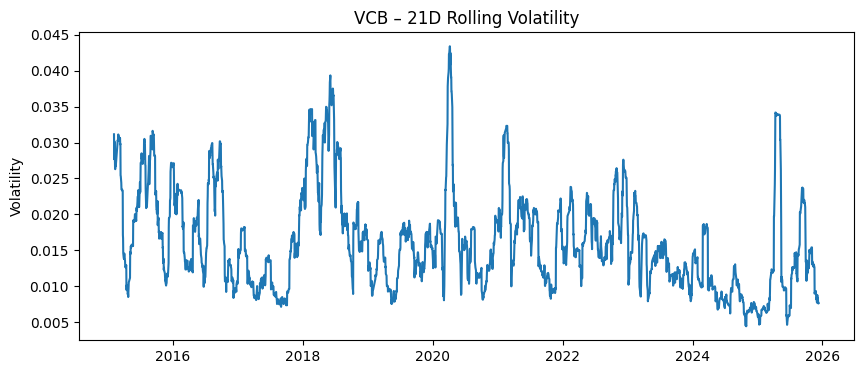

In [691]:
plot_volatility_clustering(ohlcv, "VCB", window=21)

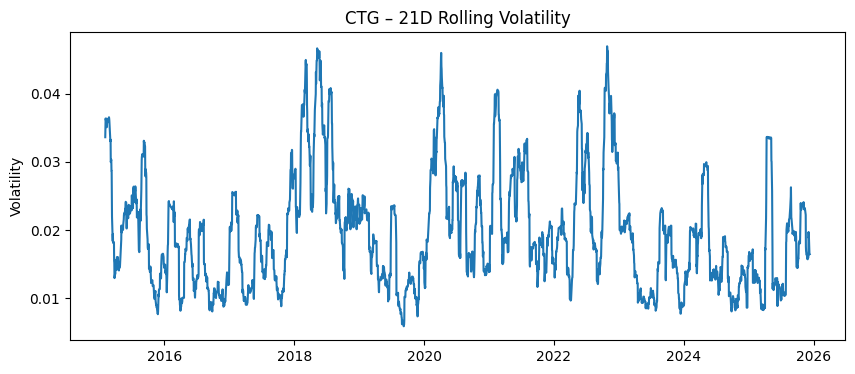

In [692]:
plot_volatility_clustering(ohlcv, "CTG", window=21)

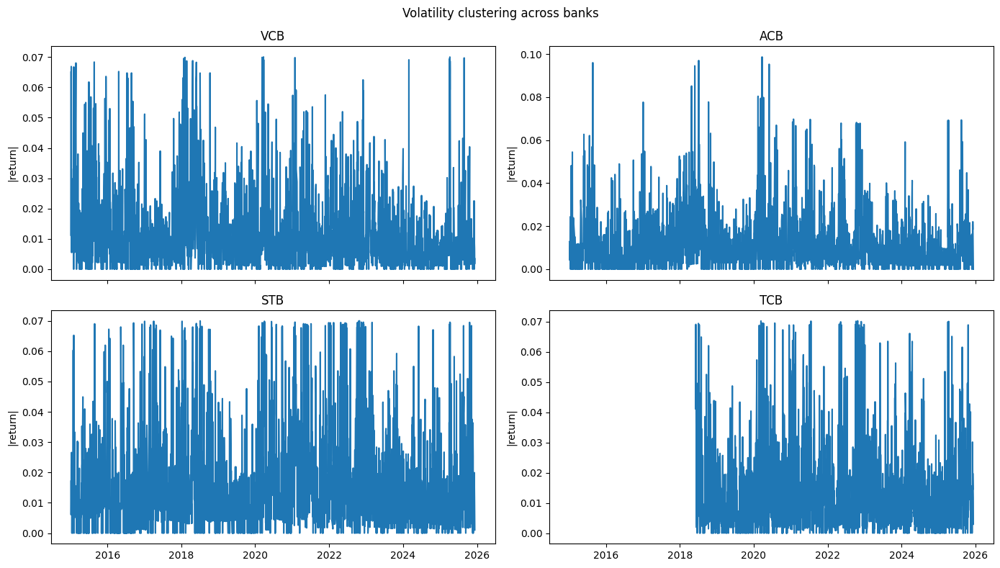

In [693]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex=True)
axes = axes.flatten()

# Absolute return (để quan sát volatility clustering)
ohlcv["abs_return"] = ohlcv["return_1d"].abs()

for ax, sym in zip(axes, symbols):
    sub = ohlcv[ohlcv["symbol"] == sym]
    ax.plot(sub["time"], sub["abs_return"])
    ax.set_title(sym)
    ax.set_ylabel("|return|")

fig.suptitle("Volatility clustering across banks")
plt.tight_layout()
plt.show()


### Seasonal decomposition

Trong phân rã chuỗi thời gian:

$$y_t = Trend_t + Seasonality_t + Residual_t$$

(hoặc dạng nhân)

**`period`** là:

> **Số lượng quan sát tạo thành một chu kỳ mùa vụ hoàn chỉnh (one full seasonal cycle)**

Nói cách khác:

* `period = k` ⟹ sau **k điểm dữ liệu**, mẫu mùa vụ lặp lại

In [694]:
def plot_seasonal_decompose(df, symbol, period=30):
    data = (
        df[df["symbol"] == symbol]
        .set_index("time")
        .asfreq("B")               # business day
        .fillna(method="ffill")
    )

    result = seasonal_decompose(
        data["close"],
        model="additive",
        period=period
    )

    fig = result.plot()
    fig.set_size_inches(20, 12)
    fig.suptitle(f"Seasonal Decomposition – {symbol}", fontsize=16)
    plt.show()


/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



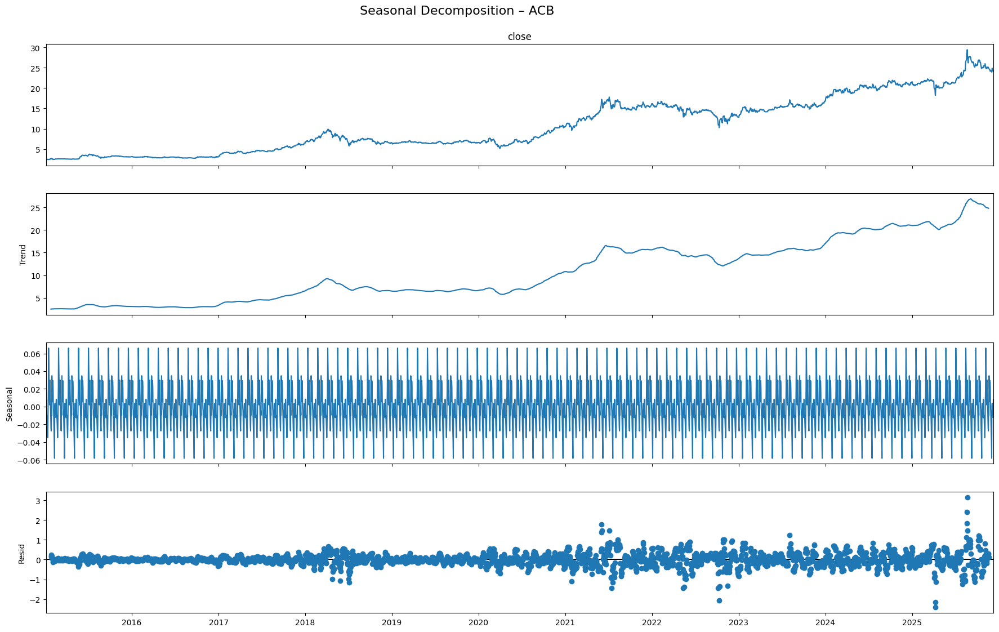

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



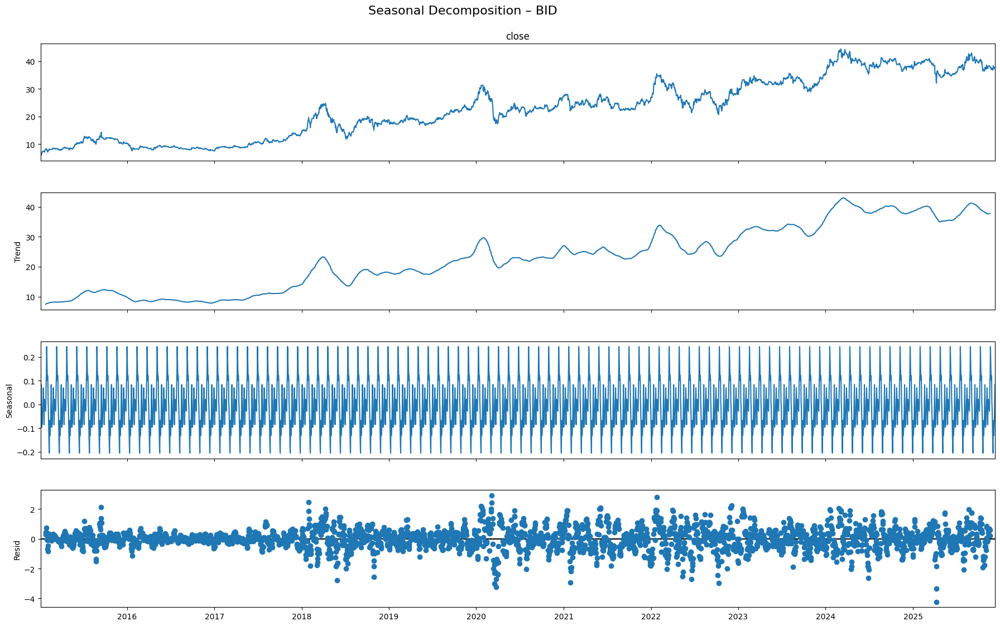

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



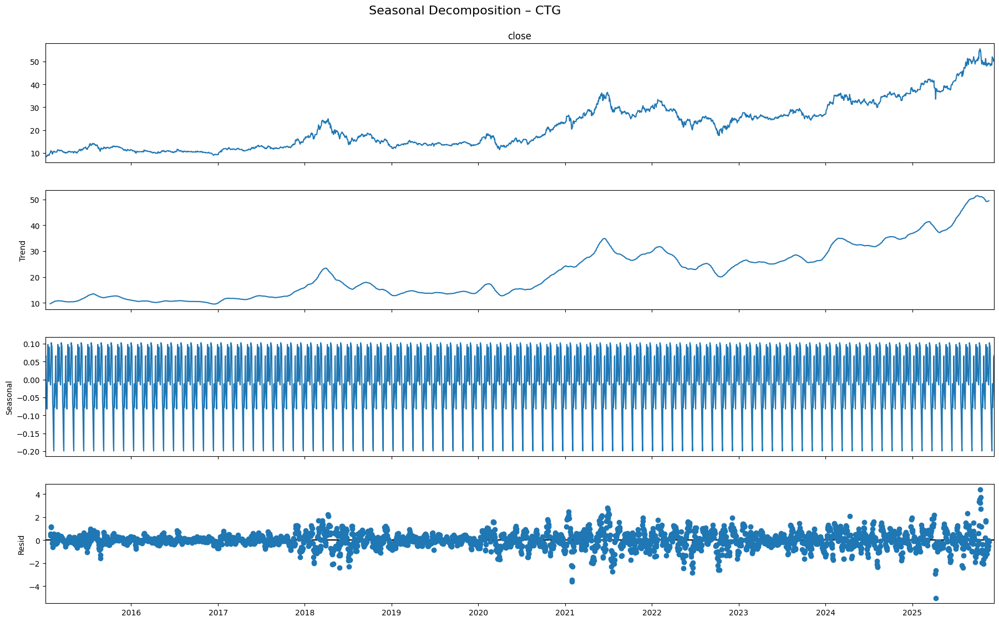

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



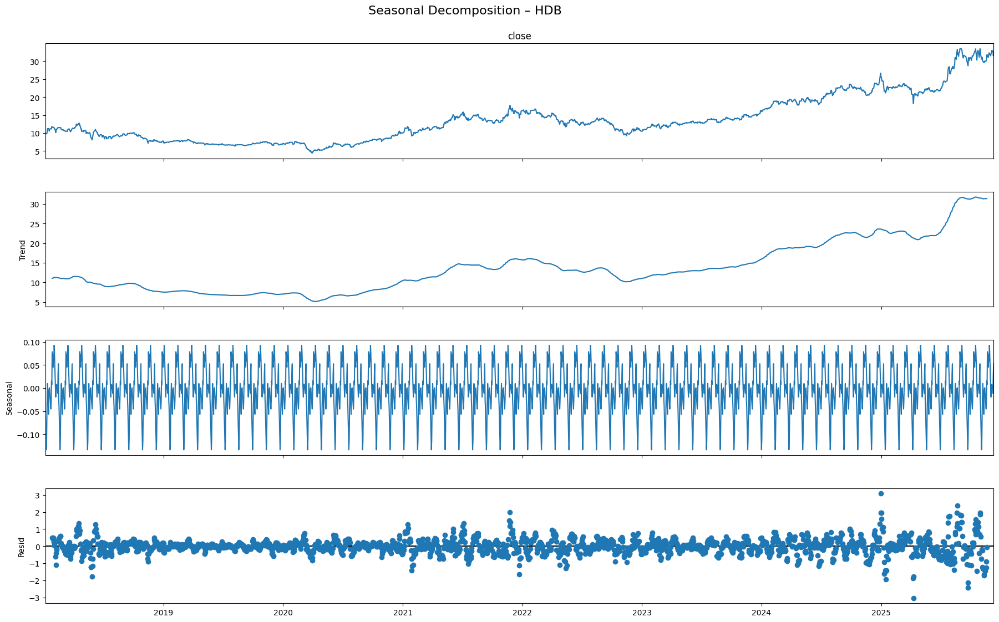

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



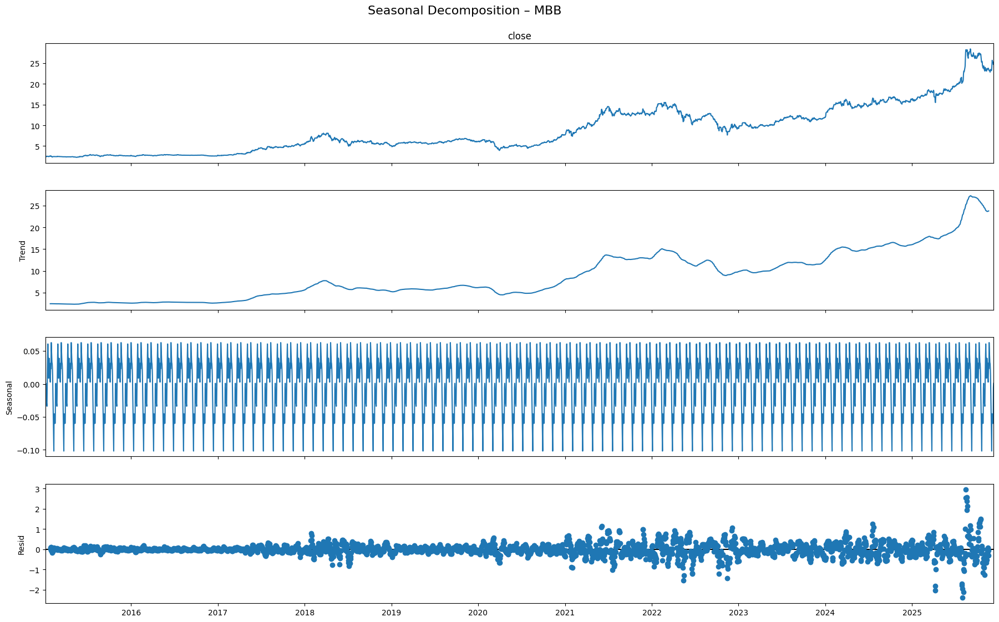

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



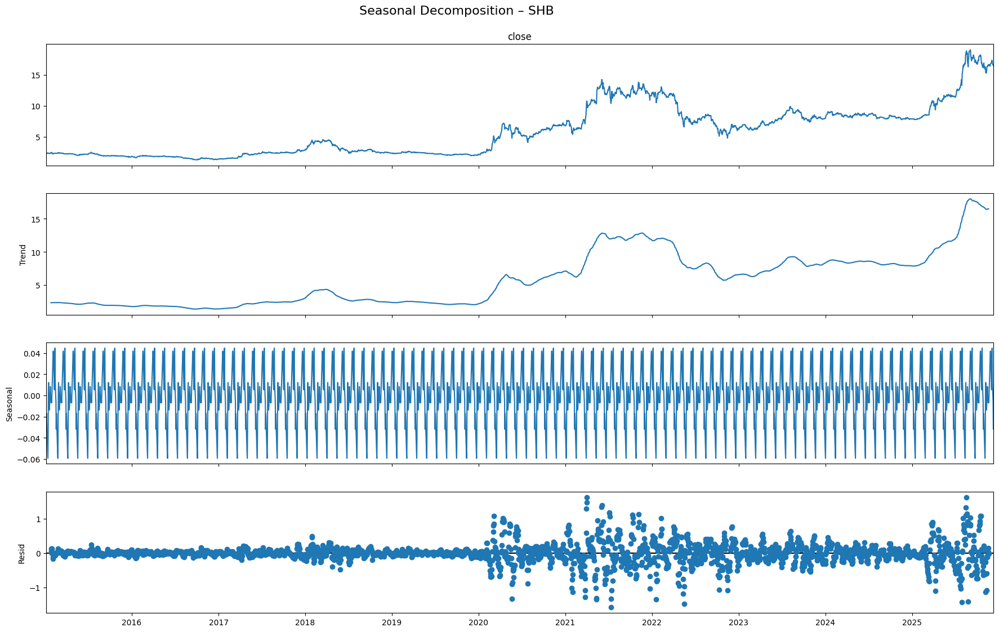

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



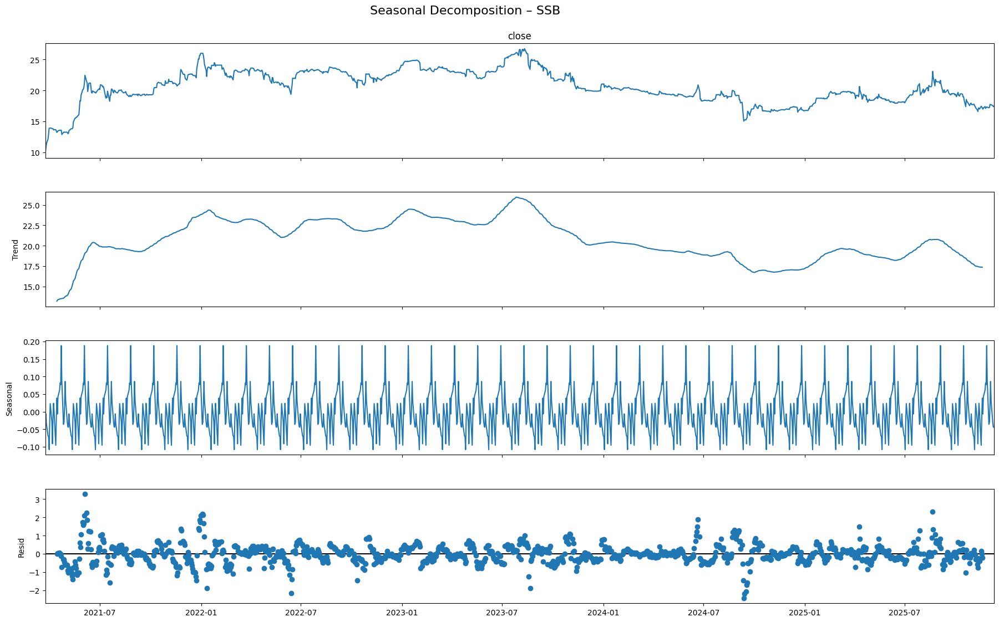

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



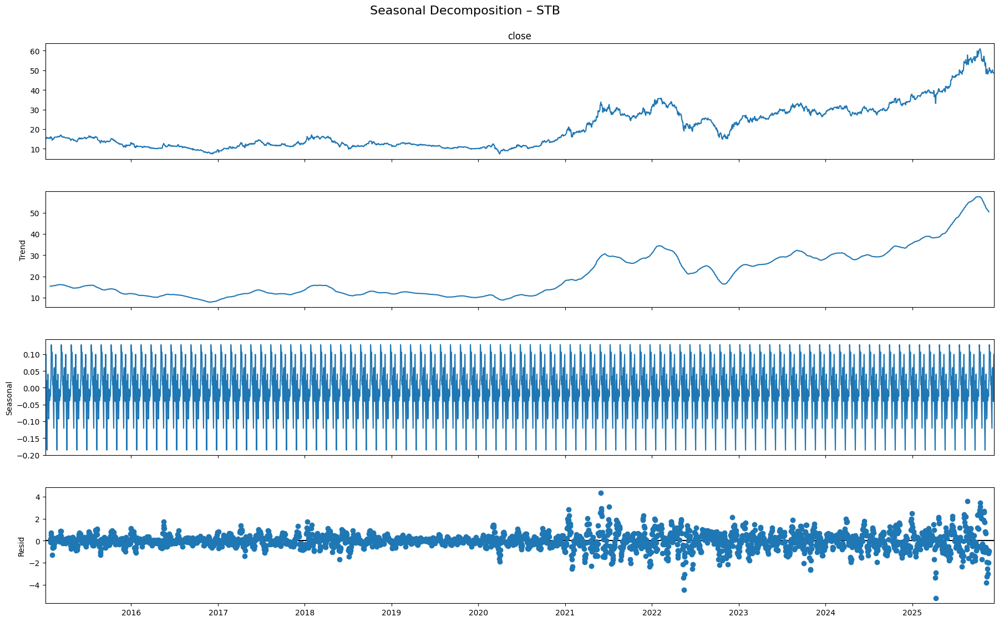

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



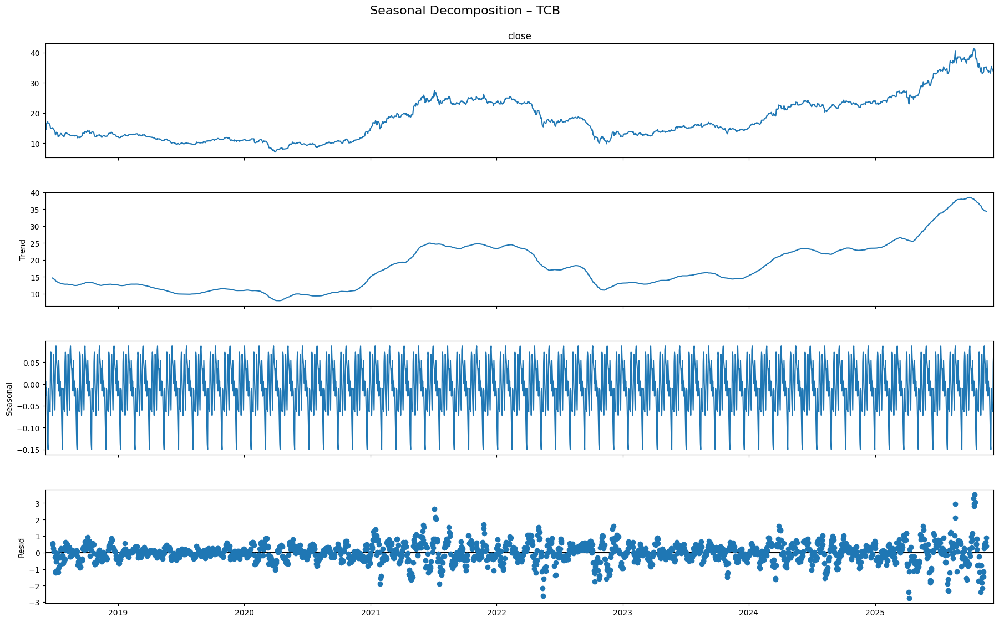

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



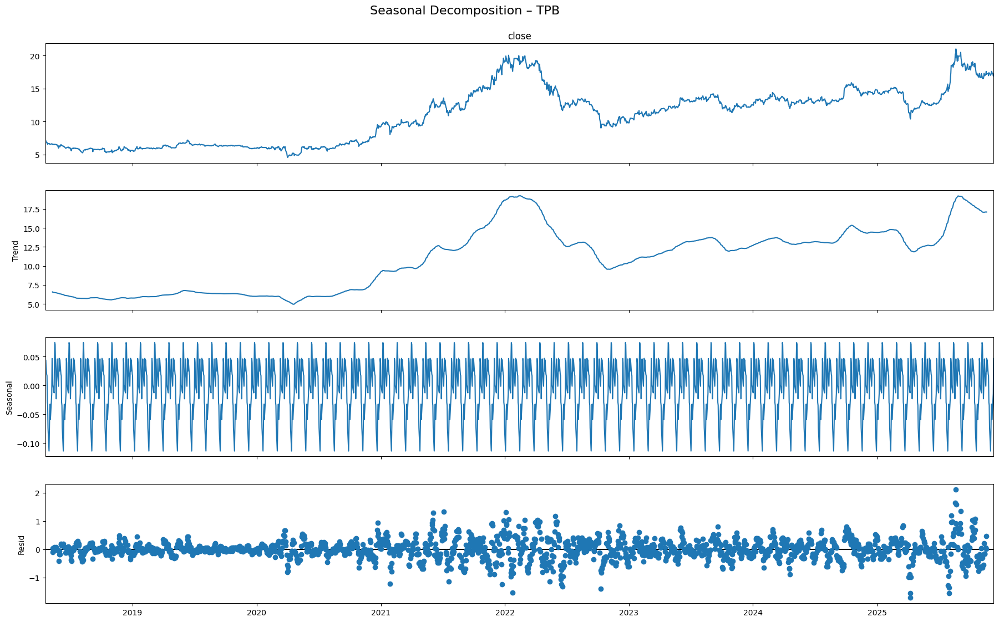

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



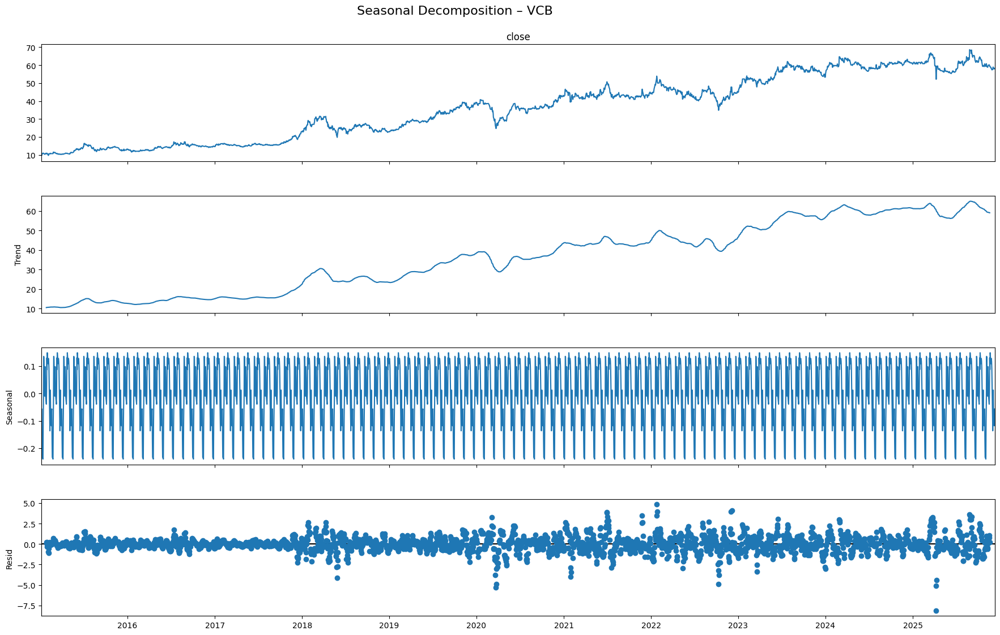

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



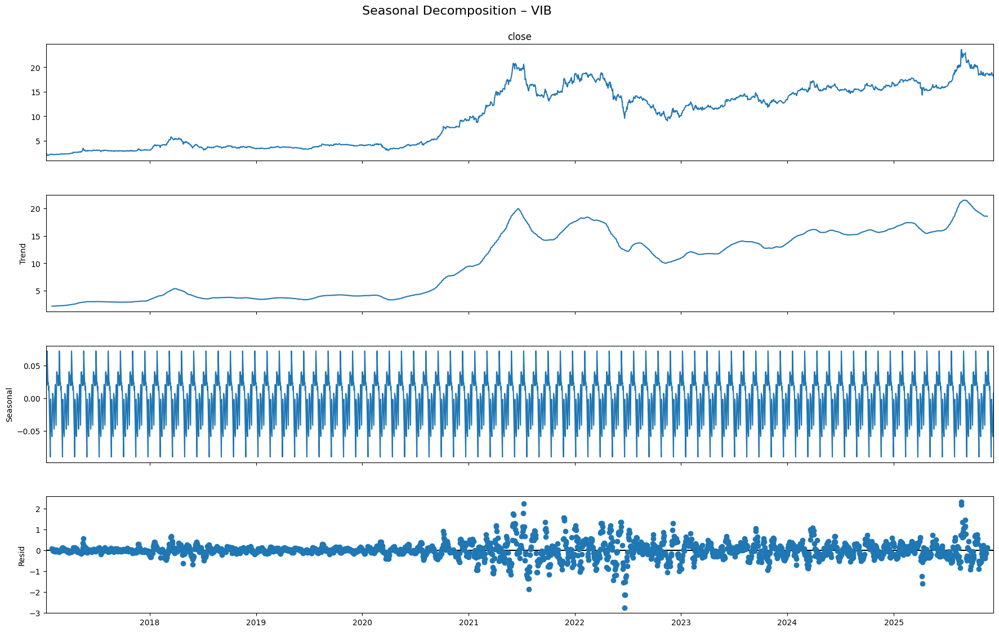

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



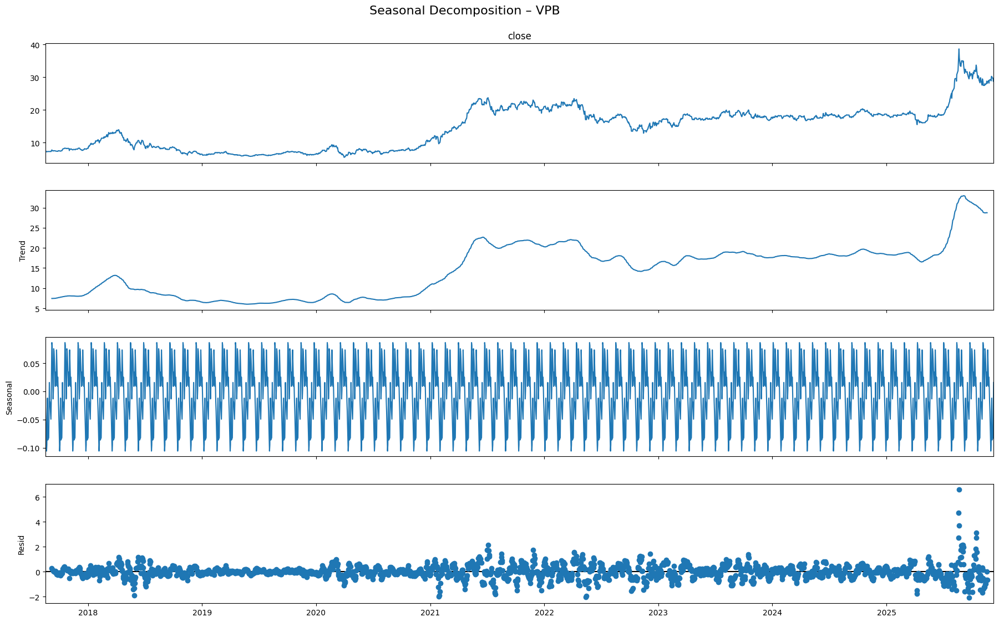

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



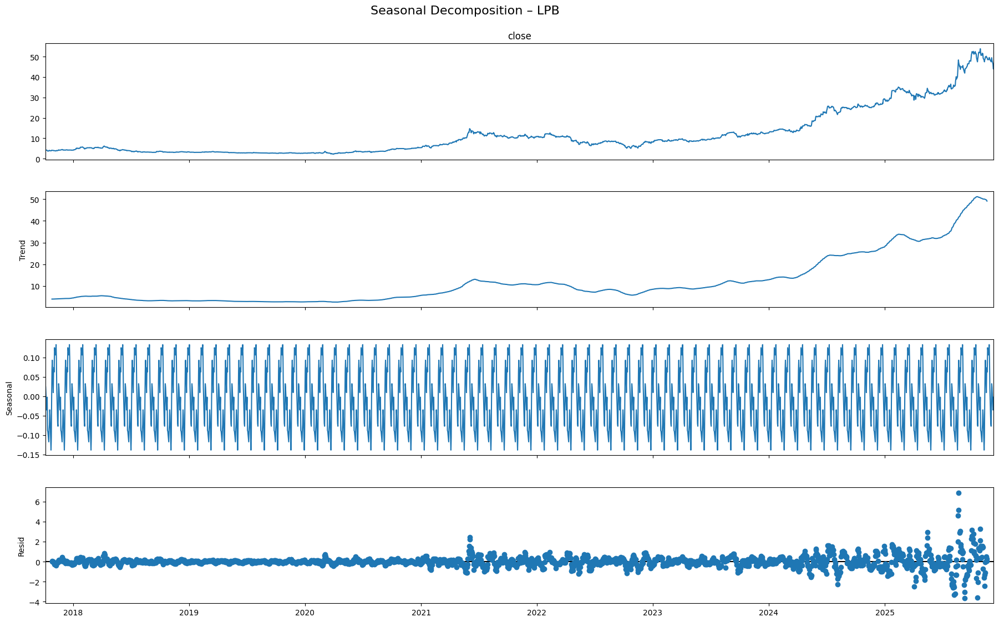

In [695]:
for symbol in BANK_TICKERS:
    plot_seasonal_decompose(ohlcv, symbol, period=30)


/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



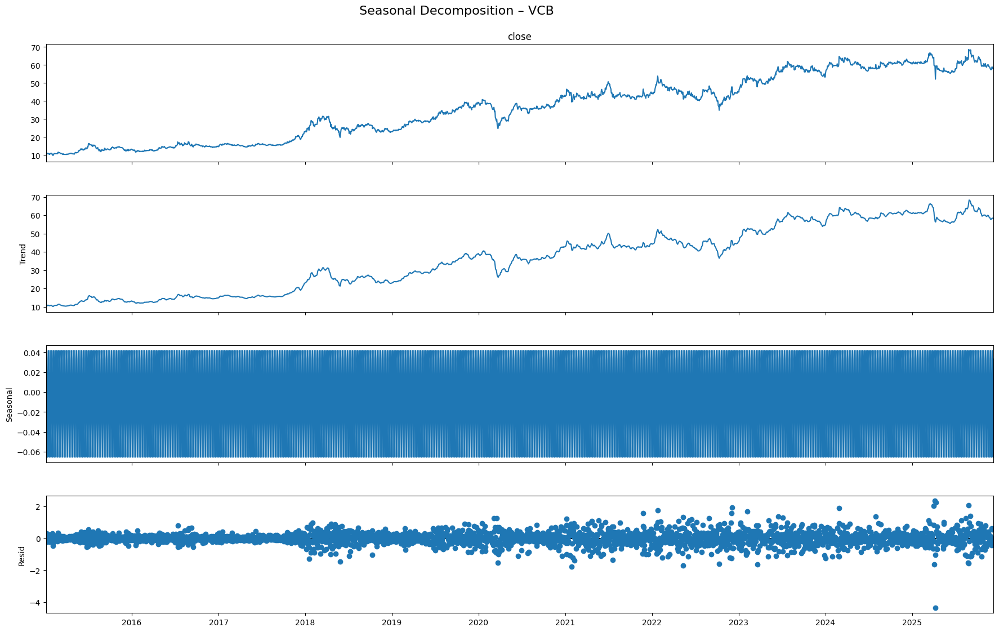

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



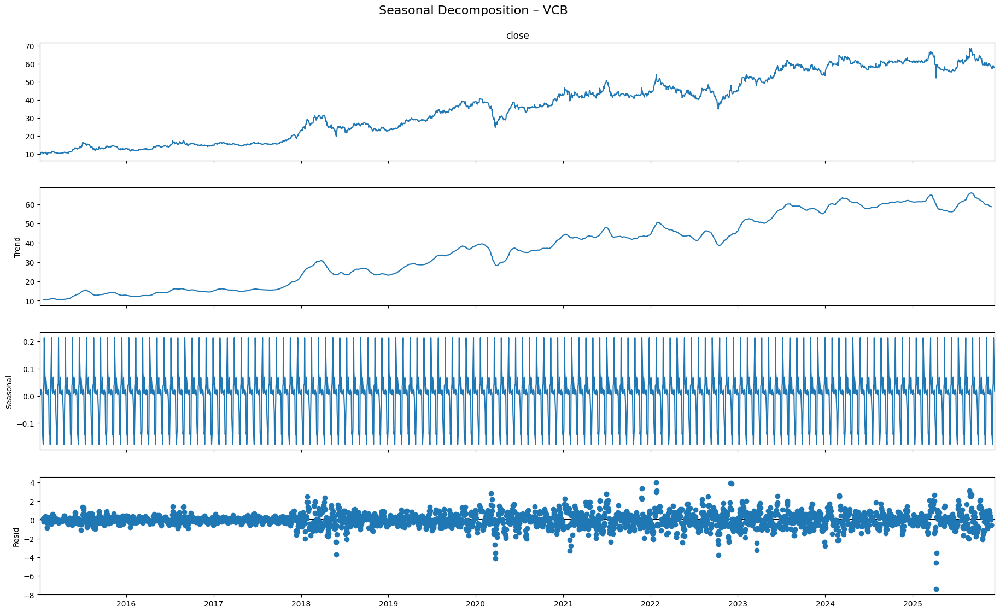

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



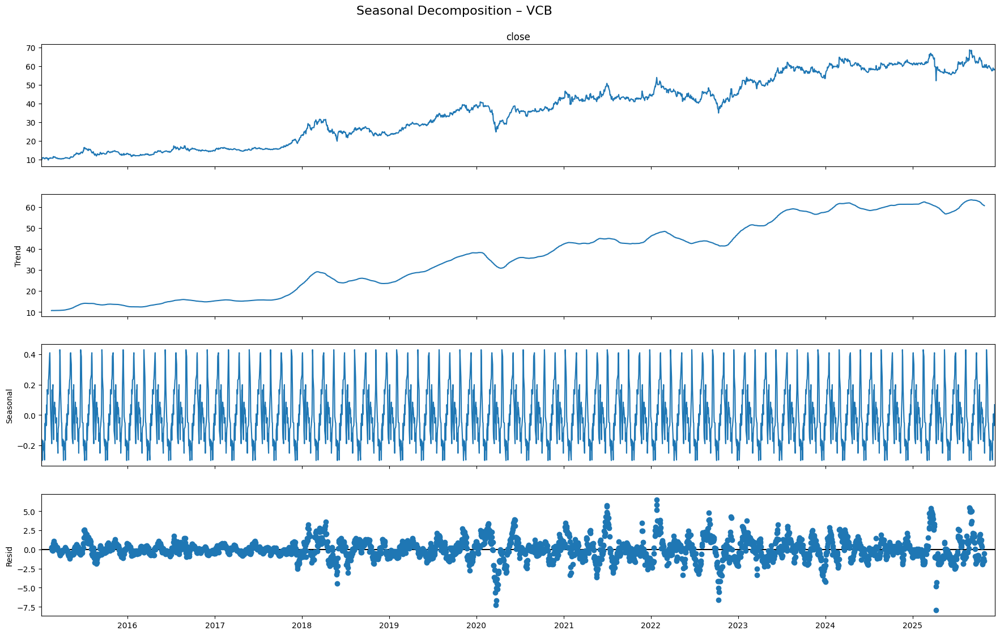

In [696]:
for p in [5, 21, 63]:
    plot_seasonal_decompose(ohlcv, "VCB", period=p)


/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



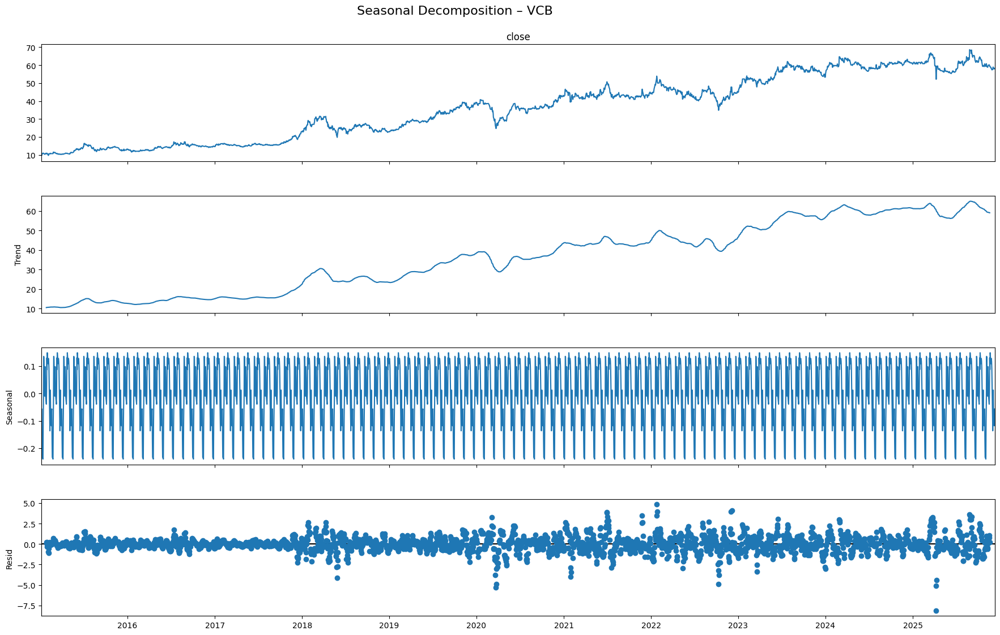

In [697]:
symbol = "VCB"
plot_seasonal_decompose(ohlcv, symbol, period=30)

/tmp/ipython-input-755592579.py:6: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



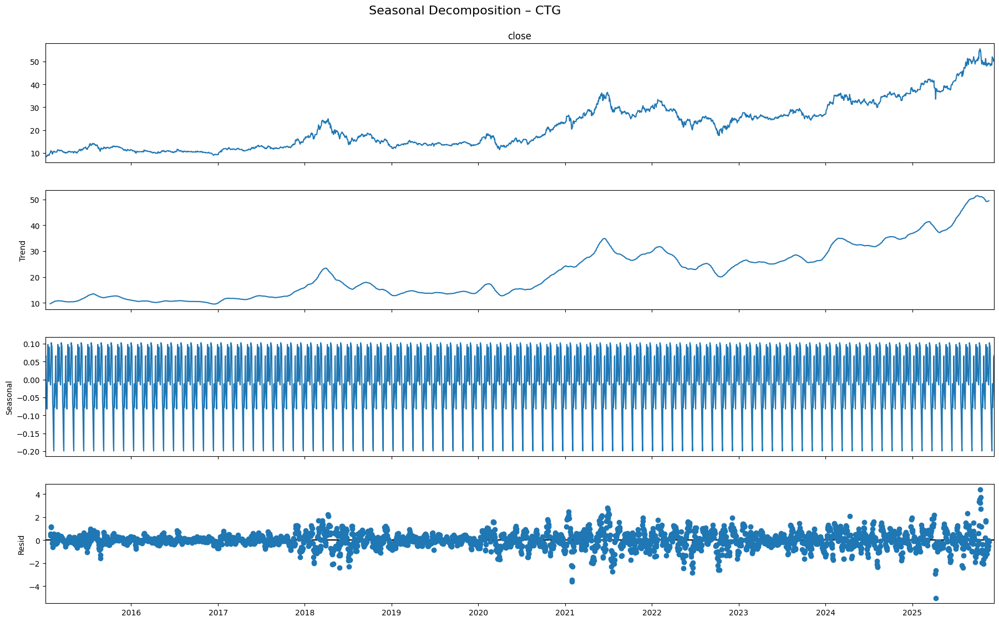

In [698]:
symbol = "CTG"
plot_seasonal_decompose(ohlcv, symbol, period=30)

### Candlestick

In [699]:
import plotly.graph_objects as go
import pandas as pd

def plot_candlestick(
    df,
    symbol,
    start=None,
    end=None,
    title=None
):
    """
    Plot candlestick chart for a given stock symbol.

    Parameters
    ----------
    df : pandas.DataFrame
        OHLCV data
    symbol : str
        Stock ticker
    start : str or None
        Start date (YYYY-MM-DD)
    end : str or None
        End date (YYYY-MM-DD)
    title : str or None
        Custom title
    """

    data = df[df["symbol"] == symbol].copy()

    if start:
        data = data[data["time"] >= start]
    if end:
        data = data[data["time"] <= end]

    data = data.sort_values("time").set_index("time")

    fig = go.Figure(
        data=[
            go.Candlestick(
                x=data.index,
                open=data["open"],
                high=data["high"],
                low=data["low"],
                close=data["close"],
                name=symbol
            )
        ]
    )

    fig.update_layout(
        title=title if title else f"Candlestick Chart – {symbol}",
        xaxis_title="Date",
        yaxis_title="Price",
        xaxis_rangeslider_visible=False,
        height=600,
        width=1000
    )

    fig.show()



In [700]:
plot_candlestick(
    ohlcv,
    symbol="ACB",
    start="2015-01-01",
    end="2025-12-10"
)


In [701]:
plot_candlestick(
    ohlcv,
    symbol="VCB",
    start="2020-01-01",
    end="2021-12-31"
)


## 1.2. Micro

In [702]:
bank_ratio = pd.read_excel(f"{ROOT_DIR}/bank.xlsx", "ratio")

# Sửa lại hàng
def fix_columns(df):
    df = df.copy()                     # Tránh side-effect
    df.columns = df.iloc[0]            # Gán row 0 làm tên cột
    df = df.iloc[1:].reset_index(drop=True)
    return df

bank_ratio = fix_columns(bank_ratio)

# Đổi tên cột
bank_ratio = bank_ratio.rename(columns={
    "CP": "symbol",
    "Năm": "year",
    "Kỳ": "quarter",
    "Nợ/VCSH": "debt_to_equity",
    "TSCĐ / Vốn CSH": "fixed_asset_to_equity",
    "Vốn CSH/Vốn điều lệ": "equity_to_charter",
    "Biên lợi nhuận ròng (%)": "net_margin",
    "ROE (%)": "roe",
    "ROA (%)": "roa",
    "Đòn bẩy tài chính": "financial_leverage",
    "Vốn hóa (Tỷ đồng)": "market_cap",
    "Số CP lưu hành (Triệu CP)": "shares_outstanding",
    "P/E": "pe",
    "P/B": "pb",
    "P/S": "ps",
    "P/Cash Flow": "p_cashflow",
    "EPS (VND)": "eps",
    "BVPS (VND)": "bvps"
})

# Chuẩn hóa Year and Quarter
bank_ratio["year"] = bank_ratio["year"].astype(int)
bank_ratio["quarter"] = bank_ratio["quarter"].astype(int)

# Tạo quarter timestampt để merge với macro
bank_ratio["quarter_date"] = pd.PeriodIndex(
    year=bank_ratio["year"],
    quarter=bank_ratio["quarter"],
    freq="Q"
).to_timestamp()

# Chuyển object -> numeric
def clean_numeric(series):
    return (
        series
        .astype(str)
        .str.replace(",", "", regex=False)
        .str.replace("%", "", regex=False)
        .replace("nan", np.nan)
        .astype(float)
    )

numeric_cols = [
    "debt_to_equity",
    "fixed_asset_to_equity",
    "equity_to_charter",
    "net_margin",
    "roe",
    "roa",
    "financial_leverage",
    "market_cap",
    "shares_outstanding",
    "pe",
    "pb",
    "ps",
    "p_cashflow",
    "eps",
    "bvps"
]

for col in numeric_cols:
    bank_ratio[col] = clean_numeric(bank_ratio[col])


# Xem lại dữ liệu
print(bank_ratio.head())
print(bank_ratio.info())

# Lọc từ 2015 - 2025
bank_ratio = bank_ratio[bank_ratio["year"] >= 2015].copy() # .copy() phải có ngoặc, không có ngoặc thì sẽ hiểu biến bank_ratio là function
print("Date range:", bank_ratio.quarter_date.min(), "→", bank_ratio.quarter_date.max())

0 symbol  year  quarter  debt_to_equity  fixed_asset_to_equity  \
0    ACB  2025        3        9.376240               0.059079   
1    ACB  2025        2        9.704445               0.061880   
2    ACB  2025        1        9.240355               0.061005   
3    ACB  2024        4        9.352125               0.064849   
4    ACB  2024        3        8.858604               0.058881   

0  equity_to_charter  net_margin       roe       roa  financial_leverage  \
0           1.779669    0.632315  0.199167  0.019117           10.376240   
1           1.697809    0.730292  0.201725  0.019587           10.704445   
2           1.695161    0.578447  0.204361  0.020059           10.240355   
3           1.624825    0.641974  0.217459  0.021215           10.352125   
4           1.535128    0.562444  0.217115  0.021717            9.858604   

0    market_cap  shares_outstanding        pe        pb        ps  p_cashflow  \
0  1.207114e+14        5.136657e+09  6.943273  1.320470  3.534728

/tmp/ipython-input-3680596554.py:39: FutureWarning:

Constructing PeriodIndex from fields is deprecated. Use PeriodIndex.from_fields instead.



#### Clean data

In [703]:
# Lấy ROA của bảng này
roa_df = bank_ratio[
    ["symbol", "year", "quarter", "roa"]
].copy()


Các bảng dưới đây không cần thiết cho train Model

In [704]:
# # Bank balance sheet
# bank_balance_sheet = pd.read_excel(f"{ROOT_DIR}/bank.xlsx", "balance_sheet")
# print(bank_balance_sheet.info())

# # Bank income statement
# bank_income_statement = pd.read_excel(f"{ROOT_DIR}/bank.xlsx", "income_statement")
# print(bank_income_statement.info())

# # Bank cash flow
# bank_cash_flow = pd.read_excel(f"{ROOT_DIR}/bank.xlsx", "cash_flow")
# print(bank_cash_flow.info())


Thiết kế bảng feature chính

In [705]:
bank_data = pd.read_excel(f"{ROOT_DIR}/data_with_metadata.xlsx", "data")

In [706]:
# Kiểm tra kiểu dữ liệu object trong bảng
cols_object = [
    "LoanGrowth",
    "DepositGrowth",
    "AssetGrowth",
    "CreditScore"
]

for col in cols_object:
    print(f"\n--- {col} ---")
    print(bank_data[col].value_counts().head())



--- LoanGrowth ---
LoanGrowth
 0.081152    1
 -           1
 0.031153    1
-0.054492    1
 0.026161    1
Name: count, dtype: int64

--- DepositGrowth ---
DepositGrowth
-0.02487     1
 -           1
 0.049435    1
-0.058595    1
 0.033191    1
Name: count, dtype: int64

--- AssetGrowth ---
AssetGrowth
 0.066605    1
 -           1
-0.040453    1
-0.049269    1
 0.03901     1
Name: count, dtype: int64

--- CreditScore ---
CreditScore
0           3
0.008052    1
0.007308    1
0.008148    1
0.014171    1
Name: count, dtype: int64


In [707]:
# Chuẩn hóa tên côt
bank_data = bank_data.rename(columns={
    "CP": "symbol",
    "Năm": "year",
    "Kỳ": "quarter",
    "ROE (%)": "ROE",
    "P/B": "P_B",
    "Assets/Equity": "Assets_Equity",
    "roa": "ROA",

})

In [708]:
# Thêm ROA vào bảng

bank_data = bank_data.merge(
    roa_df,
    on=["symbol", "year", "quarter"],
    how="left"
)

bank_data = bank_data.rename(columns={"roa": "ROA"})

print(bank_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   symbol         696 non-null    object 
 1   year           696 non-null    int64  
 2   quarter        696 non-null    int64  
 3   P_B            653 non-null    float64
 4   ROE            598 non-null    float64
 5   LoanGrowth     696 non-null    object 
 6   DepositGrowth  696 non-null    object 
 7   LDR            696 non-null    float64
 8   CIR            696 non-null    float64
 9   CreditScore    696 non-null    object 
 10  AssetGrowth    696 non-null    object 
 11  Assets_Equity  696 non-null    float64
 12  ROA            508 non-null    float64
dtypes: float64(6), int64(2), object(5)
memory usage: 70.8+ KB
None


In [709]:
# Kiểm tra missing
bank_data.isnull().mean().sort_values(ascending=False)


,0
ROA,0.270115
ROE,0.140805
P_B,0.061782
quarter,0.000000
symbol,0.000000
year,0.000000
LoanGrowth,0.000000
LDR,0.000000
DepositGrowth,0.000000
CIR,0.000000


In [710]:
bank_data["quarter_date"] = pd.PeriodIndex(
    year=bank_data["year"],
    quarter=bank_data["quarter"],
    freq="Q"
).to_timestamp()


/tmp/ipython-input-2793639658.py:1: FutureWarning:

Constructing PeriodIndex from fields is deprecated. Use PeriodIndex.from_fields instead.



In [711]:
bank_data = bank_data[
    [
        "symbol",
        "quarter_date",
        "ROE",
        "ROA",
        "P_B",
        "LDR",
        "CIR",
        "Assets_Equity"
    ]
].sort_values(["symbol", "quarter_date"])


In [712]:
bank_data = bank_data[
    bank_data["quarter_date"] >= pd.Timestamp("2015-01-01")
].copy()

In [713]:
print(bank_data.info())
print("Date range:", bank_data.quarter_date.min(), "→", bank_data.quarter_date.max())
print("\nSymbols:", bank_data.symbol.nunique())


<class 'pandas.core.frame.DataFrame'>
Index: 595 entries, 8 to 695
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   symbol         595 non-null    object        
 1   quarter_date   595 non-null    datetime64[ns]
 2   ROE            508 non-null    float64       
 3   ROA            508 non-null    float64       
 4   P_B            554 non-null    float64       
 5   LDR            595 non-null    float64       
 6   CIR            595 non-null    float64       
 7   Assets_Equity  595 non-null    float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 41.8+ KB
None
Date range: 2015-01-01 00:00:00 → 2025-07-01 00:00:00

Symbols: 14


In [714]:
bank_data.groupby("symbol")["quarter_date"].agg(["min", "max", "count"])

,min,max,count
symbol,,,
ACB,2015-01-01,2025-07-01,43
BID,2015-01-01,2025-07-01,43
CTG,2015-01-01,2025-07-01,43
HDB,2015-01-01,2025-07-01,41
LPB,2015-01-01,2025-07-01,43
MBB,2015-01-01,2025-07-01,43
SHB,2015-01-01,2025-07-01,43
SSB,2015-04-01,2025-07-01,40
STB,2015-01-01,2025-07-01,43


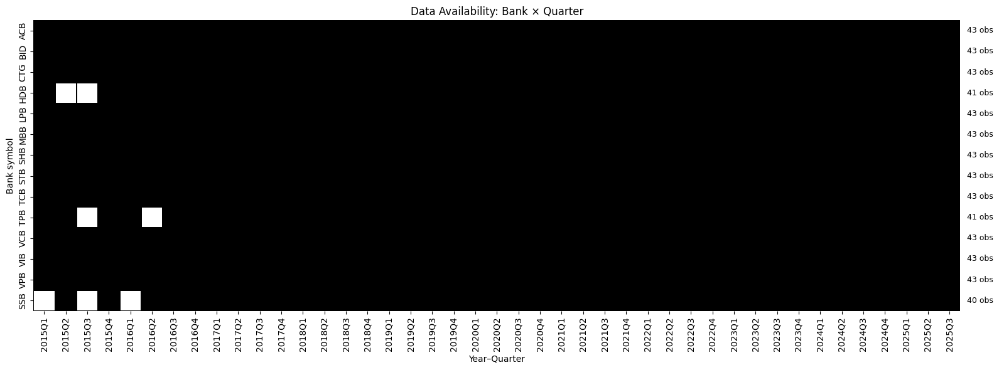

In [715]:
import matplotlib.pyplot as plt
import seaborn as sns

# Tạo label Year–Quarter gọn
bank_data["year_quarter"] = (
    bank_data["quarter_date"].dt.year.astype(str)
    + "Q"
    + (((bank_data["quarter_date"].dt.month - 1) // 3) + 1).astype(str)
)

# Coverage matrix
coverage = (
    bank_data
    .assign(value=1)
    .pivot_table(
        index="symbol",
        columns="year_quarter",
        values="value",
        fill_value=0
    )
)

# Sort theo quý xuất hiện đầu tiên
first_q = (
    bank_data.groupby("symbol")["quarter_date"]
    .min()
    .sort_values()
)
coverage = coverage.loc[first_q.index]

# Đếm số quý
n_obs = coverage.sum(axis=1)

# Plot
plt.figure(figsize=(16, 6))
ax = sns.heatmap(
    coverage,
    cmap="Greys",
    cbar=False,
    linewidths=0.2,
    linecolor="black"
)

# Annotate số obs bên phải
for i, (sym, n) in enumerate(n_obs.items()):
    ax.text(
        coverage.shape[1] + 0.3,
        i + 0.5,
        f"{int(n)} obs",
        va="center",
        fontsize=9
    )

ax.set_title("Data Availability: Bank × Quarter")
ax.set_xlabel("Year–Quarter")
ax.set_ylabel("Bank symbol")

plt.tight_layout()
plt.show()


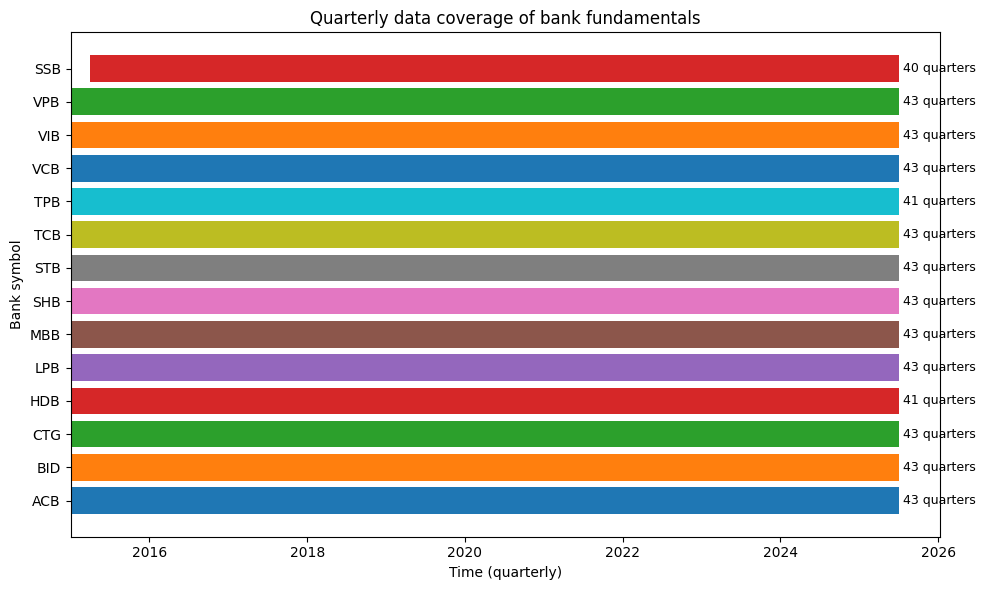

In [716]:
# Horizontal bar chart for quarterly coverage per bank with number of quarters annotated

import pandas as pd
import matplotlib.pyplot as plt

# Assume bank_micro_clean exists; if not, reconstruct minimal example from description
# bank_micro_clean must have columns: symbol, quarter_date

# Compute coverage stats
coverage = (
    bank_data
    .groupby("symbol")["quarter_date"]
    .agg(start_date="min", end_date="max", n_quarters="count")
    .sort_values("start_date")
    .reset_index()
)

# Plot
plt.figure(figsize=(10, 6))

for i, row in coverage.iterrows():
    plt.barh(
        row["symbol"],
        (row["end_date"] - row["start_date"]).days,
        left=row["start_date"]
    )
    plt.text(
        row["end_date"],
        i,
        f" {int(row['n_quarters'])} quarters",
        va="center",
        fontsize=9
    )

plt.xlabel("Time (quarterly)")
plt.ylabel("Bank symbol")
plt.title("Quarterly data coverage of bank fundamentals")
plt.tight_layout()
plt.show()


### EDA
 NHÓM A – Profitability structure

> _“Lợi nhuận của ngân hàng đến từ đâu và ổn định đến mức nào?”_

### A1. ROE và ROA của các ngân hàng phân bố ra sao?

* Mean, median, dispersion
    
* Ai cao? Ai ổn định?
    

### A2. ROE cao có đồng nghĩa ROA cao không?

→ Phân biệt:

* **hiệu quả hoạt động (ROA)**
    
* **khuếch đại lợi nhuận (leverage → ROE)**
    

Insight mong đợi:

> Có ngân hàng ROE cao nhưng ROA trung bình → phụ thuộc leverage

* * *

# NHÓM B – Leverage & risk

> _“Ngân hàng đạt ROE bằng hiệu quả hay bằng đòn bẩy?”_

### B1. Assets / Equity phân bố thế nào trong ngành?

* Có bao nhiêu bank leverage cao bất thường?
    

### B2. Assets/Equity ảnh hưởng ROE và ROA ra sao?

* ROE tăng nhanh hơn ROA khi leverage tăng?
    
* Volatility ROE tăng theo leverage?
    

Insight:

> Leverage giúp tăng ROE nhưng làm lợi nhuận kém ổn định

* * *

# NHÓM C – Lending & efficiency

> _“Cho vay nhiều hơn có thực sự tốt?”_

### C1. LDR cao có đi kèm ROE / ROA cao không?

* Quan hệ tuyến tính hay phi tuyến?
    
* Có ngưỡng LDR “nguy hiểm”?
    

### C2. CIR tác động thế nào đến ROE?

* Ngân hàng vận hành hiệu quả có lợi nhuận bền vững hơn?
    

Insight:

> Cho vay nhiều **chỉ tốt khi kiểm soát được chi phí**

* * *

# NHÓM D – Valuation & quality

> _“Thị trường định giá ngân hàng dựa trên điều gì?”_

### D1. P/B có tương quan với ROE không?

→ Kiểm chứng lý thuyết:

> Bank ROE cao → P/B cao?

### D2. Bank ROE ổn định có được premium valuation?

* ROE std thấp → P/B cao hơn?
    

Insight:

> Thị trường không chỉ trả giá cho ROE cao, mà cho **ROE bền vững**

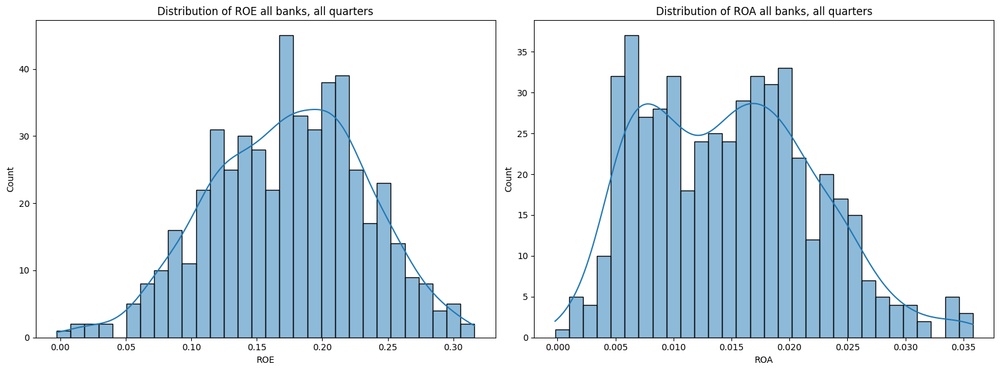

In [717]:
# Distribution toàn ngành
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(bank_data["ROE"], bins=30, kde=True, ax=axes[0])
axes[0].set_title("Distribution of ROE all banks, all quarters")

sns.histplot(bank_data["ROA"], bins=30, kde=True, ax=axes[1])
axes[1].set_title("Distribution of ROA all banks, all quarters")

plt.tight_layout()
plt.show()


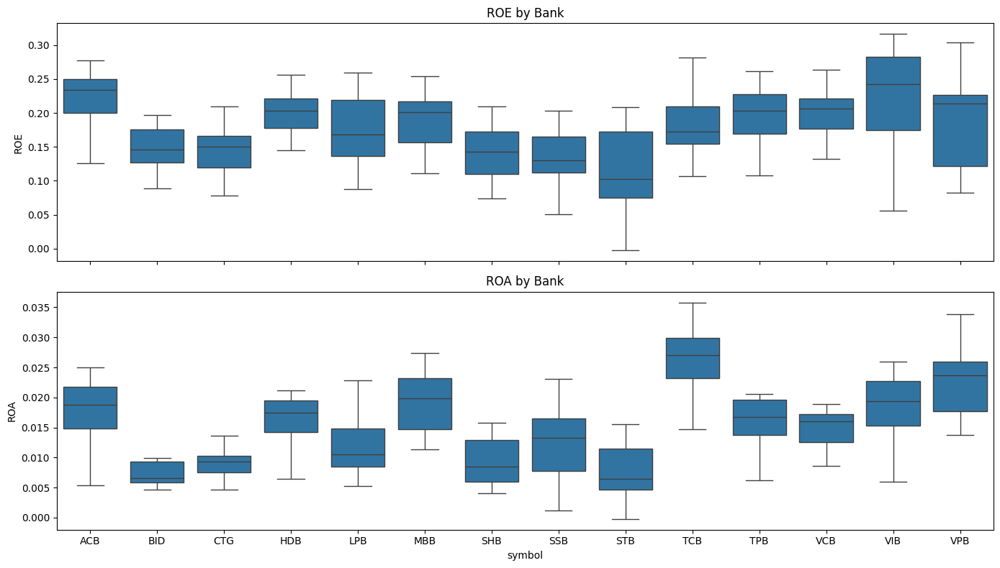

In [718]:
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

sns.boxplot(data=bank_data, x="symbol", y="ROE", showfliers=False, ax=axes[0])
axes[0].set_title("ROE by Bank")

sns.boxplot(data=bank_data, x="symbol", y="ROA", showfliers=False, ax=axes[1])
axes[1].set_title("ROA by Bank")

plt.tight_layout()
plt.show()


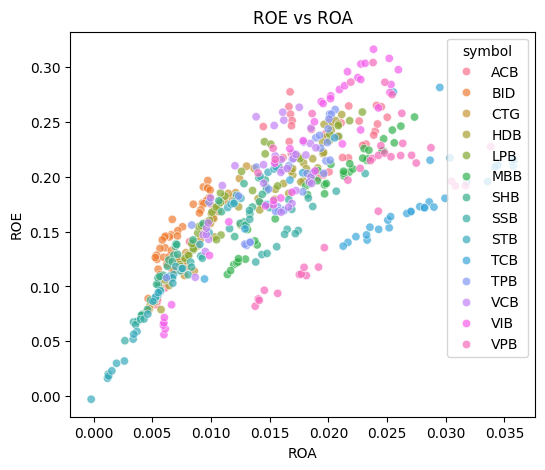

In [719]:
plt.figure(figsize=(6, 5))
sns.scatterplot(data=bank_data, x="ROA", y="ROE", hue="symbol", alpha=0.7)
plt.title("ROE vs ROA")
plt.show()


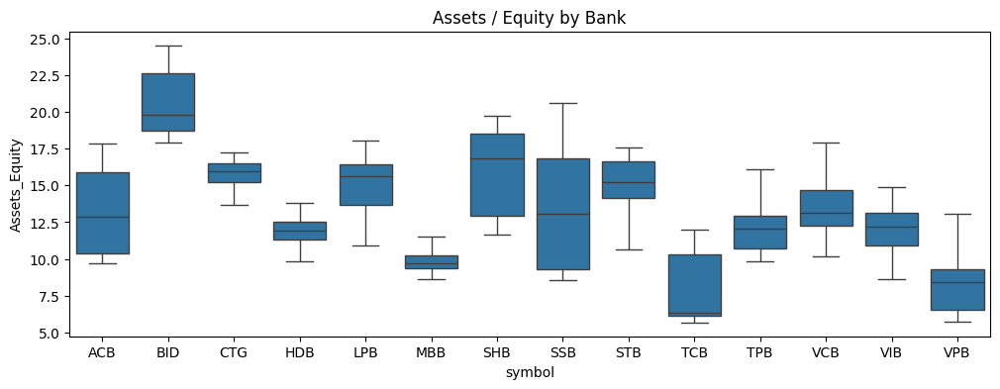

In [720]:
plt.figure(figsize=(12, 4))
sns.boxplot(data=bank_data, x="symbol", y="Assets_Equity", showfliers=False)
plt.title("Assets / Equity by Bank")
plt.show()


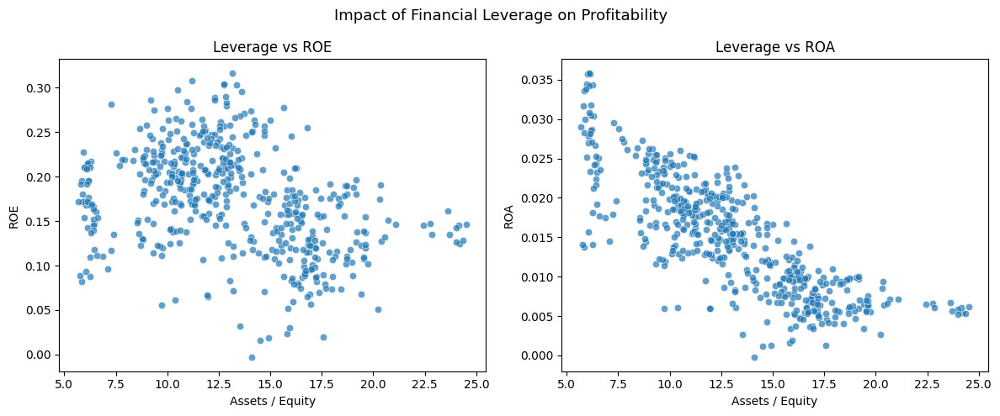

In [721]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharex=True)

# Leverage vs ROE
sns.scatterplot(
    data=bank_data,
    x="Assets_Equity",
    y="ROE",
    alpha=0.7,
    ax=axes[0]
)
axes[0].set_title("Leverage vs ROE")
axes[0].set_xlabel("Assets / Equity")
axes[0].set_ylabel("ROE")

# Leverage vs ROA
sns.scatterplot(
    data=bank_data,
    x="Assets_Equity",
    y="ROA",
    alpha=0.7,
    ax=axes[1]
)
axes[1].set_title("Leverage vs ROA")
axes[1].set_xlabel("Assets / Equity")
axes[1].set_ylabel("ROA")

fig.suptitle("Impact of Financial Leverage on Profitability", fontsize=13)
plt.tight_layout()
plt.show()


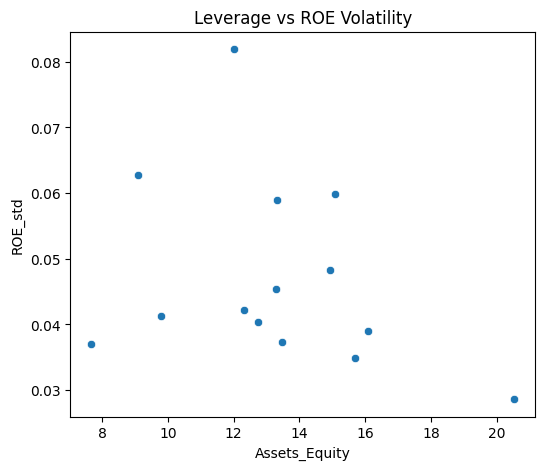

In [722]:
roe_vol = (
    bank_data
    .groupby("symbol")["ROE"]
    .std()
    .reset_index(name="ROE_std")
)

leverage_mean = (
    bank_data
    .groupby("symbol")["Assets_Equity"]
    .mean()
    .reset_index()
)

roe_vol = roe_vol.merge(leverage_mean, on="symbol")

plt.figure(figsize=(6, 5))
sns.scatterplot(data=roe_vol, x="Assets_Equity", y="ROE_std")
plt.title("Leverage vs ROE Volatility")
plt.show()


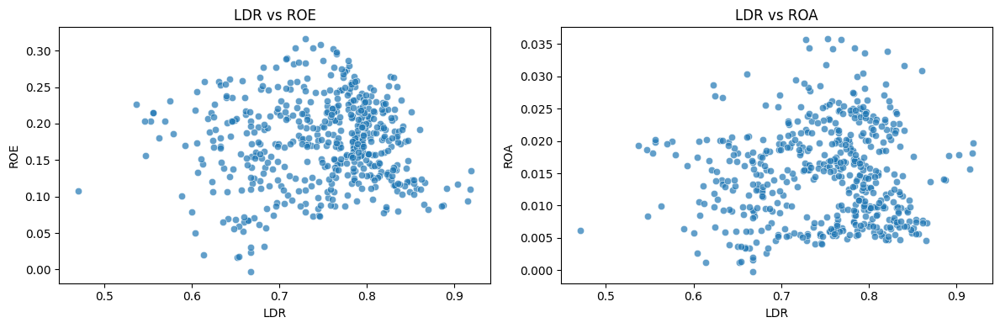

In [723]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.scatterplot(data=bank_data, x="LDR", y="ROE", ax=axes[0], alpha=0.7)
axes[0].set_title("LDR vs ROE")

sns.scatterplot(data=bank_data, x="LDR", y="ROA", ax=axes[1], alpha=0.7)
axes[1].set_title("LDR vs ROA")

plt.tight_layout()
plt.show()


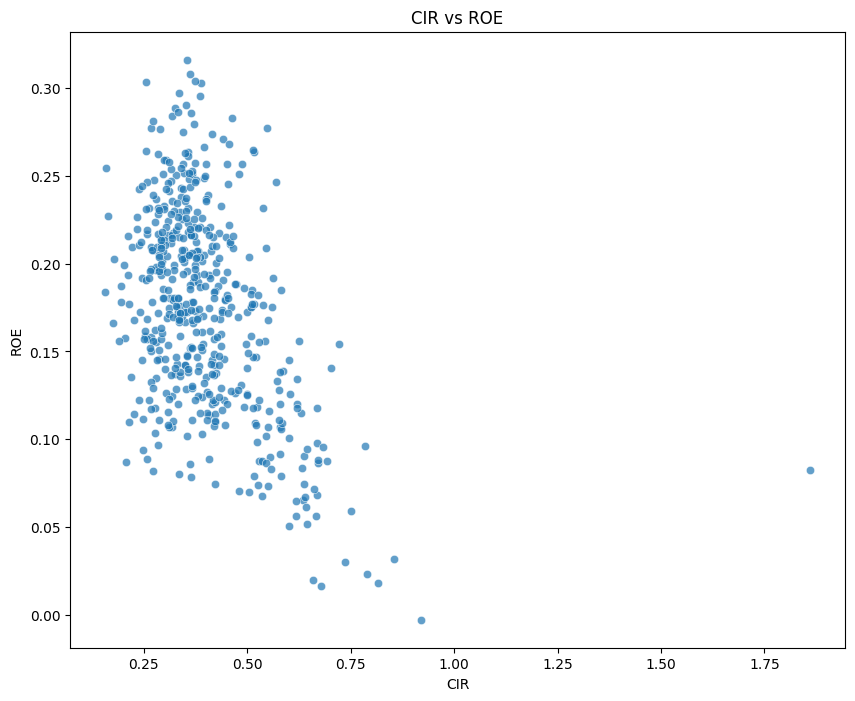

In [724]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=bank_data, x="CIR", y="ROE", alpha=0.7)
plt.title("CIR vs ROE")
plt.show()


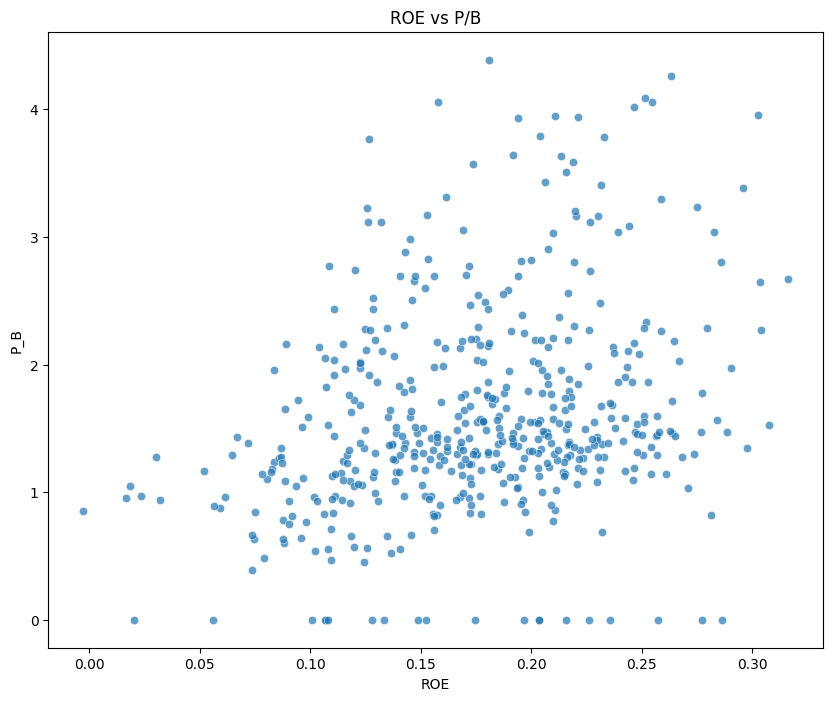

In [725]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=bank_data, x="ROE", y="P_B", alpha=0.7)
plt.title("ROE vs P/B")
plt.show()


In [726]:
roe_stats = (
    bank_data
    .groupby("symbol")
    .agg(
        ROE_mean=("ROE", "mean"),
        ROE_std=("ROE", "std"),
        PB_mean=("P_B", "mean")
    )
    .reset_index()
)


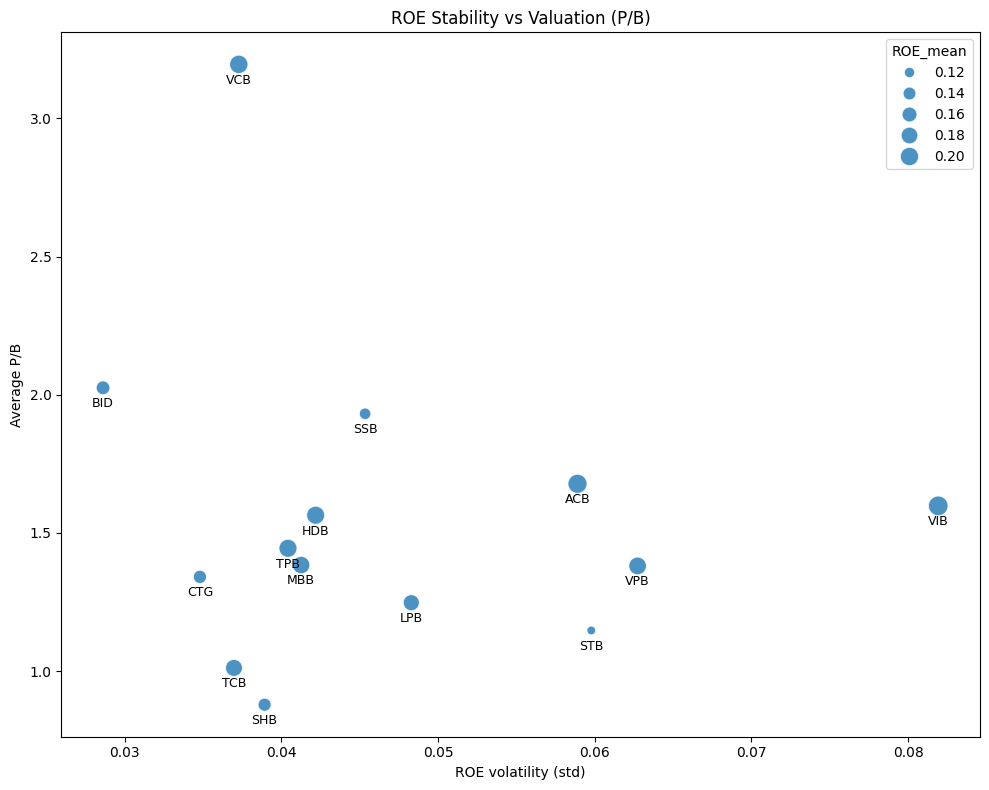

In [727]:
plt.figure(figsize=(10, 8))

ax = sns.scatterplot(
    data=roe_stats,
    x="ROE_std",
    y="PB_mean",
    size="ROE_mean",
    sizes=(40, 200),
    alpha=0.8,

)

# Annotate với offset (pixel)
for _, row in roe_stats.iterrows():
    ax.annotate(
        row["symbol"],
        (row["ROE_std"], row["PB_mean"]),
        textcoords="offset points",
        xytext=(0, -14),   # dịch xuống 12px
        ha="center",
        fontsize=9
    )

plt.title("ROE Stability vs Valuation (P/B)")
plt.xlabel("ROE volatility (std)")
plt.ylabel("Average P/B")
plt.tight_layout()
plt.show()


In [728]:
# Bảng tổng hợp xem bank nào cao, bank nào ổn định
profit_summary = (
    bank_data
    .groupby("symbol")
    .agg(
        ROE_mean=("ROE","mean"),
        ROE_median=("ROE","median"),
        ROE_std=("ROE","std"),
        ROA_mean=("ROA","mean"),
        ROA_median=("ROA","median"),
        ROA_std=("ROA","std"),
        n_quarters=("quarter_date","count")
    )
    .sort_values("ROE_mean", ascending=False)
)

display(profit_summary)


,ROE_mean,ROE_median,ROE_std,ROA_mean,ROA_median,ROA_std,n_quarters
symbol,,,,,,,
VIB,0.217539,0.242612,0.081920,0.017629,0.019393,0.006364,43
ACB,0.209875,0.234267,0.058895,0.017028,0.018837,0.006429,43
VCB,0.200471,0.206780,0.037278,0.014954,0.016046,0.003294,43
HDB,0.196543,0.203194,0.042183,0.016218,0.017452,0.004180,41
TPB,0.196194,0.202996,0.040417,0.016368,0.016779,0.003746,41
VPB,0.191259,0.213563,0.062733,0.022248,0.023669,0.005543,43
MBB,0.188951,0.200693,0.041258,0.019390,0.019821,0.004774,43
TCB,0.182778,0.172719,0.036970,0.026204,0.026987,0.006463,43
LPB,0.173456,0.167747,0.048288,0.012100,0.010466,0.005041,43


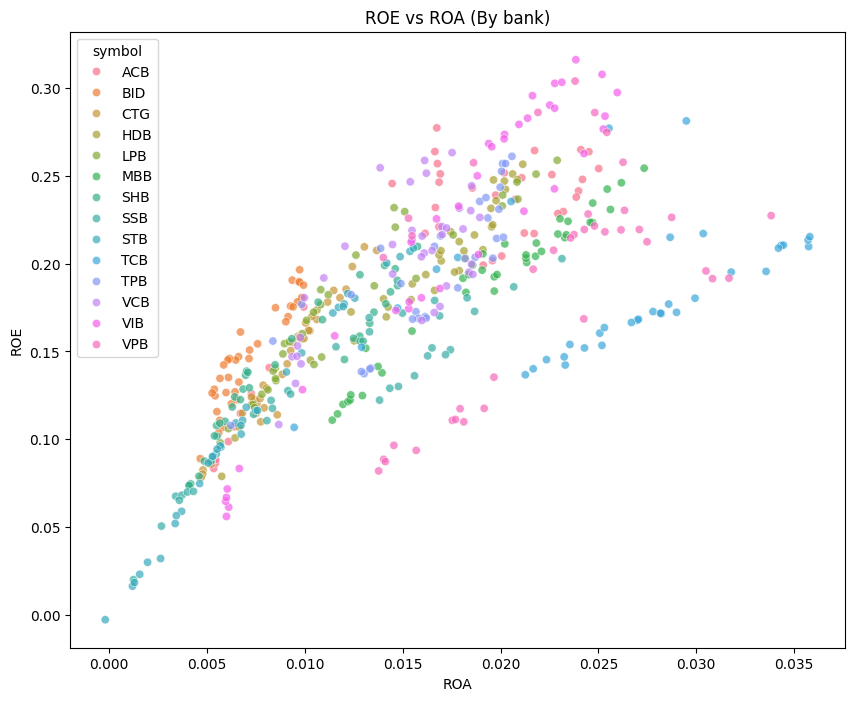

In [729]:
# ROE cao có đồng nghĩa với ROA cao không
plt.figure(figsize=(10, 8))
sns.scatterplot(data=bank_data, x="ROA", y="ROE", hue="symbol", alpha=0.7)
plt.title("ROE vs ROA (By bank)")
plt.show()


In [730]:
corr_roe_roa = bank_data[["ROE","ROA"]].corr()
display(corr_roe_roa)


,ROE,ROA
ROE,1.000000,0.748044
ROA,0.748044,1.000000


In [731]:
# Bank có ROE cao nhưng ROA trung bình

tmp = profit_summary.copy()

# Define thresholds by quantiles (EDA-friendly)
roe_high = tmp["ROE_mean"].quantile(0.75)
roa_mid_low = tmp["ROA_mean"].quantile(0.50)

candidates = tmp[(tmp["ROE_mean"] >= roe_high) & (tmp["ROA_mean"] <= roa_mid_low)]
display(candidates.sort_values(["ROE_mean"], ascending=False))


,ROE_mean,ROE_median,ROE_std,ROA_mean,ROA_median,ROA_std,n_quarters
symbol,,,,,,,
VCB,0.200471,0.20678,0.037278,0.014954,0.016046,0.003294,43


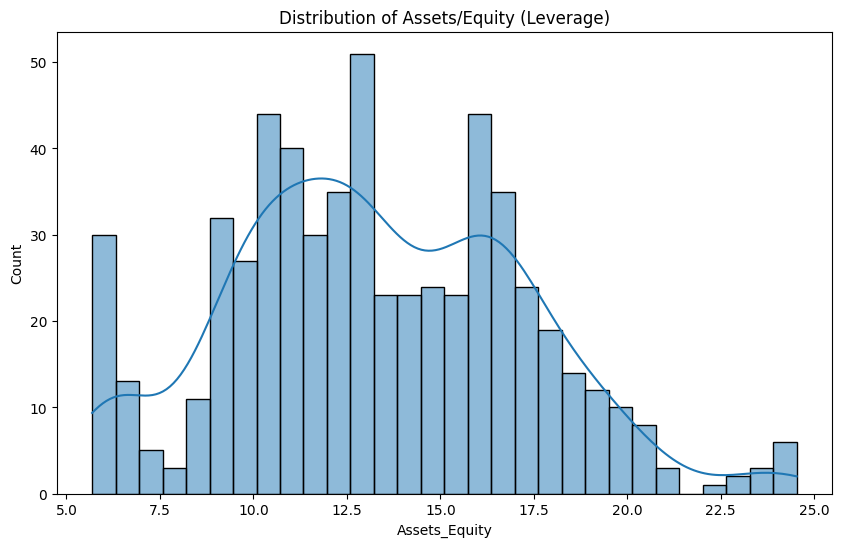

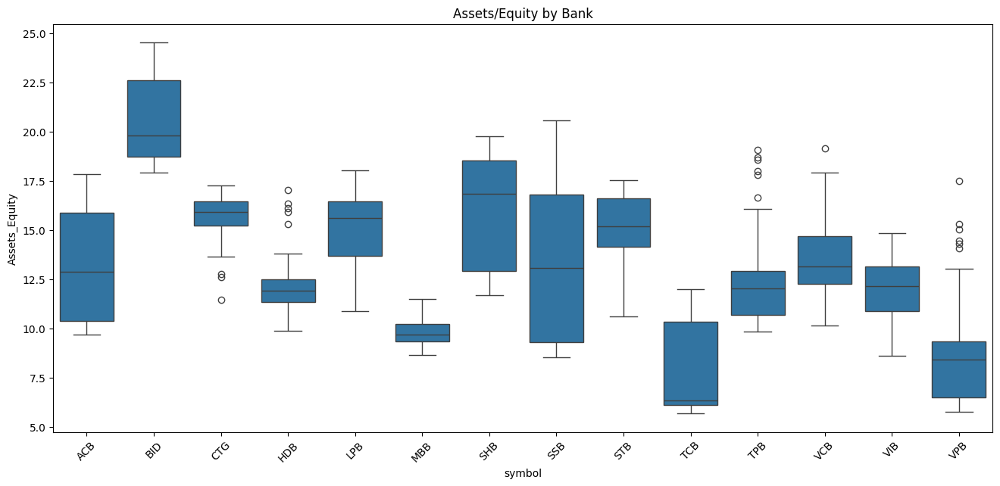

In [732]:
# Assets/Equity phân bố thế nào? Leverage cao bất thường?

plt.figure(figsize=(10, 6))
sns.histplot(bank_data["Assets_Equity"], bins=30, kde=True)
plt.title("Distribution of Assets/Equity (Leverage)")
plt.show()

plt.figure(figsize=(16, 7))
sns.boxplot(data=bank_data, x="symbol", y="Assets_Equity")
plt.title("Assets/Equity by Bank")
plt.xticks(rotation=45)
plt.show()


In [733]:
# Kiểm tra Oulier: các quý có leverage bất thường
x = bank_data["Assets_Equity"].dropna()
q1, q3 = x.quantile(0.25), x.quantile(0.75)
iqr = q3 - q1
upper = q3 + 1.5 * iqr

outlier_leverage = bank_data[bank_data["Assets_Equity"] > upper]
print("Upper bound (IQR):", upper)
print("Outlier rows:", len(outlier_leverage))
display(outlier_leverage[["symbol","quarter_date","Assets_Equity","ROE","ROA"]].head(20))


Upper bound (IQR): 24.718403085127004
Outlier rows: 0


,symbol,quarter_date,Assets_Equity,ROE,ROA


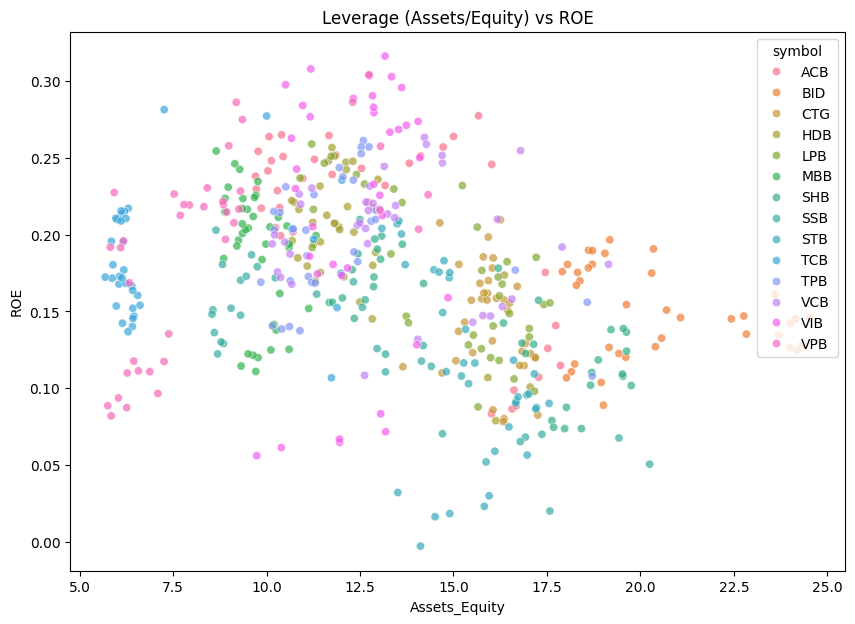

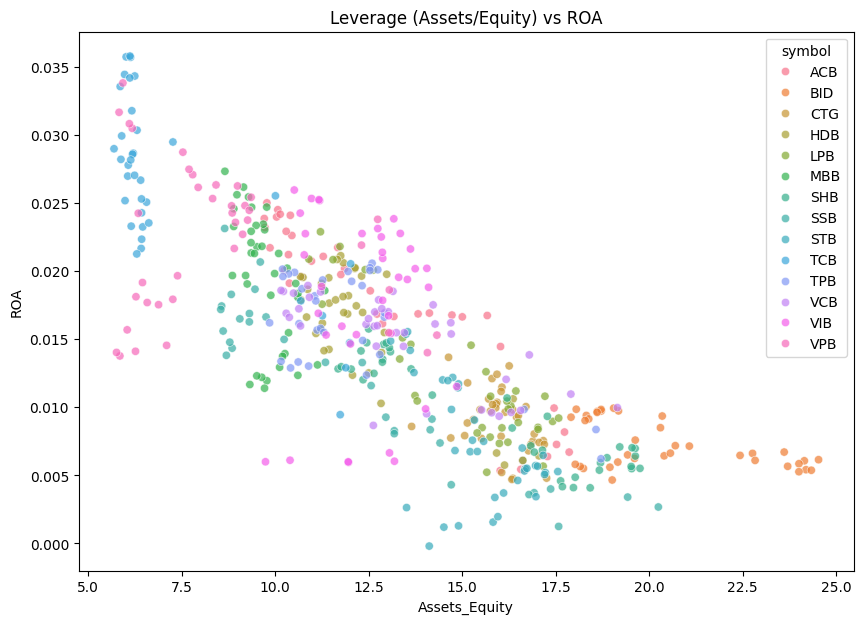

In [734]:
# Assets/Equity có ảnh hưởng ROE/ROA + volatility ROE theo leverage không?
plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_data, x="Assets_Equity", y="ROE", hue="symbol", alpha=0.7)
plt.title("Leverage (Assets/Equity) vs ROE")
plt.show()

plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_data, x="Assets_Equity", y="ROA", hue="symbol", alpha=0.7)
plt.title("Leverage (Assets/Equity) vs ROA")
plt.show()


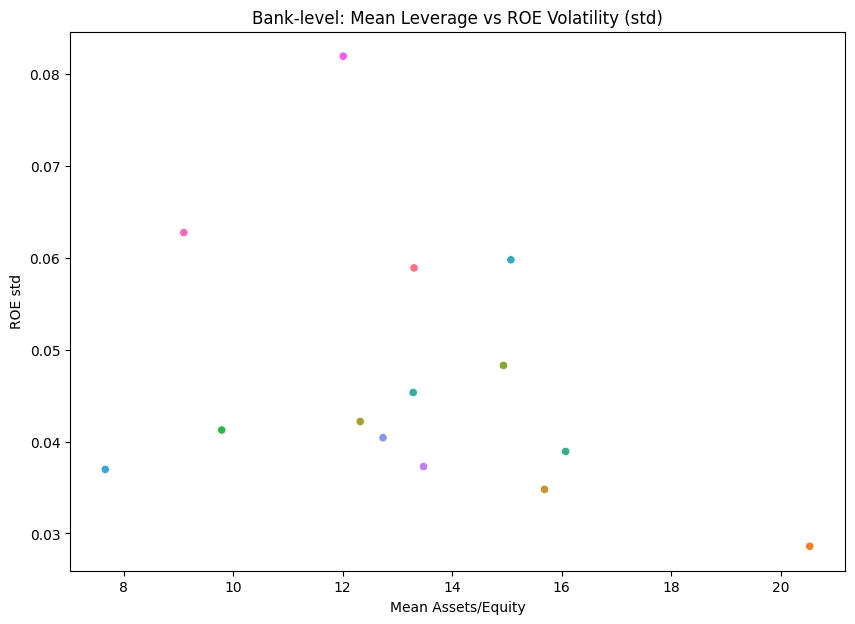

,leverage_mean,ROE_std,ROA_std,ROE_mean,ROA_mean,n
symbol,,,,,,
BID,20.532852,0.028613,0.001734,0.148614,0.007287,43
SHB,16.073777,0.038924,0.003907,0.141945,0.009427,43
CTG,15.688321,0.034798,0.002255,0.143650,0.009023,43
STB,15.074065,0.059775,0.004325,0.109317,0.007198,43
LPB,14.938543,0.048288,0.005041,0.173456,0.012100,43
VCB,13.478607,0.037278,0.003294,0.200471,0.014954,43
ACB,13.305177,0.058895,0.006429,0.209875,0.017028,43
SSB,13.289535,0.045340,0.006012,0.128831,0.011831,40
TPB,12.738395,0.040417,0.003746,0.196194,0.016368,41


In [735]:
# ROE volatility vs leverage level (bank-level)
bank_level = (
    bank_data
    .groupby("symbol")
    .agg(
        leverage_mean=("Assets_Equity","mean"),
        ROE_std=("ROE","std"),
        ROA_std=("ROA","std"),
        ROE_mean=("ROE","mean"),
        ROA_mean=("ROA","mean"),
        n=("quarter_date","count")
    )
    .dropna(subset=["leverage_mean"])
)

plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_level, x="leverage_mean", y="ROE_std", hue=bank_level.index)
plt.title("Bank-level: Mean Leverage vs ROE Volatility (std)")
plt.xlabel("Mean Assets/Equity")
plt.ylabel("ROE std")
plt.legend([], [], frameon=False)
plt.show()

display(bank_level.sort_values("leverage_mean", ascending=False))


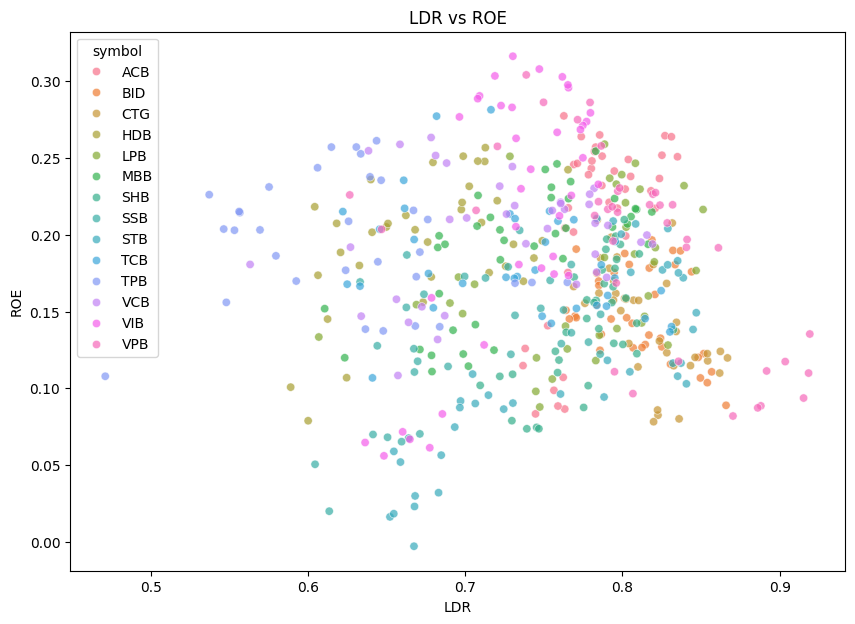

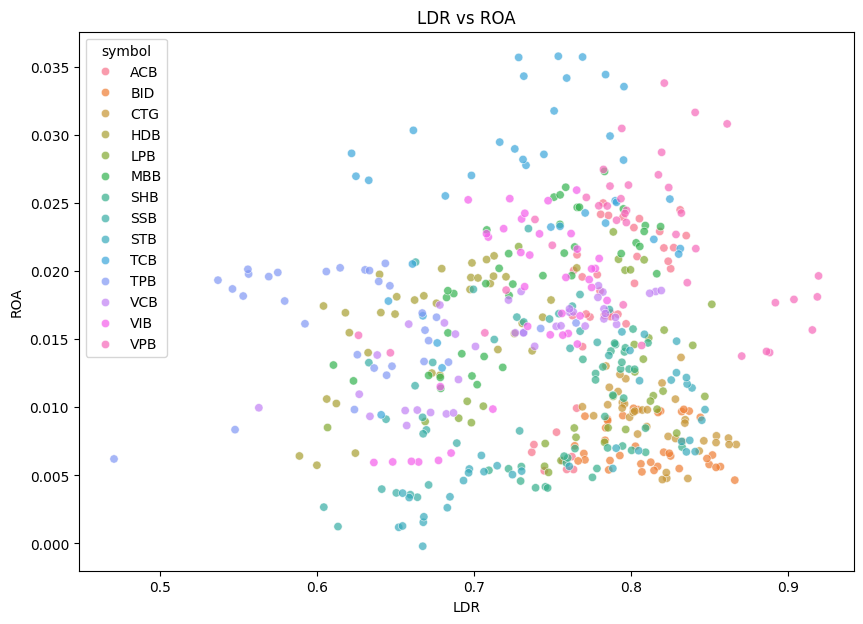

In [736]:
# LDR cao có đi kèm ROE/ROA cao không? Có ngưỡng “nguy hiểm”?
plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_data, x="LDR", y="ROE", hue="symbol", alpha=0.7)
plt.title("LDR vs ROE")
plt.show()

plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_data, x="LDR", y="ROA", hue="symbol", alpha=0.7)
plt.title("LDR vs ROA")
plt.show()


/tmp/ipython-input-2749003629.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,LDR_bin,ROE_mean,ROA_mean,n,LDR_bin_mid
0,"(0.47, 0.679]",0.156359,0.012778,102,0.5745
1,"(0.679, 0.745]",0.183328,0.016133,101,0.7120
2,"(0.745, 0.783]",0.188898,0.016270,102,0.7640
3,"(0.783, 0.808]",0.183550,0.015664,101,0.7955
4,"(0.808, 0.919]",0.157876,0.013378,102,0.8635


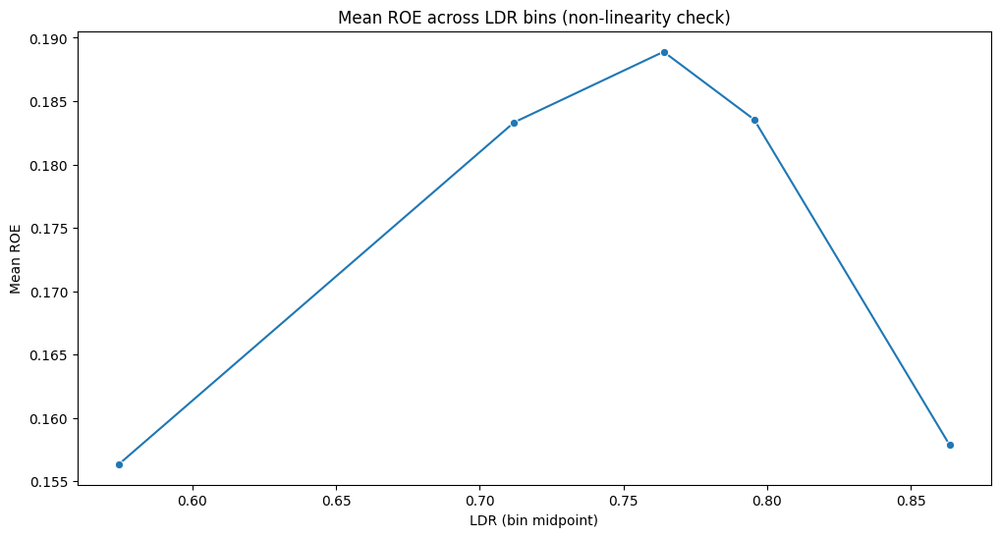

In [737]:
tmp = bank_data.dropna(subset=["LDR","ROE","ROA"]).copy()

tmp["LDR_bin"] = pd.qcut(tmp["LDR"], q=5, duplicates="drop")  # 5 bins theo quantile

bin_stats = tmp.groupby("LDR_bin").agg(
    ROE_mean=("ROE","mean"),
    ROA_mean=("ROA","mean"),
    n=("ROE","count")
).reset_index()

bin_stats["LDR_bin_mid"] = bin_stats["LDR_bin"].apply(
    lambda x: x.mid
)

display(bin_stats)

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=bin_stats,
    x="LDR_bin_mid",
    y="ROE_mean",
    marker="o"
)
plt.title("Mean ROE across LDR bins (non-linearity check)")
plt.xlabel("LDR (bin midpoint)")
plt.ylabel("Mean ROE")
plt.show()



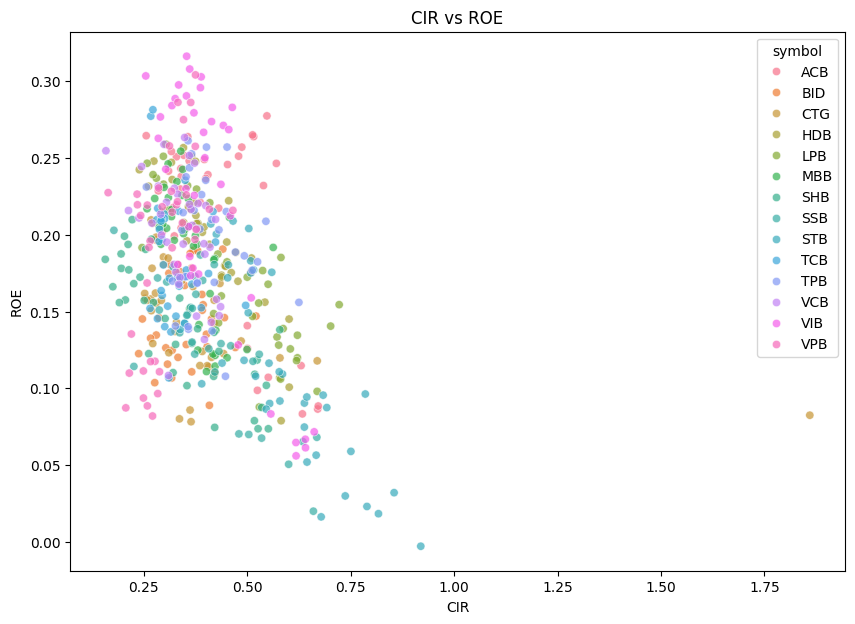

In [738]:
# Scatter CIR và ROE
plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_data, x="CIR", y="ROE", hue="symbol", alpha=0.7)
plt.title("CIR vs ROE")
plt.show()


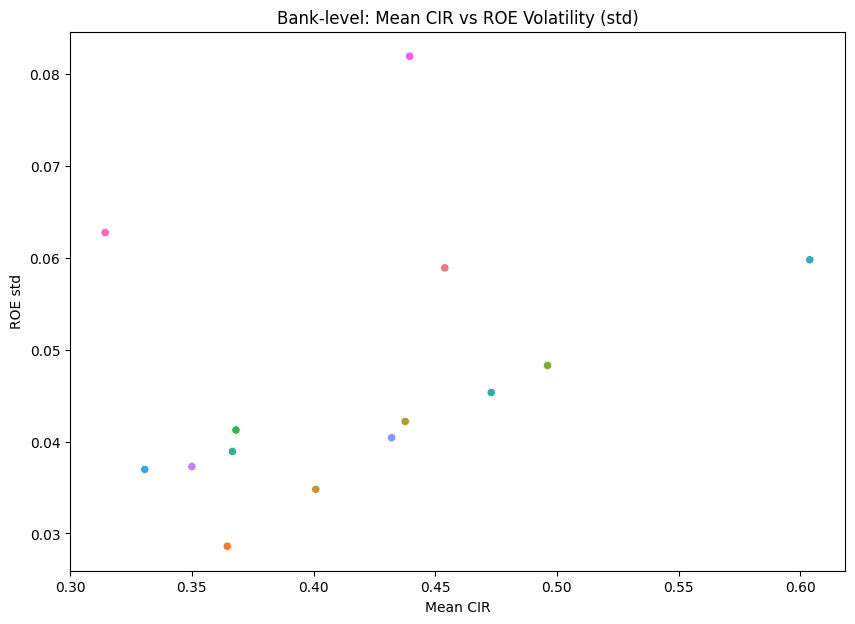

,CIR_mean,ROE_std,ROE_mean,n
symbol,,,,
VPB,0.314393,0.062733,0.191259,43
TCB,0.330632,0.036970,0.182778,43
VCB,0.349988,0.037278,0.200471,43
BID,0.364541,0.028613,0.148614,43
SHB,0.366645,0.038924,0.141945,43
MBB,0.368108,0.041258,0.188951,43
CTG,0.400908,0.034798,0.143650,43
TPB,0.432078,0.040417,0.196194,41
HDB,0.437672,0.042183,0.196543,41


In [739]:
# CIR thấp thì ROE có ổn định không
bank_eff = (
    bank_data
    .groupby("symbol")
    .agg(
        CIR_mean=("CIR","mean"),
        ROE_std=("ROE","std"),
        ROE_mean=("ROE","mean"),
        n=("quarter_date","count")
    )
)

plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_eff, x="CIR_mean", y="ROE_std", hue=bank_eff.index)
plt.title("Bank-level: Mean CIR vs ROE Volatility (std)")
plt.xlabel("Mean CIR")
plt.ylabel("ROE std")
plt.legend([], [], frameon=False)
plt.show()

display(bank_eff.sort_values("CIR_mean"))


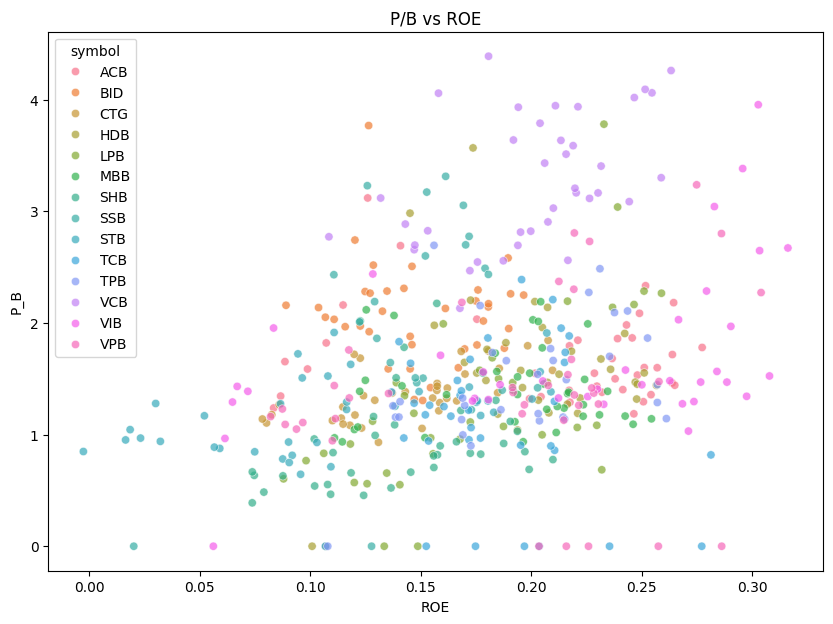

,P_B,ROE
P_B,1.000000,0.287061
ROE,0.287061,1.000000


In [740]:
# P/B có tương quan với ROE không?
plt.figure(figsize=(10, 7))
sns.scatterplot(data=bank_data, x="ROE", y="P_B", hue="symbol", alpha=0.7)
plt.title("P/B vs ROE")
plt.show()

corr_pb_roe = bank_data[["P_B","ROE"]].corr()
display(corr_pb_roe)


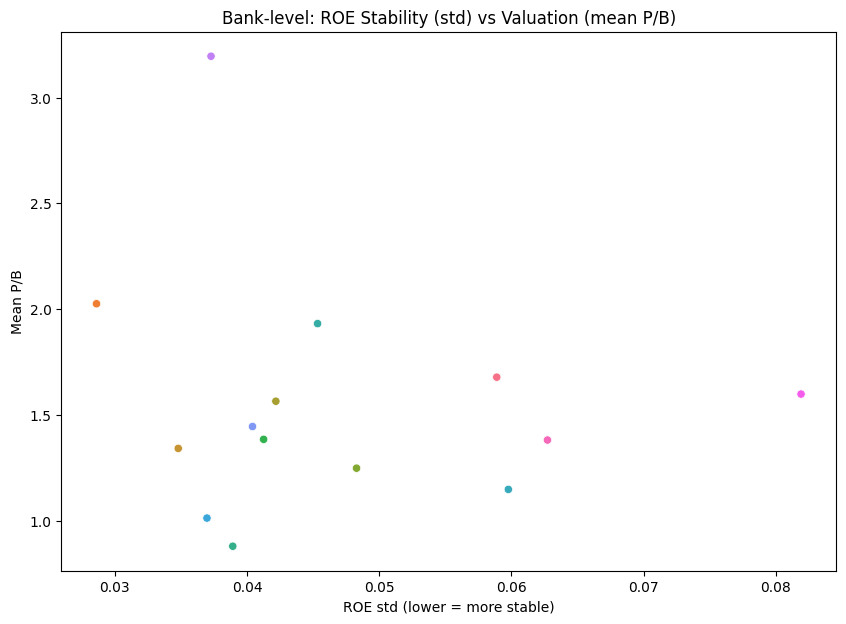

,P_B_mean,ROE_mean,ROE_std,n
symbol,,,,
VCB,3.195151,0.200471,0.037278,43
BID,2.025135,0.148614,0.028613,43
SSB,1.931212,0.128831,0.045340,40
ACB,1.677994,0.209875,0.058895,43
VIB,1.598151,0.217539,0.081920,43
HDB,1.564330,0.196543,0.042183,41
TPB,1.444633,0.196194,0.040417,41
MBB,1.384058,0.188951,0.041258,43
VPB,1.380845,0.191259,0.062733,43


In [741]:
# Bank-level: ROE std vs P/B mean
val_quality = (
    bank_data
    .groupby("symbol")
    .agg(
        P_B_mean=("P_B","mean"),
        ROE_mean=("ROE","mean"),
        ROE_std=("ROE","std"),
        n=("quarter_date","count")
    )
    .dropna()
)

plt.figure(figsize=(10, 7))
sns.scatterplot(data=val_quality, x="ROE_std", y="P_B_mean", hue=val_quality.index)
plt.title("Bank-level: ROE Stability (std) vs Valuation (mean P/B)")
plt.xlabel("ROE std (lower = more stable)")
plt.ylabel("Mean P/B")
plt.legend([], [], frameon=False)
plt.show()

display(val_quality.sort_values("P_B_mean", ascending=False))


/tmp/ipython-input-1895439797.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,stability_bucket,P_B_mean,ROE_mean,n
0,Stable,1.690464,0.163492,5
1,Medium,1.581058,0.177630,4
2,Volatile,1.410423,0.180289,5


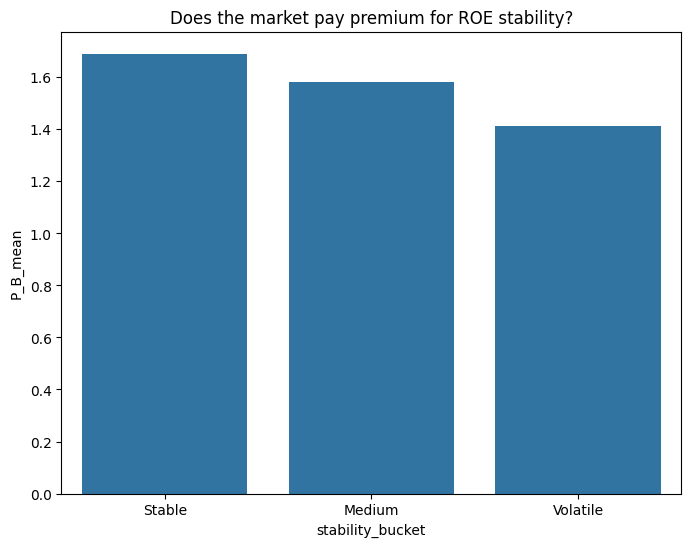

In [742]:
# Kiểm tra “premium cho stability” bằng phân nhóm
tmp = val_quality.copy()
tmp["stability_bucket"] = pd.qcut(tmp["ROE_std"], q=3, labels=["Stable", "Medium", "Volatile"])

bucket_stats = tmp.groupby("stability_bucket").agg(
    P_B_mean=("P_B_mean","mean"),
    ROE_mean=("ROE_mean","mean"),
    n=("P_B_mean","count")
).reset_index()

display(bucket_stats)

plt.figure(figsize=(8, 6))
sns.barplot(data=bucket_stats, x="stability_bucket", y="P_B_mean")
plt.title("Does the market pay premium for ROE stability?")
plt.show()


In [743]:
eda_summary = (
    bank_data
    .groupby("symbol")
    .agg(
        ROE_mean=("ROE","mean"),
        ROE_std=("ROE","std"),
        ROA_mean=("ROA","mean"),
        ROA_std=("ROA","std"),
        P_B_mean=("P_B","mean"),
        LDR_mean=("LDR","mean"),
        CIR_mean=("CIR","mean"),
        leverage_mean=("Assets_Equity","mean"),
        n=("quarter_date","count")
    )
    .sort_values("ROE_mean", ascending=False)
)

display(eda_summary)


,ROE_mean,ROE_std,ROA_mean,ROA_std,P_B_mean,LDR_mean,CIR_mean,leverage_mean,n
symbol,,,,,,,,,
VIB,0.217539,0.081920,0.017629,0.006364,1.598151,0.721993,0.439514,12.012958,43
ACB,0.209875,0.058895,0.017028,0.006429,1.677994,0.778324,0.453931,13.305177,43
VCB,0.200471,0.037278,0.014954,0.003294,3.195151,0.716855,0.349988,13.478607,43
HDB,0.196543,0.042183,0.016218,0.004180,1.564330,0.666633,0.437672,12.322190,41
TPB,0.196194,0.040417,0.016368,0.003746,1.444633,0.595549,0.432078,12.738395,41
VPB,0.191259,0.062733,0.022248,0.005543,1.380845,0.791036,0.314393,9.100094,43
MBB,0.188951,0.041258,0.019390,0.004774,1.384058,0.724630,0.368108,9.792746,43
TCB,0.182778,0.036970,0.026204,0.006463,1.011917,0.718410,0.330632,7.665689,43
LPB,0.173456,0.048288,0.012100,0.005041,1.247745,0.738011,0.496171,14.938543,43


## 1.3. Macro data

In [744]:
macro = pd.read_excel(f"{ROOT_DIR}/macro.xlsx")

print(macro)
print(macro.info())
print("Date range:", macro.Year.min(), "→", macro.Year.max())

    Year  Quarter Inflation    GDP CreditGrowth
0   2015        1     0,93%  6,03%       16,57%
1   2015        2     2,01%  6,28%       18,72%
2   2015        3     1,87%  6,50%       11,36%
3   2015        4     1,69%  6,68%       17,26%
4   2016        1     1,64%  5,46%       17,71%
5   2016        2     1,88%  5,52%       17,64%
6   2016        3     1,85%  5,93%       16,76%
7   2016        4     1,87%  6,21%       18,25%
8   2017        1     1,60%  5,10%       19,78%
9   2017        2     1,29%  5,73%       19,12%
10  2017        3     1,32%  6,41%       18,85%
11  2017        4     1,29%  6,81%       18,24%
12  2018        1     1,38%  7,38%       14,08%
13  2018        2     1,37%  7,08%       13,76%
14  2018        3     1,61%  6,98%       13,08%
15  2018        4     1,70%  7,08%       10,74%
16  2019        1     1,84%  6,79%       13,45%
17  2019        2     1,96%  6,76%       13,40%
18  2019        3     1,96%  6,98%       12,93%
19  2019        4     2,78%  7,02%      

In [745]:
# Làm sạch và chuyển sang numeric
macro_df = macro.copy()

# Chuẩn hóa thành numeric
percent_cols = ["Inflation", "GDP", "CreditGrowth"]

for col in percent_cols:
    macro_df[col] = (
        macro_df[col]
        .astype(str)
        .str.replace("%", "", regex=False)
        .str.replace(",", ".", regex=False)
        .astype(float)
        / 100
    )

# Đổi tên cho thống nhất ký hiệu
macro_df = macro_df.rename(columns={
    "Inflation": "INF",
    "CreditGrowth": "DC"
})

# Tạo quarter date
macro_df["quarter_date"] = (
    pd.PeriodIndex.from_fields(
        year=macro_df["Year"],
        quarter=macro_df["Quarter"],
        freq="Q"
    )
    .to_timestamp()
)

# sort lại theo thời gian
macro_df = macro_df.sort_values("quarter_date").reset_index(drop=True)

print(macro_df.info())
macro_df[["INF", "GDP", "DC"]].describe()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43 entries, 0 to 42
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Year          43 non-null     int64         
 1   Quarter       43 non-null     int64         
 2   INF           43 non-null     float64       
 3   GDP           43 non-null     float64       
 4   DC            43 non-null     float64       
 5   quarter_date  43 non-null     datetime64[ns]
dtypes: datetime64[ns](1), float64(3), int64(2)
memory usage: 2.1 KB
None


,INF,GDP,DC
count,43.00000,43.000000,43.000000
mean,0.02184,0.057500,0.147351
std,0.01079,0.017743,0.029301
min,0.00670,0.014200,0.092700
25%,0.01375,0.050400,0.130050
50%,0.01880,0.062800,0.140800
75%,0.02815,0.069550,0.171000
max,0.04990,0.088300,0.197800


* * *
#### Câu hỏi EDA

1. Khi GDP tăng → ngân hàng hưởng lợi không?
    
2. Credit Growth (DC) tác động **độ trễ bao lâu**?
    
3. Lạm phát có làm giảm ROE / P/B không?
    

#### EDA nên làm

* Timeline GDP – DC – INF
    
* Correlation macro ↔ ROE, P/B
    
* Lag analysis (quarter t-1, t-2)
    

#### Insight thường gặp

* DC tăng → ROE tăng **sau 1–2 quý**
    
* GDP phản ánh môi trường chung, **không quyết định giá ngắn hạn**
    
* INF cao → margin bị ép
    

Macro **không dự báo giá trực tiếp**, nhưng:

> Là **control variable** rất quan trọng


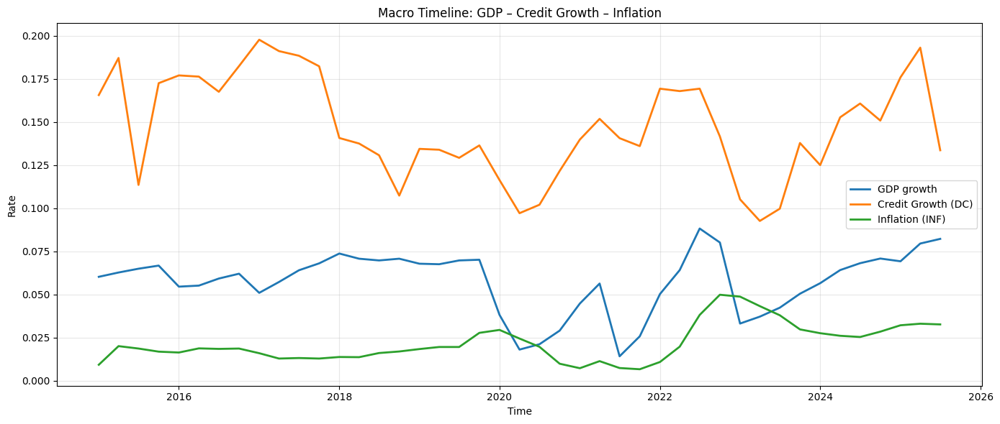

In [746]:
# Time line
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))

plt.plot(macro_df["quarter_date"], macro_df["GDP"], label="GDP growth", linewidth=2)
plt.plot(macro_df["quarter_date"], macro_df["DC"], label="Credit Growth (DC)", linewidth=2)
plt.plot(macro_df["quarter_date"], macro_df["INF"], label="Inflation (INF)", linewidth=2)

plt.title("Macro Timeline: GDP – Credit Growth – Inflation")
plt.xlabel("Time")
plt.ylabel("Rate")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [747]:
# # Gộp macro vào bank data
# bank_macro = bank_data.merge(
#     macro[["quarter_date", "GDP", "DC", "INF"]],
#     on="quarter_date",
#     how="left"
# )

# # Lấy các cột cần phân tích
# corr_cols = ["ROE", "P_B", "GDP", "DC", "INF"]

# corr_matrix = bank_macro[corr_cols].corr()

# plt.figure(figsize=(8, 6))
# sns.heatmap(
#     corr_matrix,
#     annot=True,
#     cmap="coolwarm",
#     center=0,
#     fmt=".2f"
# )
# plt.title("Correlation: Macro variables vs Bank performance")
# plt.show()


In [748]:
# # Tạo lag macro
# for lag in [1, 2]:
#     bank_macro[f"CreditGrowth_lag{lag}"] = (
#         bank_macro
#         .groupby("symbol")["DC"]
#         .shift(lag)
#     )

# # Scatter plot lag vs ROE
# fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# sns.scatterplot(
#     data=bank_macro,
#     x="CreditGrowth_lag1",
#     y="ROE",
#     alpha=0.6,
#     ax=axes[0]
# )
# axes[0].set_title("Credit Growth (t-1) vs ROE")

# sns.scatterplot(
#     data=bank_macro,
#     x="CreditGrowth_lag2",
#     y="ROE",
#     alpha=0.6,
#     ax=axes[1]
# )
# axes[1].set_title("Credit Growth (t-2) vs ROE")

# for ax in axes:
#     ax.grid(alpha=0.3)

# plt.suptitle("Lag effect of Credit Growth on ROE")
# plt.tight_layout()
# plt.show()


In [749]:
fx = pd.read_csv(f"{ROOT_DIR}/usd_vnd_full_2015_raw.csv")

print(fx.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2853 entries, 0 to 2852
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2853 non-null   object 
 1   Open       2853 non-null   float64
 2   High       2853 non-null   float64
 3   Low        2853 non-null   float64
 4   Close      2853 non-null   float64
 5   Adj Close  2853 non-null   float64
 6   Volume     2853 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 156.2+ KB
None


In [750]:
fx_df = fx.copy()

# Xóa cột khối lượng và Adj close
fx_df = fx_df.drop(columns=["Volume", "Adj Close"])

# Đổi tên để thống nhất
fx_df = fx_df.rename(columns={
    "Date": "date",
    "Close": "close",
    "Open": "open",
    "High": "high",
    "Low": "low"
})

# Sort theo thời gian
fx_df = fx_df.sort_values("date").reset_index(drop=True)

print(fx_df.info())



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2853 entries, 0 to 2852
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2853 non-null   object 
 1   open    2853 non-null   float64
 2   high    2853 non-null   float64
 3   low     2853 non-null   float64
 4   close   2853 non-null   float64
dtypes: float64(4), object(1)
memory usage: 111.6+ KB
None


In [751]:
def plot_fx_open_timeline(
    df,
    start=None,
    end=None,
    title="USD/VND – Open Price Timeline"
):
    data = df.copy()

    if start:
        data = data[data["date"] >= start]
    if end:
        data = data[data["date"] <= end]

    fig = go.Figure(
        data=[
            go.Scatter(
                x=data["date"],
                y=data["open"],
                mode="lines",
                name="Open Price"
            )
        ]
    )

    fig.update_layout(
        title=title,
        xaxis_title="Date",
        yaxis_title="USD/VND (Open)",
        height=500,
        width=1000
    )

    fig.show()


In [752]:
plot_fx_open_timeline(fx_df)


In [753]:
# ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

fx = fx.copy()
fx["Date"] = pd.to_datetime(fx["Date"])
fx = fx.sort_values("Date")

# Log price & return (EDA only)
fx["log_price"] = np.log(fx["Close"])
fx["fx_ret_1d"] = fx["log_price"].diff()
fx["abs_ret"] = fx["fx_ret_1d"].abs()


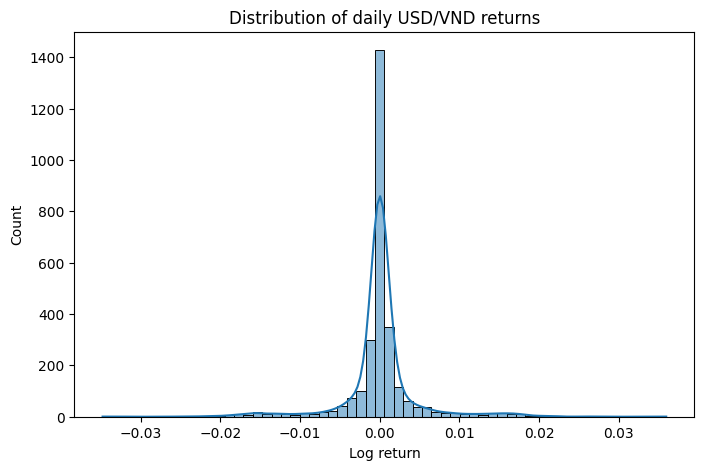

In [754]:
plt.figure(figsize=(8, 5))
sns.histplot(
    fx["fx_ret_1d"].dropna(),
    bins=60,
    kde=True
)
plt.title("Distribution of daily USD/VND returns")
plt.xlabel("Log return")
plt.show()


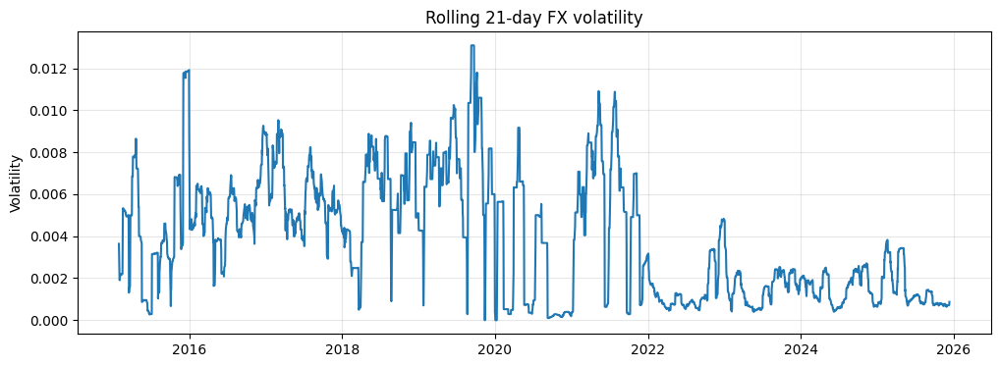

In [755]:
fx["fx_vol_21d"] = fx["fx_ret_1d"].rolling(21).std()

plt.figure(figsize=(12, 4))
plt.plot(fx["Date"], fx["fx_vol_21d"])
plt.title("Rolling 21-day FX volatility")
plt.ylabel("Volatility")
plt.grid(alpha=0.3)
plt.show()


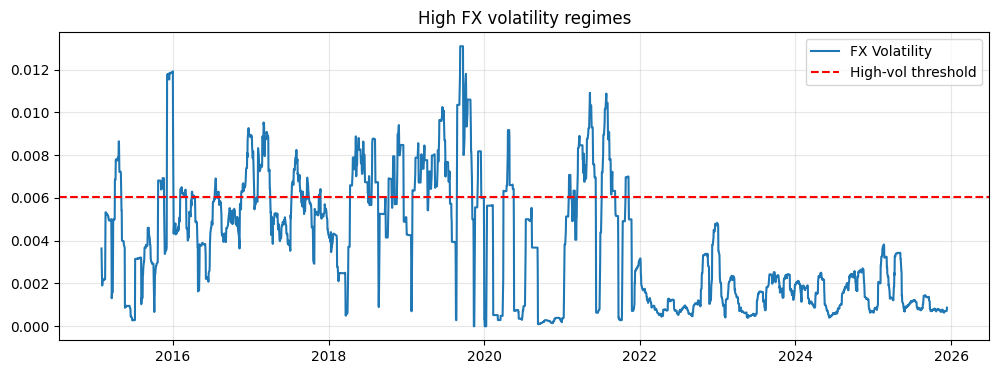

In [756]:
# Phân vị volatility để nhìn regime
q75 = fx["fx_vol_21d"].quantile(0.75)

plt.figure(figsize=(12, 4))
plt.plot(fx["Date"], fx["fx_vol_21d"], label="FX Volatility")
plt.axhline(q75, color="red", linestyle="--", label="High-vol threshold")
plt.legend()
plt.title("High FX volatility regimes")
plt.grid(alpha=0.3)
plt.show()


## 1.4. News


In [757]:
news = pd.read_csv(f"{ROOT_DIR}/VN30_Daily_Features.csv")

print(news.info())



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38668 entries, 0 to 38667
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              38668 non-null  object 
 1   symbol            38668 non-null  object 
 2   daily_buzz        38668 non-null  float64
 3   daily_sentiment   38668 non-null  float64
 4   buzz_7d           38668 non-null  float64
 5   polarity_7d       38668 non-null  float64
 6   sentiment_7d_avg  38668 non-null  float64
 7   sentiment_decay   38668 non-null  float64
dtypes: float64(6), object(2)
memory usage: 2.4+ MB
None


#### Câu hỏi EDA

1. Sentiment có dẫn dắt giá không?
    
2. Buzz cao nhưng sentiment âm → chuyện gì xảy ra?
    

#### EDA phù hợp

* Sentiment vs return
    
* Lag sentiment (t-1, t-3, t-7)
    
* Event-based analysis
    

#### Insight thực tế

* Sentiment **không mạnh**, nhưng:
    
    * làm tăng volatility
        
    * làm phản ứng giá nhanh hơn
        

* * *

In [758]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Chuẩn hóa thời gian
news["date"] = pd.to_datetime(news["date"])
ohlcv["date"] = pd.to_datetime(ohlcv["time"]).dt.date
news["date"] = news["date"].dt.date

# Tính return cho EDA
ohlcv = ohlcv.sort_values(["symbol", "date"])
ohlcv["return_1d"] = (
    ohlcv
    .groupby("symbol")["close"]
    .pct_change()
)

# Merge
sent_df = ohlcv.merge(
    news,
    on=["symbol", "date"],
    how="inner"
)

# Volatility proxy
sent_df["abs_return"] = sent_df["return_1d"].abs()


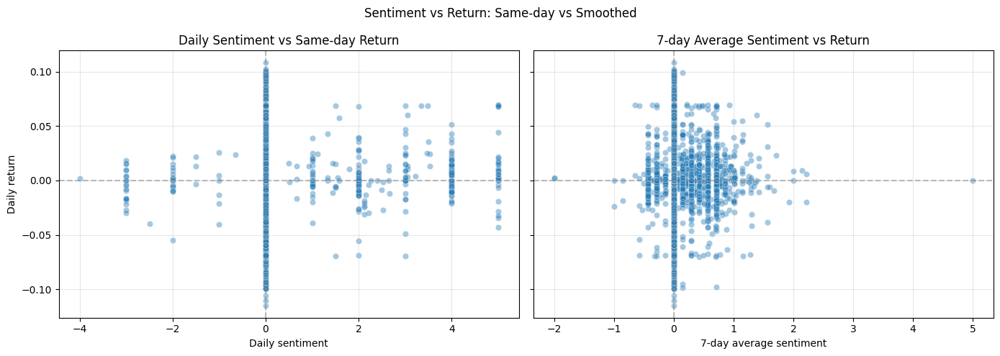

In [759]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# --- Plot 1: Daily sentiment
sns.scatterplot(
    data=sent_df,
    x="daily_sentiment",
    y="return_1d",
    alpha=0.4,
    ax=axes[0]
)
axes[0].axhline(0, color="gray", linestyle="--", alpha=0.5)
axes[0].axvline(0, color="gray", linestyle="--", alpha=0.5)
axes[0].set_title("Daily Sentiment vs Same-day Return")
axes[0].set_xlabel("Daily sentiment")
axes[0].set_ylabel("Daily return")
axes[0].grid(alpha=0.3)

# --- Plot 2: 7-day average sentiment
sns.scatterplot(
    data=sent_df,
    x="sentiment_7d_avg",
    y="return_1d",
    alpha=0.4,
    ax=axes[1]
)
axes[1].axhline(0, color="gray", linestyle="--", alpha=0.5)
axes[1].axvline(0, color="gray", linestyle="--", alpha=0.5)
axes[1].set_title("7-day Average Sentiment vs Return")
axes[1].set_xlabel("7-day average sentiment")
axes[1].grid(alpha=0.3)

plt.suptitle("Sentiment vs Return: Same-day vs Smoothed")
plt.tight_layout()
plt.show()


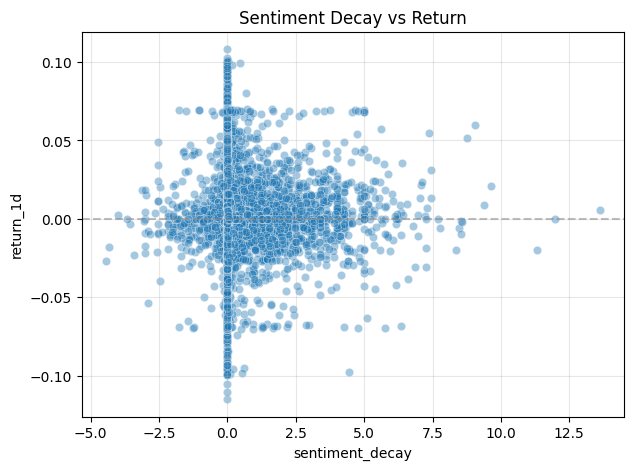

In [760]:
plt.figure(figsize=(7, 5))
sns.scatterplot(
    data=sent_df,
    x="sentiment_decay",
    y="return_1d",
    alpha=0.4
)
plt.axhline(0, color="gray", linestyle="--", alpha=0.5)
plt.title("Sentiment Decay vs Return")
plt.grid(alpha=0.3)
plt.show()


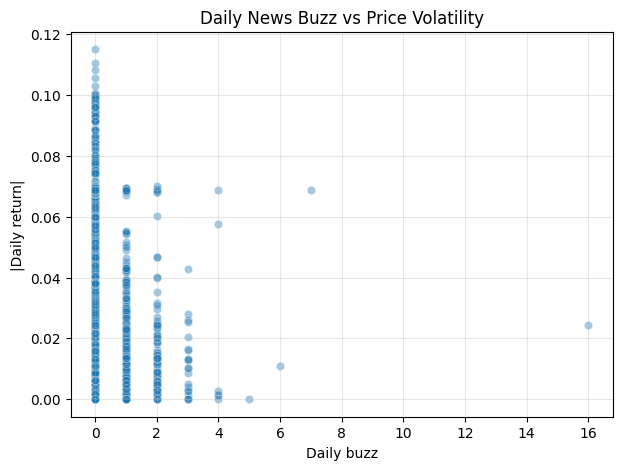

In [761]:
plt.figure(figsize=(7, 5))
sns.scatterplot(
    data=sent_df,
    x="daily_buzz",
    y="abs_return",
    alpha=0.4
)
plt.title("Daily News Buzz vs Price Volatility")
plt.xlabel("Daily buzz")
plt.ylabel("|Daily return|")
plt.grid(alpha=0.3)
plt.show()


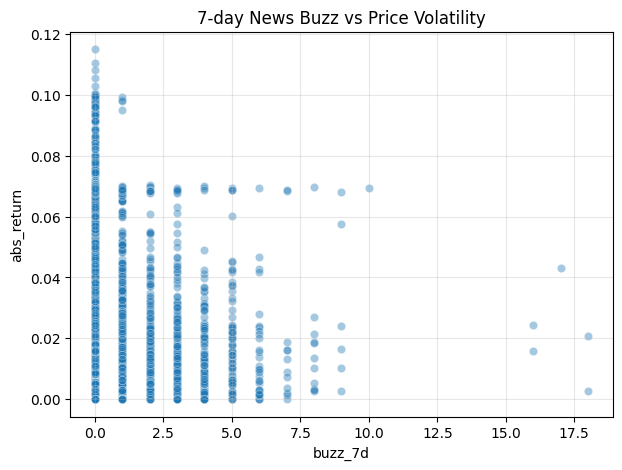

In [762]:
plt.figure(figsize=(7, 5))
sns.scatterplot(
    data=sent_df,
    x="buzz_7d",
    y="abs_return",
    alpha=0.4
)
plt.title("7-day News Buzz vs Price Volatility")
plt.grid(alpha=0.3)
plt.show()


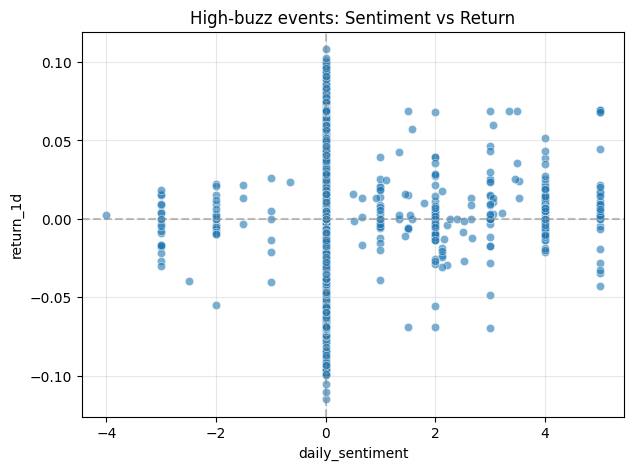

In [763]:
# Ngưỡng buzz cao
buzz_thr = sent_df["buzz_7d"].quantile(0.9)

event_df = sent_df[sent_df["buzz_7d"] >= buzz_thr]

plt.figure(figsize=(7, 5))
sns.scatterplot(
    data=event_df,
    x="daily_sentiment",
    y="return_1d",
    alpha=0.6
)
plt.axhline(0, color="gray", linestyle="--", alpha=0.5)
plt.axvline(0, color="gray", linestyle="--", alpha=0.5)
plt.title("High-buzz events: Sentiment vs Return")
plt.grid(alpha=0.3)
plt.show()


***
# 2. FEATURE ENGINEERING

Làm rõ bài toán dự đoán 4 thông tin dưới đây:

| Loại      | Target                |
| --------- | --------------------- |
| Return    | `log_return_21d`      |
| Direction | Up / Down             |
| Risk      | Volatility 21d        |
| Regime    | Bull / Sideway / Bear |


## 1.1. Nhóm A – Market Features (từ OHLCV)

### Core features

| Feature          | Nhóm       | Ý nghĩa                |
| ---------------- | ---------- | ---------------------- |
| `ret_1d`         | Momentum   | Phản ứng ngắn hạn      |
| `ret_5d`         | Momentum   | Xu hướng tuần          |
| `ret_21d`        | Momentum   | Xu hướng tháng         |
| `vol_5d`         | Risk       | Rủi ro ngắn hạn        |
| `vol_21d`        | Risk       | Rủi ro trung hạn       |
| `high_low_range` | Volatility | Biên độ intraday       |
| `close_vs_ma21`  | Trend      | Vị trí so với MA ngắn  |
| `close_vs_ma63`  | Trend      | Vị trí so với MA trung |

Nguyên tắc thiết kế:
* Tính theo từng symbol

* Chỉ dùng dữ liệu quá khứ

* Chuẩn hóa theo tỷ lệ hoặc log

* Các feature phải được làm rõ và giải thích được


Ý nghĩa:

* Momentum
    
* Volatility clustering
    
* Short vs medium trend

In [764]:
import pandas as pd
import numpy as np

price = ohlcv.copy()
price["time"] = pd.to_datetime(price["time"])
price = price.sort_values(["symbol", "time"])


In [765]:
def build_market_features(df):
    """
    Build Market Features (Group A) from OHLCV data.

    Output:
        DataFrame with original keys + market features
    """

    df = df.copy()

    # --- Returns (Momentum)
    df["ret_1d"] = (
        df.groupby("symbol")["close"]
        .pct_change(1)
    )

    df["ret_5d"] = (
        df.groupby("symbol")["close"]
        .pct_change(5)
    )

    df["ret_21d"] = (
        df.groupby("symbol")["close"]
        .pct_change(21)
    )

    # --- Volatility (Risk)
    df["vol_5d"] = (
        df.groupby("symbol")["ret_1d"]
        .rolling(5)
        .std()
        .reset_index(level=0, drop=True)
    )

    df["vol_21d"] = (
        df.groupby("symbol")["ret_1d"]
        .rolling(21)
        .std()
        .reset_index(level=0, drop=True)
    )

    # --- Intraday range (Volatility proxy)
    df["high_low_range"] = (
        (df["high"] - df["low"]) / df["close"]
    )

    # --- Moving averages
    ma21 = (
        df.groupby("symbol")["close"]
        .rolling(21)
        .mean()
        .reset_index(level=0, drop=True)
    )

    ma63 = (
        df.groupby("symbol")["close"]
        .rolling(63)
        .mean()
        .reset_index(level=0, drop=True)
    )

    df["close_vs_ma21"] = (df["close"] - ma21) / ma21
    df["close_vs_ma63"] = (df["close"] - ma63) / ma63

    return df


In [766]:
price_feat = build_market_features(price)


In [767]:
price_feat[
    ["symbol", "time",
     "ret_1d", "ret_5d", "ret_21d",
     "vol_5d", "vol_21d",
     "high_low_range",
     "close_vs_ma21", "close_vs_ma63"]
].head(30)


,symbol,time,ret_1d,ret_5d,ret_21d,vol_5d,vol_21d,high_low_range,close_vs_ma21,close_vs_ma63
0,ACB,2015-01-05,NaN,NaN,NaN,NaN,NaN,0.012821,NaN,NaN
1,ACB,2015-01-06,0.012821,NaN,NaN,NaN,NaN,0.025316,NaN,NaN
2,ACB,2015-01-07,0.012658,NaN,NaN,NaN,NaN,0.033333,NaN,NaN
3,ACB,2015-01-08,0.008333,NaN,NaN,NaN,NaN,0.016529,NaN,NaN
4,ACB,2015-01-09,0.004132,NaN,NaN,NaN,NaN,0.045267,NaN,NaN
5,ACB,2015-01-12,0.012346,0.051282,NaN,0.003799,NaN,0.032520,NaN,NaN
6,ACB,2015-01-13,0.024390,0.063291,NaN,0.007562,NaN,0.035714,NaN,NaN
7,ACB,2015-01-14,-0.015873,0.033333,NaN,0.014694,NaN,0.024194,NaN,NaN
8,ACB,2015-01-15,-0.020161,0.004132,NaN,0.018829,NaN,0.020576,NaN,NaN
9,ACB,2015-01-16,0.000000,0.000000,NaN,0.018746,NaN,0.024691,NaN,NaN


* * *

## 1.2. Nhóm B – Technical Structure

Không dùng indicator quá phức tạp. Tránh quá khó, overfit

```text
RSI_14
ATR_14
Bollinger_width
```

→ giúp model hiểu **trạng thái thị trường**, không phải để trading rule.

In [768]:
def compute_rsi(close, window=14):
    delta = close.diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)

    avg_gain = gain.rolling(window, min_periods=window).mean()
    avg_loss = loss.rolling(window, min_periods=window).mean()

    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi


In [769]:
ohlcv["RSI_14"] = (
    ohlcv
    .groupby("symbol")["close"]
    .transform(lambda x: compute_rsi(x, 14))
)


In [770]:
def compute_atr(high, low, close, window=14):
    prev_close = close.shift(1)

    tr1 = high - low
    tr2 = (high - prev_close).abs()
    tr3 = (low - prev_close).abs()

    true_range = pd.concat([tr1, tr2, tr3], axis=1).max(axis=1)
    atr = true_range.rolling(window, min_periods=window).mean()
    return atr


In [771]:
ohlcv["ATR_14"] = (
    ohlcv
    .groupby("symbol", group_keys=False)
    .apply(lambda df: compute_atr(df["high"], df["low"], df["close"], 14))
)


In [772]:
bank_range = (
    bank_data
    .groupby("symbol")["quarter_date"]
    .agg(["min", "max", "count"])
    .sort_values("min")
)

ohlcv_range = (
    ohlcv
    .groupby("symbol")["time"]
    .agg(["min", "max", "count"])
    .sort_values("min")
)

coverage = (
    bank_range
    .join(ohlcv_range, lsuffix="_bank", rsuffix="_ohlcv")
)

coverage



,min_bank,max_bank,count_bank,min_ohlcv,max_ohlcv,count_ohlcv
symbol,,,,,,
ACB,2015-01-01,2025-07-01,43,2015-01-05,2025-12-10,2728
BID,2015-01-01,2025-07-01,43,2015-01-05,2025-12-10,2733
CTG,2015-01-01,2025-07-01,43,2015-01-05,2025-12-10,2733
HDB,2015-01-01,2025-07-01,41,2018-01-05,2025-12-10,1981
LPB,2015-01-01,2025-07-01,43,2017-10-05,2025-12-10,2036
MBB,2015-01-01,2025-07-01,43,2015-01-05,2025-12-10,2733
SHB,2015-01-01,2025-07-01,43,2015-01-05,2025-12-10,2730
STB,2015-01-01,2025-07-01,43,2015-01-05,2025-12-10,2733
TCB,2015-01-01,2025-07-01,43,2018-06-04,2025-12-10,1883


In [773]:
# Scale theo giá để ổn định cross-stock. Đây là feature dùng cho model
ohlcv["ATR_14_pct"] = ohlcv["ATR_14"] / ohlcv["close"]


In [774]:
def compute_bollinger_width(close, window=20, n_std=2):
    ma = close.rolling(window, min_periods=window).mean()
    std = close.rolling(window, min_periods=window).std()

    upper = ma + n_std * std
    lower = ma - n_std * std

    width = (upper - lower) / ma
    return width


In [775]:
ohlcv["BB_width"] = (
    ohlcv
    .groupby("symbol")["close"]
    .transform(lambda x: compute_bollinger_width(x, 20, 2))
)


In [776]:
# Kiểm tra sau khi feature engineering
feature_cols = ["RSI_14", "ATR_14_pct", "BB_width"]

ohlcv[feature_cols].describe()


,RSI_14,ATR_14_pct,BB_width
count,32220.000000,32234.000000,32150.000000
mean,52.661627,0.028390,0.134753
std,17.692123,0.012311,0.087038
min,0.000000,0.004608,0.009147
25%,40.000000,0.019440,0.074241
50%,52.522255,0.025565,0.112031
75%,65.454545,0.034356,0.169798
max,100.000000,0.118945,0.974137


* * *

## 1.3. Nhóm C – Sentiment Features

> “Kỳ vọng thị trường”

```text
daily_sentiment
sentiment_7d_avg
buzz_7d
sentiment_decay
```

Quan trọng:

* Không dùng raw sentiment → dùng **rolling / lag**
    

```text
sentiment_t-1
sentiment_t-3
sentiment_t-7
```

In [777]:
# Lag sentiment
sentiment_lags = [1, 3, 7]

for lag in sentiment_lags:
    news[f"sentiment_lag_{lag}"] = (
        news
        .groupby("symbol")["daily_sentiment"]
        .shift(lag)
    )


In [778]:
# Lag rolling sentiment
news["sentiment_7d_avg_lag1"] = (
    news
    .groupby("symbol")["sentiment_7d_avg"]
    .shift(1)
)


In [779]:
# Buzz & decay (lag nhẹ, tránh noise)
news["buzz_7d_lag1"] = (
    news
    .groupby("symbol")["buzz_7d"]
    .shift(1)
)

news["sentiment_decay_lag1"] = (
    news
    .groupby("symbol")["sentiment_decay"]
    .shift(1)
)


In [780]:
# Kiểm tra feature
sentiment_features = [
    "sentiment_lag_1",
    "sentiment_lag_3",
    "sentiment_lag_7",
    "sentiment_7d_avg_lag1",
    "buzz_7d_lag1",
    "sentiment_decay_lag1"
]

news[sentiment_features].isna().mean().sort_values()


,0
sentiment_lag_1,0.000336
sentiment_7d_avg_lag1,0.000336
sentiment_decay_lag1,0.000336
buzz_7d_lag1,0.000336
sentiment_lag_3,0.001009
sentiment_lag_7,0.002353


In [781]:
news[sentiment_features].describe()


,sentiment_lag_1,sentiment_lag_3,sentiment_lag_7,sentiment_7d_avg_lag1,buzz_7d_lag1,sentiment_decay_lag1
count,38655.000000,38629.000000,38577.000000,38655.000000,38655.000000,3.865500e+04
mean,0.017804,0.017712,0.017555,0.018225,0.129712,1.164760e-01
std,0.288012,0.287395,0.287013,0.132960,0.646974,6.449123e-01
min,-4.000000,-4.000000,-4.000000,-2.000000,0.000000,-4.422014e+00
25%,0.000000,0.000000,0.000000,0.000000,0.000000,3.265330e-148
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.386023e-41
75%,0.000000,0.000000,0.000000,0.000000,0.000000,2.066070e-09
max,5.000000,5.000000,5.000000,5.000000,18.000000,1.361117e+01


In [782]:
sentiment_features_df = news[
    ["symbol", "date"] + sentiment_features
].copy()


* * *

## 1.4. Nhóm D – Macro Features (Quarterly → forward fill)

```text
GDP
INF
DC
```

Dùng **lag**:

```text
GDP_t-1Q
DC_t-1Q
INF_t-1Q
```

→ tránh look-ahead bias

FX Context

```text
fx_ret_5d
fx_vol_21d
```

→ chỉ dùng làm **context**, weight nhỏ

In [787]:
macro_df = macro_df.copy()

# Tạo lag quý 1
macro_df["GDP_t_1Q"] = macro_df["GDP"].shift(1)
macro_df["INF_t_1Q"] = macro_df["INF"].shift(1)
macro_df["DC_t_1Q"]  = macro_df["DC"].shift(1)

# Giữ các cột cần dùng
macro_features = macro_df[
    [
        "quarter_date",
        "GDP", "INF", "DC",
        "GDP_t_1Q", "INF_t_1Q", "DC_t_1Q"
    ]
]

# Kiểm tra
macro_features.isna().mean()



,0
quarter_date,0.000000
GDP,0.000000
INF,0.000000
DC,0.000000
GDP_t_1Q,0.023256
INF_t_1Q,0.023256
DC_t_1Q,0.023256


In [784]:
# FX return 5 ngày
fx_df["fx_ret_5d"] = fx_df["close"].pct_change(5)

# FX volatility 21 ngày
fx_df["fx_vol_21d"] = (
    fx_df["close"]
    .pct_change()
    .rolling(21)
    .std()
)

# Các feature cần thiết
fx_features_daily = fx_df[
    ["date", "fx_ret_5d", "fx_vol_21d"]
]


* * *

## 1.5. Nhóm E – Bank Fundamentals (Quarterly)

Không dùng tất cả 100 cột. Chỉ dùng **summary ratios**.

```text
ROE
ROA
P/B
LDR
CIR
Assets/Equity
```

→ normalize theo bank (z-score per CP)

In [785]:
bank_features = bank_data.copy()

fundamental_cols = [
    "ROE",
    "ROA",
    "P_B",
    "LDR",
    "CIR",
    "Assets_Equity"
]

# Normalize theo từng ngân hàng
for col in fundamental_cols:
    bank_features[f"{col}_z"] = (
        bank_features
        .groupby("symbol")[col]
        .transform(lambda x: (x - x.mean()) / x.std())
    )

# Kiểm tra lại
bank_features[
    [f"{c}_z" for c in fundamental_cols]
].describe()


,ROE_z,ROA_z,P_B_z,LDR_z,CIR_z,Assets_Equity_z
count,5.080000e+02,5.080000e+02,5.540000e+02,5.950000e+02,5.950000e+02,5.950000e+02
mean,1.416190e-16,-2.167995e-16,6.092199e-17,1.194189e-16,-1.224044e-16,1.358391e-16
std,9.870962e-01,9.870962e-01,9.881760e-01,9.889967e-01,9.889967e-01,9.889967e-01
min,-2.788783e+00,-2.711031e+00,-2.519636e+00,-2.680048e+00,-2.903457e+00,-3.303053e+00
25%,-6.770736e-01,-7.221337e-01,-6.244128e-01,-7.194356e-01,-6.899270e-01,-7.338383e-01
50%,1.241327e-01,9.416635e-02,-1.068739e-01,9.806277e-02,-1.488140e-01,-1.055175e-01
75%,7.162404e-01,7.960880e-01,5.035833e-01,7.653512e-01,5.935436e-01,7.627141e-01
max,2.664676e+00,2.141505e+00,3.914814e+00,2.031624e+00,5.898415e+00,2.886193e+00


# MODELS

## 3.1. Regression

Mục tiêu bài toán regression

**Target chính (Primary target)**

* `log_return_21d` – log return 21 ngày tới
    

Mục đích:

* Không phải dự đoán chính xác giá
    
* Mà **ước lượng kỳ vọng lợi suất trung hạn (1 tháng)** để:
    
    * So sánh tương đối giữa các ngân hàng
        
    * Làm input cho LLM gợi ý đầu tư
        

* * *

Triết lý thiết kế model

> **Model không “ra quyết định đầu tư” → model chỉ cung cấp signal định lượng có kiểm soát.**

Do đó:

* Ưu tiên **robust > phức tạp**
    
* Ưu tiên **giải thích được**
    
* Tránh deep learning / black-box giai đoạn này
    

* * *

Kiến trúc tổng thể (Regression Stack)

## 1. Input space (X)

### Nhóm feature đầu vào

| Nhóm | Vai trò |
| --- | --- |
| Market (A) | Momentum, volatility, trend |
| Technical (B) | Trạng thái thị trường (overbought / stress) |
| Sentiment (C) | Kỳ vọng thị trường (lagged) |
| Macro (D) | Regime kinh tế (lagged) |
| Bank Fundamental (E) | Chất lượng nội tại ngân hàng |

* * *

## 2. Target engineering (y)

### Target chính

* `y = log(close_t+21 / close_t)`
    

Lý do dùng log-return:

* Scale-stable giữa các mã
    
* Dễ so sánh
    
* Phù hợp giả định Gaussian hơn raw return
    

* * *

## 3. Time-series split

Dùng **walk-forward / expanding window**

Ví dụ:

* Train: 2015–2019 → Test: 2020
    
* Train: 2015–2020 → Test: 2021
    
* …
    
* Train: 2015–2023 → Test: 2024–2025
    

Đảm bảo:

* Không look-ahead bias
    
* Gần với thực tế đầu tư
    

* * *

## 4. Model layer (Regression)

### 4.1. Baseline model (bắt buộc)

**Linear Regression / Ridge**

Mục đích:

* Làm benchmark
    
* Kiểm tra:
    
    * Feature nào có signal?
        
    * Dấu (+/-) có hợp lý?
        

Đặc điểm:

* Dễ explain
    
* Hệ số có ý nghĩa kinh tế
    

* * *

### 4.2. Robust non-linear model

**Tree-based model (khuyến nghị)**

Một trong:

* Gradient Boosting Regressor
    
* LightGBM Regressor
    
* XGBoost Regressor (depth nhỏ)
    

Cấu hình định hướng:

* Depth nhỏ (3–5)
    
* Learning rate thấp
    
* Không tuning quá đà
    

Vai trò:

* Bắt quan hệ **phi tuyến nhẹ**
    
* Interaction giữa:
    
    * Momentum × Macro
        
    * Sentiment × Volatility
        
    * Fundamental × Regime
        

* * *

### 4.3. Ensemble logic (optional nhưng rất mạnh)

> **Không ensemble phức tạp**

Chiến lược:

* Average prediction của:
    
    * Linear model
        
    * Tree-based model
        

Lý do:

* Linear → ổn định
    
* Tree → bắt nonlinear
    
* Trung bình → giảm variance
    

* * *

## 5. Evaluation metrics

### Không chỉ dùng MSE

Dùng **3 lớp metric**:

#### (1) Regression accuracy

* MAE
    
* RMSE
    

#### (2) Directional quality

* % đúng dấu (sign accuracy)
    
* IC (Information Coefficient)
    

#### (3) Investment relevance

* Correlation(pred, future_return)
    
* Performance theo quantile:
    
    * Top 20% dự đoán → return trung bình bao nhiêu?
        

👉 Metric (3) **quan trọng hơn MSE**

* * *

## 6. Output của regression model

Model trả về:

* `expected_return_21d`
    
* `confidence_score` (qua stability / agreement)
    
* `feature_contribution` (SHAP / coef)
    

* * *

## 7. Vai trò của LLM phía sau

LLM sẽ:

* Nhìn vào:
    
    * Expected return
        
    * Risk (volatility model)
        
    * Regime
        
    * Fundamental
        
* Trả lời người dùng:
    
    > “Ngân hàng A có kỳ vọng lợi suất X% trong 1 tháng tới, dựa trên ___, tuy nhiên rủi ro ___”
    

**Model tính toán – LLM diễn giải**

* * *

### Regression Baseline: Ridge + Walk-Forward

In [788]:
import os
import json
import joblib
import numpy as np
import pandas as pd

from datetime import datetime

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error


# =========================
# 0) Helpers
# =========================
def safe_log_return(close: pd.Series, horizon: int = 21) -> pd.Series:
    """
    Tính log return theo công thức log(close_{t+h}/close_t)
    Trả về np array
    """
    close = pd.to_numeric(close, errors="coerce")
    # avoid divide-by-zero and invalid logs
    close = close.where(close > 0, np.nan)
    return np.log(close.shift(-horizon) / close)

def make_quarter_date(dt: pd.Series) -> pd.Series:
    """
    Tạo quarter date từ datetime series
    """
    dt = pd.to_datetime(dt)
    q = dt.dt.quarter
    y = dt.dt.year
    month = (q - 1) * 3 + 1
    return pd.to_datetime(dict(year=y, month=month, day=1))

def build_walk_forward_folds(df, date_col, start_train, first_test_year, last_test_year, min_test_rows=200):
    """
    Chiến thuật train trên walk forward:    Train từ 2015-2019 -> Test trên 2020
                                            Train từ 2015-2019 -> Test trên 2020
                                            Train từ 2015-2019 -> Test trên 2020
    """
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])
    folds = []

    for test_year in range(first_test_year, last_test_year + 1):
        train_end = pd.Timestamp(f"{test_year-1}-12-31")
        test_start = pd.Timestamp(f"{test_year}-01-01")
        test_end   = pd.Timestamp(f"{test_year}-12-31")

        train_mask = (df[date_col] >= pd.Timestamp(start_train)) & (df[date_col] <= train_end)
        test_mask  = (df[date_col] >= test_start) & (df[date_col] <= test_end)

        n_train = int(train_mask.sum())
        n_test  = int(test_mask.sum())

        if n_train == 0 or n_test < min_test_rows:
            continue

        folds.append((test_year, train_mask, test_mask, n_train, n_test))

    return folds

def eval_regression(y_true, y_pred) -> dict:
    """
    Evaluate kết quả regression dựa trên MAE, RMSE, SignAcc, Corr
    """
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))  # compatible
    sign_acc = (np.sign(y_true) == np.sign(y_pred)).mean()
    corr = np.corrcoef(y_true, y_pred)[0, 1] if len(y_true) > 1 else np.nan
    return {"MAE": mae, "RMSE": rmse, "SignAcc": sign_acc, "Corr": corr}

def ensure_dir(path: str) -> None:
    """
    Kiểm tra và tạo thư mục nếu chưa tồn tại
    """
    os.makedirs(path, exist_ok=True)

def drop_all_nan_features(train_df: pd.DataFrame, feature_cols: list) -> list:
    """
    Return feature list excluding columns that are entirely NaN in train.
    This prevents SimpleImputer from 'skipping features' (and dimension mismatch).
    """
    keep = []
    for c in feature_cols:
        if c not in train_df.columns:
            continue
        if train_df[c].notna().any():
            keep.append(c)
    return keep


# =========================
# 1) Assemble DAILY dataset
# =========================
# Assumes these objects exist in memory:
# ohlcv, price_feat, sentiment_features_df, fx_features_daily, macro_features, bank_data

df = ohlcv[["symbol","time","close","RSI_14","ATR_14_pct","BB_width"]].copy()
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values(["symbol","time"])

# chặn close bất thường
df["close"] = pd.to_numeric(df["close"], errors="coerce")
df = df[df["close"].notna() & (df["close"] > 0)].copy()

# join market features
market_cols = [
    "ret_1d","ret_5d","ret_21d",
    "vol_5d","vol_21d",
    "high_low_range",
    "close_vs_ma21","close_vs_ma63"
]
df = df.merge(price_feat[["symbol","time"] + market_cols], on=["symbol","time"], how="left")

# join sentiment (daily)
sent = sentiment_features_df.copy()
sent["date"] = pd.to_datetime(sent["date"])
sent = sent.rename(columns={"date":"time"})
df = df.merge(sent, on=["symbol","time"], how="left")

# join FX (daily, same for all symbols)
fx = fx_features_daily.copy()
fx["date"] = pd.to_datetime(fx["date"])
fx = fx.rename(columns={"date":"time"})
df = df.merge(fx, on="time", how="left")

# quarter mapping + macro + bank
df["quarter_date"] = make_quarter_date(df["time"])
df = df.merge(macro_features, on="quarter_date", how="left")
df = df.merge(bank_data, on=["symbol","quarter_date"], how="left")

# timeline
df = df[df["time"] >= pd.Timestamp("2015-01-01")].copy()


# =========================
# 2) Target: log_return_21d
# =========================
df["log_return_21d"] = (
    df.groupby("symbol")["close"]
      .transform(lambda s: safe_log_return(s, horizon=21))
)

# Remove invalid targets (inf / -inf)
df["log_return_21d"] = df["log_return_21d"].replace([np.inf, -np.inf], np.nan)


# =========================
# 3) Features
# =========================
group_A = market_cols
group_B = ["RSI_14","ATR_14_pct","BB_width"]
group_C = [
    "sentiment_lag_1","sentiment_lag_3","sentiment_lag_7",
    "sentiment_7d_avg_lag1","buzz_7d_lag1","sentiment_decay_lag1"
]
group_D = ["GDP","INF","DC","GDP_t_1Q","INF_t_1Q","DC_t_1Q","fx_ret_5d","fx_vol_21d"]
group_E = ["ROE","ROA","P_B","LDR","CIR","Assets_Equity"]

feature_cols = group_A + group_B + group_C + group_D + group_E

model_df = df[["symbol","time","log_return_21d"] + feature_cols].copy()

# chỉ drop target
model_df = model_df.dropna(subset=["log_return_21d"]).copy()

# drop "core" tối thiểu để đảm bảo nền (Market + Technical)
core_cols = group_A + group_B
model_df = model_df.dropna(subset=core_cols).copy()


# =========================
# 4) Walk-forward folds
# =========================
min_year = int(model_df["time"].dt.year.min())
max_year = int(model_df["time"].dt.year.max())

first_test_year = 2020
last_test_year = max_year

folds = build_walk_forward_folds(
    model_df,
    date_col="time",
    start_train="2015-01-01",
    first_test_year=first_test_year,
    last_test_year=last_test_year,
    min_test_rows=200
)

print("Folds created:", len(folds))
if len(folds) == 0:
    raise RuntimeError("No folds available. Consider lowering first_test_year or min_test_rows.")


# =========================
# 5) Output folder
# =========================
run_id = datetime.now().strftime("%Y%m%d_%H%M%S")

OUT_DIR = f"/content/drive/MyDrive/Data_mining/output/artifacts_ridge_baseline_{run_id}"
ensure_dir(OUT_DIR)

meta = {
    "run_id": run_id,
    "start_train": "2015-01-01",
    "first_test_year": int(first_test_year),
    "last_test_year": int(last_test_year),
    "min_test_rows": 200,
    "rows_total": int(len(model_df)),
    "date_min": str(model_df["time"].min()),
    "date_max": str(model_df["time"].max()),
    "n_features_requested": int(len(feature_cols)),
    "feature_cols_requested": feature_cols,
}
with open(os.path.join(OUT_DIR, "meta.json"), "w", encoding="utf-8") as f:
    json.dump(meta, f, ensure_ascii=False, indent=2)


# =========================
# 6) Model template
# =========================
def make_ridge_pipeline(alpha: float = 1.0) -> Pipeline:
    return Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", Ridge(alpha=alpha))
    ])


# =========================
# 7) Walk-forward training + save models + save predictions
# =========================
results = []
pred_frames = []

for test_year, train_mask, test_mask, n_train, n_test in folds:
    train = model_df.loc[train_mask].copy()
    test  = model_df.loc[test_mask].copy()

    # --- IMPORTANT: drop features that are all-NaN in train
    feat_used = drop_all_nan_features(train, feature_cols)

    if len(feat_used) == 0:
        print(f"[WARN] Fold {test_year}: No usable features after dropping all-NaN. Skipping.")
        continue

    X_train = train[feat_used].values
    y_train = train["log_return_21d"].values
    X_test  = test[feat_used].values
    y_test  = test["log_return_21d"].values

    model = make_ridge_pipeline(alpha=1.0)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    m = eval_regression(y_test, y_pred)
    m["TestYear"] = int(test_year)
    m["TrainRows"] = int(n_train)
    m["TestRows"] = int(n_test)
    m["NumFeaturesUsed"] = int(len(feat_used))
    results.append(m)

    # --- Save predictions
    pred_fold = pd.DataFrame({
        "symbol": test["symbol"].values,
        "time": test["time"].values,
        "y_true": y_test,
        "y_pred": y_pred,
        "TestYear": int(test_year),
    })
    pred_frames.append(pred_fold)

    # --- Save model + feature list used for this fold
    fold_dir = os.path.join(OUT_DIR, f"fold_{test_year}")
    ensure_dir(fold_dir)

    joblib.dump(model, os.path.join(fold_dir, f"ridge_fold_{test_year}.joblib"))
    with open(os.path.join(fold_dir, f"feature_cols_used_{test_year}.json"), "w", encoding="utf-8") as f:
        json.dump({"feature_cols_used": feat_used}, f, ensure_ascii=False, indent=2)

# results table
results_df = pd.DataFrame(results).sort_values("TestYear").reset_index(drop=True)
print("Walk-forward results (Ridge baseline):")
display(results_df)

results_path = os.path.join(OUT_DIR, "walkforward_results.csv")
results_df.to_csv(results_path, index=False)

# predictions table
if len(pred_frames) > 0:
    preds_df = pd.concat(pred_frames, ignore_index=True)
    preds_path = os.path.join(OUT_DIR, "walkforward_predictions.parquet")
    preds_df.to_parquet(preds_path, index=False)
else:
    preds_df = pd.DataFrame()

# summary
summary = {
    "n_folds_completed": int(len(results_df)),
    "mean_metrics": results_df[["MAE","RMSE","SignAcc","Corr"]].mean(numeric_only=True).to_dict() if len(results_df) else {},
    "results_csv": results_path,
    "preds_parquet": os.path.join(OUT_DIR, "walkforward_predictions.parquet") if len(preds_df) else None,
}
with open(os.path.join(OUT_DIR, "results_summary.json"), "w", encoding="utf-8") as f:
    json.dump(summary, f, ensure_ascii=False, indent=2)

print("\nOverall mean:")
display(results_df[["MAE","RMSE","SignAcc","Corr"]].mean(numeric_only=True))


# =========================
# 8) Full-fit model (for deployment) + coefficients
# =========================
# Here we again drop features that are all-NaN in the FULL dataset (after core drop)
feat_used_full = drop_all_nan_features(model_df, feature_cols)

X_all = model_df[feat_used_full].values
y_all = model_df["log_return_21d"].values

final_model = make_ridge_pipeline(alpha=1.0)
final_model.fit(X_all, y_all)

joblib.dump(final_model, os.path.join(OUT_DIR, "ridge_fullfit.joblib"))
with open(os.path.join(OUT_DIR, "feature_cols_used_fullfit.json"), "w", encoding="utf-8") as f:
    json.dump({"feature_cols_used_fullfit": feat_used_full}, f, ensure_ascii=False, indent=2)

# coefficients (after scaling; Ridge coef is in standardized space)
coefs = final_model.named_steps["model"].coef_
coef_df = pd.DataFrame({"feature": feat_used_full, "coef": coefs}).sort_values("coef", ascending=False)
coef_df.to_csv(os.path.join(OUT_DIR, "coef_fullfit.csv"), index=False)

print("\nTop positive coefficients (full-fit):")
display(coef_df.head(15))

print("\nTop negative coefficients (full-fit):")
display(coef_df.tail(15))

print(f"\nSaved artifacts to: {OUT_DIR}")


Folds created: 6
Walk-forward results (Ridge baseline):


,MAE,RMSE,SignAcc,Corr,TestYear,TrainRows,TestRows,NumFeaturesUsed
0,0.186284,0.210653,0.312231,-0.160570,2020,11163,3254,31
1,0.102853,0.124814,0.634644,0.283251,2021,14417,3383,31
2,0.118436,0.150976,0.452955,0.003974,2022,17800,3486,31
3,0.071524,0.088559,0.587780,0.002181,2023,21286,3486,31
4,0.048479,0.063487,0.485429,0.182271,2024,24772,3500,31
5,0.071884,0.096590,0.627767,0.179480,2025,28272,2982,31



Overall mean:


,0
MAE,0.099910
RMSE,0.122513
SignAcc,0.516801
Corr,0.081765



Top positive coefficients (full-fit):


,feature,coef
21,INF_t_1Q,0.046813
24,fx_vol_21d,0.018902
2,ret_21d,0.017595
22,DC_t_1Q,0.017317
17,GDP,0.011235
27,P_B,0.010365
9,ATR_14_pct,0.009669
8,RSI_14,0.006701
25,ROE,0.006555
10,BB_width,0.004192



Top negative coefficients (full-fit):


,feature,coef
13,sentiment_lag_7,0.000029
11,sentiment_lag_1,-0.000110
0,ret_1d,-0.000117
6,close_vs_ma21,-0.000162
16,sentiment_decay_lag1,-0.000340
15,buzz_7d_lag1,-0.000891
23,fx_ret_5d,-0.001646
1,ret_5d,-0.002430
29,CIR,-0.002909
4,vol_21d,-0.005564



Saved artifacts to: /content/drive/MyDrive/Data_mining/output/artifacts_ridge_baseline_20251225_064917


### Regression XGB

In [789]:
from xgboost import XGBRegressor
import joblib
import os
import json


In [790]:
def make_xgb_regressor():
    return XGBRegressor(
        objective="reg:squarederror",
        n_estimators=300,
        max_depth=4,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        min_child_weight=5,
        reg_alpha=0.0,
        reg_lambda=1.0,
        random_state=42,
        n_jobs=-1,
        verbosity=0
    )


In [791]:
OUT_DIR_XGB = os.path.join(OUT_DIR, "xgboost")
os.makedirs(OUT_DIR_XGB, exist_ok=True)


In [792]:
xgb_results = []
xgb_pred_frames = []

for test_year, train_mask, test_mask, n_train, n_test in folds:
    train = model_df.loc[train_mask].copy()
    test  = model_df.loc[test_mask].copy()

    # --- Drop all-NaN features in TRAIN
    feat_used = drop_all_nan_features(train, feature_cols)

    if len(feat_used) == 0:
        print(f"[XGB][{test_year}] No usable features, skip.")
        continue

    X_train = train[feat_used].values
    y_train = train["log_return_21d"].values
    X_test  = test[feat_used].values
    y_test  = test["log_return_21d"].values

    model = make_xgb_regressor()
    model.fit(X_train, y_train) # Thêm sample_weight

    y_pred = model.predict(X_test)

    m = eval_regression(y_test, y_pred)
    m["Model"] = "XGBoost"
    m["TestYear"] = int(test_year)
    m["TrainRows"] = int(n_train)
    m["TestRows"] = int(n_test)
    m["NumFeaturesUsed"] = int(len(feat_used))
    xgb_results.append(m)

    # --- Save predictions
    pred_fold = pd.DataFrame({
        "symbol": test["symbol"].values,
        "time": test["time"].values,
        "y_true": y_test,
        "y_pred": y_pred,
        "TestYear": int(test_year),
        "Model": "XGBoost"
    })
    xgb_pred_frames.append(pred_fold)

    # --- Save model
    fold_dir = os.path.join(OUT_DIR_XGB, f"fold_{test_year}")
    os.makedirs(fold_dir, exist_ok=True)

    joblib.dump(model, os.path.join(fold_dir, f"xgb_fold_{test_year}.joblib"))
    with open(os.path.join(fold_dir, f"feature_cols_used_{test_year}.json"), "w") as f:
        json.dump({"feature_cols_used": feat_used}, f, indent=2)



In [793]:
xgb_results_df = pd.DataFrame(xgb_results).sort_values("TestYear")
display(xgb_results_df)

xgb_results_df.to_csv(
    os.path.join(OUT_DIR_XGB, "walkforward_results_xgb.csv"),
    index=False
)

print("\nXGBoost – Overall mean:")
display(
    xgb_results_df[["MAE","RMSE","SignAcc","Corr"]]
    .mean(numeric_only=True)
)

# Save predictions
if xgb_pred_frames:
    xgb_preds_df = pd.concat(xgb_pred_frames, ignore_index=True)
    xgb_preds_df.to_parquet(
        os.path.join(OUT_DIR_XGB, "walkforward_predictions_xgb.parquet"),
        index=False
    )


,MAE,RMSE,SignAcc,Corr,Model,TestYear,TrainRows,TestRows,NumFeaturesUsed
0,0.108998,0.145504,0.532883,0.074579,XGBoost,2020,11163,3254,31
1,0.116719,0.137210,0.620751,0.121570,XGBoost,2021,14417,3383,31
2,0.106833,0.137730,0.474756,0.093891,XGBoost,2022,17800,3486,31
3,0.085562,0.104755,0.423121,-0.092534,XGBoost,2023,21286,3486,31
4,0.055286,0.073606,0.528000,0.171437,XGBoost,2024,24772,3500,31
5,0.089361,0.114363,0.509725,-0.035295,XGBoost,2025,28272,2982,31



XGBoost – Overall mean:


,0
MAE,0.093793
RMSE,0.118861
SignAcc,0.514873
Corr,0.055608


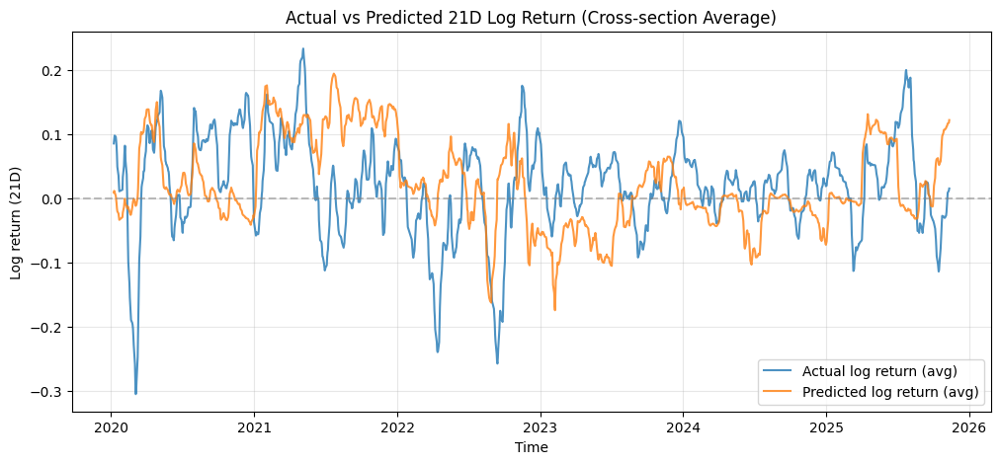

In [794]:
import pandas as pd
import matplotlib.pyplot as plt

preds = pd.read_parquet(f"{OUT_DIR_XGB}/walkforward_predictions_xgb.parquet")
preds["time"] = pd.to_datetime(preds["time"])
preds = preds.sort_values(["symbol", "time"])

# Aggregate cross-section mean theo ngày
daily_cmp = (
    preds
    .groupby("time")[["y_true", "y_pred"]]
    .mean()
    .rolling(5)          # smooth nhẹ cho dễ nhìn
    .mean()
    .reset_index()
)

plt.figure(figsize=(12, 5))
plt.plot(daily_cmp["time"], daily_cmp["y_true"], label="Actual log return (avg)", alpha=0.8)
plt.plot(daily_cmp["time"], daily_cmp["y_pred"], label="Predicted log return (avg)", alpha=0.8)

plt.axhline(0, color="gray", linestyle="--", alpha=0.5)
plt.title("Actual vs Predicted 21D Log Return (Cross-section Average)")
plt.xlabel("Time")
plt.ylabel("Log return (21D)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()



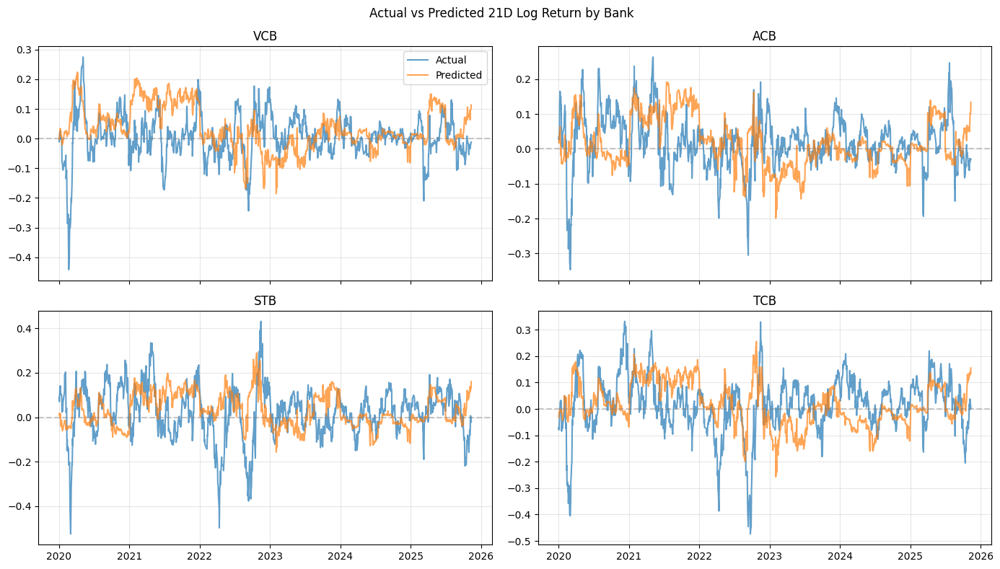

In [795]:
symbols = ["VCB", "ACB", "STB", "TCB"]  # chọn 4 mã tiêu biểu

fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex=True)
axes = axes.flatten()

for ax, sym in zip(axes, symbols):
    sub = preds[preds["symbol"] == sym]

    ax.plot(sub["time"], sub["y_true"], label="Actual", alpha=0.7)
    ax.plot(sub["time"], sub["y_pred"], label="Predicted", alpha=0.7)

    ax.axhline(0, color="gray", linestyle="--", alpha=0.4)
    ax.set_title(sym)
    ax.grid(alpha=0.3)

axes[0].legend()
fig.suptitle("Actual vs Predicted 21D Log Return by Bank")
plt.tight_layout()
plt.show()


In [796]:
feat_used_full = drop_all_nan_features(model_df, feature_cols)

X_all = model_df[feat_used_full].values
y_all = model_df["log_return_21d"].values

xgb_full = make_xgb_regressor()
xgb_full.fit(X_all, y_all)

joblib.dump(
    xgb_full,
    os.path.join(OUT_DIR_XGB, "xgb_fullfit.joblib")
)

with open(os.path.join(OUT_DIR_XGB, "feature_cols_used_fullfit.json"), "w") as f:
    json.dump({"feature_cols_used_fullfit": feat_used_full}, f, indent=2)


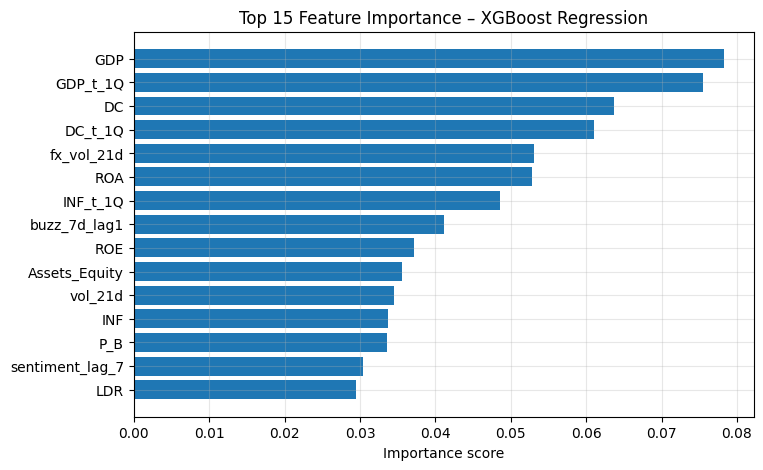

In [798]:
import json
import pandas as pd
import joblib

# Load model + feature list
xgb_model = joblib.load(f"{OUT_DIR_XGB}/xgb_fullfit.joblib")

with open(f"{OUT_DIR_XGB}/feature_cols_used_fullfit.json") as f:
    feat_used = json.load(f)["feature_cols_used_fullfit"]

importances = xgb_model.feature_importances_

fi_df = (
    pd.DataFrame({
        "feature": feat_used,
        "importance": importances
    })
    .sort_values("importance", ascending=False)
)

top_k = 15
fi_top = fi_df.head(top_k)

plt.figure(figsize=(8, 5))
plt.barh(fi_top["feature"][::-1], fi_top["importance"][::-1])
plt.title("Top 15 Feature Importance – XGBoost Regression")
plt.xlabel("Importance score")
plt.grid(alpha=0.3)
plt.show()



### MLP Regression

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset


In [ ]:
class MLPRegressor(nn.Module):
    def __init__(self, input_dim):
        super().__init__()

        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(64, 32),
            nn.ReLU(),

            nn.Linear(32, 1)
        )

    def forward(self, x):
        return self.net(x).squeeze(-1)


In [ ]:
def train_mlp(
    X_train, y_train,
    X_val, y_val,
    input_dim,
    lr=1e-3,
    batch_size=1024,
    epochs=30,
    patience=5,
    device="cpu"
):
    model = MLPRegressor(input_dim).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    criterion = nn.HuberLoss(delta=0.01)

    train_ds = TensorDataset(
        torch.tensor(X_train, dtype=torch.float32),
        torch.tensor(y_train, dtype=torch.float32)
    )
    val_ds = TensorDataset(
        torch.tensor(X_val, dtype=torch.float32),
        torch.tensor(y_val, dtype=torch.float32)
    )

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size)

    best_loss = np.inf
    patience_cnt = 0
    best_state = None

    for epoch in range(epochs):
        # ---- train
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        # ---- validate
        model.eval()
        val_losses = []
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                val_losses.append(criterion(model(xb), yb).item())

        val_loss = np.mean(val_losses)

        if val_loss < best_loss:
            best_loss = val_loss
            best_state = model.state_dict()
            patience_cnt = 0
        else:
            patience_cnt += 1
            if patience_cnt >= patience:
                break

    model.load_state_dict(best_state)
    return model


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

results = []
pred_frames = []

for test_year, train_mask, test_mask, n_train, n_test in folds:
    train = model_df.loc[train_mask]
    test  = model_df.loc[test_mask]

    feat_used = drop_all_nan_features(train, feature_cols)
    if len(feat_used) == 0:
        continue

    # ----- Impute + scale (reuse sklearn for stability)
    imputer = SimpleImputer(strategy="median")
    scaler = StandardScaler()

    X_train = scaler.fit_transform(imputer.fit_transform(train[feat_used]))
    y_train = train["log_return_21d"].values

    X_test = scaler.transform(imputer.transform(test[feat_used]))
    y_test = test["log_return_21d"].values

    # ----- Train MLP
    model = train_mlp(
        X_train, y_train,
        X_test, y_test,
        input_dim=X_train.shape[1],
        device=device
    )

    # ----- Predict
    model.eval()
    with torch.no_grad():
        y_pred = model(torch.tensor(X_test, dtype=torch.float32).to(device)).cpu().numpy()

    m = eval_regression(y_test, y_pred)
    m["TestYear"] = test_year
    m["TrainRows"] = n_train
    m["TestRows"] = n_test
    m["NumFeaturesUsed"] = len(feat_used)
    results.append(m)

    pred_frames.append(pd.DataFrame({
        "symbol": test["symbol"].values,
        "time": test["time"].values,
        "y_true": y_test,
        "y_pred": y_pred,
        "TestYear": test_year
    }))

results_df = pd.DataFrame(results).sort_values("TestYear")
display(results_df)


In [ ]:
torch.save({
    "model_state": model.state_dict(),
    "feature_cols": feat_used,
    "scaler": scaler,
    "imputer": imputer
}, os.path.join(OUT_DIR, f"mlp_fold_{test_year}.pt"))


## 3.2. Direction model – classification

Định nghĩa lại bài toán Direction (rất quan trọng)

### 1.1. Bạn **không** đang làm:

* Predict giá
    
* Predict return chính xác
    

### 1.2. Bạn **đang làm**:

> **Dự đoán xác suất tăng giá trung hạn (21D) có điều kiện theo bối cảnh thị trường**

Do đó, target nên là:

```text
Direction_21d ∈ {0, 1}
```

### 1.3. Định nghĩa chuẩn (khuyến nghị)

```python
Direction_21d = 1 if log_return_21d > 0 else 0
```

📌 Không dùng threshold phức tạp lúc này  
📌 Không dùng quantile (sẽ dùng sau cho regime)

* * *

## 2. Dataset cho Direction model

### 2.1. Input features

👉 **Giữ nguyên toàn bộ feature engineering bạn đã làm**

| Nhóm | Giữ lại? | Lý do |
| --- | --- | --- |
| Market (A) | ✅ | Momentum, trend |
| Technical (B) | ✅ | State thị trường |
| Sentiment (C) | ✅ | Expectation |
| Macro (D) | ✅ | Regime |
| Bank fundamentals (E) | ✅ | Cross-section bias |

### 2.2. Target leakage check

* Target: `log_return_21d` (t+21)
    
* Features: **t, t−k**  
    → OK, **không look-ahead**
    

* * *

## 3. Kiến trúc Direction model (baseline)

### 3.1. Vì sao **không dùng RidgeClassifier trước?**

* RidgeClassifier = threshold tuyến tính
    
* Trong finance:
    
    * Direction thường **phi tuyến**
        
    * Interaction nhiều (vol × trend × macro)
        

👉 **Baseline tốt nhất**:

### 3.2. Hai model nên dùng song song

| Model | Vai trò |
| --- | --- |
| **Logistic Regression (L2)** | Linear probability baseline |
| **XGBoost Classifier** | Nonlinear probability |

📌 Sau này ensemble

* * *

## 4. Metrics: đừng dùng Accuracy bừa bãi

### 4.1. Metrics **bắt buộc**

| Metric | Ý nghĩa |
| --- | --- |
| **AUC** | Xếp hạng đúng không |
| **Precision (Up)** | Dự đoán tăng có đáng tin |
| **Recall (Up)** | Có bỏ lỡ cơ hội không |
| **Balanced Accuracy** | Tránh lệch class |
| **Directional Hit Rate** | Giống SignAcc |

📌 Accuracy thuần **không đủ**

* * *

## 5. Walk-forward strategy (giữ nguyên)

Bạn **giữ nguyên y như regression**:

* Expanding window
    
* Test theo từng năm
    
* Không shuffle
    
* Không cross-val random
    

* * *

## 6. Kỳ vọng kết quả (để bạn không sốc)

Nếu model **tốt**:

| Metric | Kỳ vọng |
| --- | --- |
| AUC | 0.55 – 0.62 |
| Direction Hit Rate | 0.55 – 0.60 |
| Precision (Up) | > 0.55 |
| Recall (Up) | ~ 0.50 |

📌 Nếu AUC > 0.60 → **rất tốt trong finance**

* * *

## 7. Pipeline Direction (logic)

```text
Features (A–E)
   ↓
Imputer (median)
   ↓
Scaler (Logistic only)
   ↓
Classifier
   ↓
P(Direction=Up)
   ↓
Decision layer (LLM / rules)
```

In [799]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix
)

from xgboost import XGBClassifier
import joblib


In [800]:
def make_direction_target(df, ret_col="log_return_21d", threshold=0.01):
    """
    Direction target:
        1 = Up
        0 = Down
        NaN = Neutral (drop)
    """
    y = pd.Series(np.nan, index=df.index)
    y[df[ret_col] > threshold] = 1
    y[df[ret_col] < -threshold] = 0
    return y


In [801]:
df["Direction"] = make_direction_target(
    df,
    ret_col="log_return_21d",
    threshold=0.01
)


In [802]:
clf_df = df[
    ["symbol","time","Direction"] + feature_cols
].copy()

# Target phải có
clf_df = clf_df.dropna(subset=["Direction"])

# Core technical phải có (tránh dữ liệu quá nát)
core_cols = group_A + group_B
clf_df = clf_df.dropna(subset=core_cols)

clf_df["time"] = pd.to_datetime(clf_df["time"])


In [803]:
min_year = int(clf_df["time"].dt.year.min())
max_year = int(clf_df["time"].dt.year.max())

first_test_year = 2020
last_test_year = max_year

folds = build_walk_forward_folds(
    clf_df,
    date_col="time",
    start_train="2015-01-01",
    first_test_year=first_test_year,
    last_test_year=last_test_year,
    min_test_rows=200
)

print("Folds created:", len(folds))


Folds created: 6


In [804]:
xgb_clf = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", XGBClassifier(
        n_estimators=300,
        max_depth=5,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="logloss",
        random_state=42,
        n_jobs=-1
    ))
])


In [805]:
results = []

for test_year, train_mask, test_mask, n_train, n_test in folds:
    train = clf_df.loc[train_mask]
    test  = clf_df.loc[test_mask]

    X_train = train[feature_cols].values
    y_train = train["Direction"].values.astype(int)

    X_test  = test[feature_cols].values
    y_test  = test["Direction"].values.astype(int)

    xgb_clf.fit(X_train, y_train)

    y_pred = xgb_clf.predict(X_test)
    y_prob = xgb_clf.predict_proba(X_test)[:, 1]

    metrics = {
        "Model": "XGBoost_Direction",
        "TestYear": test_year,
        "TrainRows": n_train,
        "TestRows": n_test,
        "Accuracy": accuracy_score(y_test, y_pred),
        "ROC_AUC": roc_auc_score(y_test, y_prob),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1": f1_score(y_test, y_pred)
    }

    results.append(metrics)


In [806]:
results_df = pd.DataFrame(results).sort_values("TestYear")

print("Walk-forward results (Direction – XGBoost):")
display(results_df)

print("\nOverall mean:")
display(
    results_df[
        ["Accuracy","ROC_AUC","Precision","Recall","F1"]
    ].mean()
)


Walk-forward results (Direction – XGBoost):


,Model,TestYear,TrainRows,TestRows,Accuracy,ROC_AUC,Precision,Recall,F1
0,XGBoost_Direction,2020,10004,3028,0.582893,0.556072,0.708210,0.680285,0.693967
1,XGBoost_Direction,2021,13032,3051,0.631596,0.533888,0.634995,0.982910,0.771545
2,XGBoost_Direction,2022,16083,3218,0.446861,0.458947,0.407658,0.498623,0.448575
3,XGBoost_Direction,2023,19301,3009,0.474909,0.462307,0.607062,0.433244,0.505632
4,XGBoost_Direction,2024,22310,2956,0.538904,0.637203,0.771772,0.297971,0.429946
5,XGBoost_Direction,2025,25266,2663,0.619977,0.667355,0.719839,0.643885,0.679747



Overall mean:


,0
Accuracy,0.549190
ROC_AUC,0.552629
Precision,0.641589
Recall,0.589486
F1,0.588235


In [807]:
last_year = results_df["TestYear"].max()

train_mask, test_mask = None, None
for y, tr, te, _, _ in folds:
    if y == last_year:
        train_mask, test_mask = tr, te
        break

test = clf_df.loc[test_mask]
X_test = test[feature_cols].values
y_test = test["Direction"].values.astype(int)

y_pred = xgb_clf.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print(f"Confusion matrix – {last_year}")
print(cm)


Confusion matrix – 2025
[[ 577  418]
 [ 594 1074]]


In [808]:
xgb_clf.fit(
    clf_df[feature_cols].values,
    clf_df["Direction"].values.astype(int)
)

booster = xgb_clf.named_steps["model"]

importance = booster.feature_importances_

fi_df = (
    pd.DataFrame({
        "feature": feature_cols,
        "importance": importance
    })
    .sort_values("importance", ascending=False)
)

display(fi_df.head(20))


,feature,importance
20,GDP_t_1Q,0.097322
21,INF_t_1Q,0.080666
19,DC,0.069522
22,DC_t_1Q,0.058550
17,GDP,0.053154
24,fx_vol_21d,0.052159
18,INF,0.049939
27,P_B,0.039155
25,ROE,0.036125
7,close_vs_ma63,0.036018


In [809]:
joblib.dump(xgb_clf, "direction_xgb_model.joblib")
results_df.to_csv("direction_xgb_results.csv", index=False)
fi_df.to_csv("direction_xgb_feature_importance.csv", index=False)


## 3.3 Risk model
## 1. Risk model trả lời câu hỏi gì?

**KHÔNG phải**:

> “Cổ phiếu này có rủi ro cao hay thấp về mặt doanh nghiệp?”

**MÀ LÀ**:

> “Trong **horizon H (21–30 ngày tới)**, **biến động giá có lớn không**?”

Nói cách khác:

* Return model: _đi bao nhiêu_
    
* Direction model: _đi lên hay xuống_
    
* **Risk model: _đi có mạnh / rung lắc / khó chịu không_**
    

Đây là thứ quyết định:

* position size
    
* confidence score
    
* có nên recommend hay chỉ “theo dõi”
    

* * *

## 2. Target cho Risk model (rất quan trọng)

### ✅ Best practice (chuẩn industry)

### **Target = future realized volatility**

Ví dụ:

```text
risk_target = std( log_return_{t+1:t+21} )
```

Hoặc:

```text
vol_21d_future
```

Không dùng:

* drawdown (quá noisy)
    
* binary high/low risk (mất thông tin)
    

### Optional (advanced)

Bạn có thể dự đoán:

* `log(vol_21d_future)`
    
* hoặc `vol_21d_future / vol_21d_past` (vol regime shift)
    

* * *

## 3. Feature selection cho Risk model

### Nhóm nên dùng (CORE)

#### 🟢 Group A – Market

Rất quan trọng

* vol_5d
    
* vol_21d
    
* high_low_range
    
* ret_1d (abs)
    
* ret_5d (abs)
    

👉 Volatility **có tính clustering**, quá khứ là predictor mạnh nhất

* * *

#### 🟢 Group B – Technical structure

Cực kỳ phù hợp

* ATR_14_pct
    
* BB_width
    
* RSI_14 (gián tiếp – overbought dễ rung)
    

* * *

### Nhóm dùng hạn chế (OPTIONAL)

#### 🟡 Group C – Sentiment

Chỉ dùng:

* buzz_7d_lag1
    
* sentiment_decay_lag1
    

Lý do:

* Tin tức → **tăng volatility**
    
* Nhưng sentiment sign không quan trọng
    

👉 Không dùng sentiment_lag raw cho risk

* * *

### Nhóm nên **loại bỏ**

#### 🔴 Group E – Fundamentals

* Quá chậm
    
* Không giúp dự đoán rung lắc ngắn hạn
    

#### 🔴 Macro GDP / ROE / P/B

* Không quyết định volatility 1–2 tháng
    

* * *

### FX?

👉 Chỉ dùng nếu:

* Bank có exposure ngoại tệ
    
* Hoặc thị trường đang stress
    

Nếu dùng:

* fx_vol_21d (OK)
    
* fx_ret ❌ (không cần cho risk)
    

* * *

## 4. Kiến trúc model nên dùng

### Không dùng Classification cho Risk (trừ khi rất cần)

#### ❌ Không nên:

* High / Low risk classifier  
    → mất thông tin, khó calibrate
    

* * *

### ✅ Regression model

#### Baseline tốt nhất:

* **XGBoost Regressor**
    
* hoặc LightGBM Regressor
    

Lý do:

* Bắt được non-linear
    
* Volatility không tuyến tính
    
* Không cần scaling
    

* * *

### Target & loss

```text
target = vol_21d_future
loss   = RMSE / MAE
```

Có thể:

* log-transform target nếu lệch mạnh
    

* * *

## 5. Output của Risk model dùng như nào?

### Output KHÔNG phải để show cho user

Mà dùng để:

#### 5.1. Adjust confidence

```text
Confidence = f(Return, Direction, Risk)
```

Ví dụ:

* Return cao + Risk thấp → Strong Buy
    
* Return cao + Risk cao → Speculative Buy
    
* Return thấp + Risk cao → Avoid
    

* * *

#### 5.2. Position sizing (nếu sau này mở rộng)

```text
Position ∝ 1 / Risk
```

* * *

#### 5.3. Filter recommendation

```text
Nếu Risk > percentile 80% → không recommend
```

* * *

## 6. Pipeline chuẩn cho Risk model

```text
Input (daily features)
   ↓
Lag / rolling (NO future)
   ↓
Predict vol_21d_future
   ↓
Normalize theo cross-section
   ↓
Feed vào Decision Layer
```

* * *

## 7. Những sai lầm thường gặp (tránh)

❌ Dùng ROE, P/B cho risk  
❌ Dùng same feature set như regression  
❌ Classify risk quá sớm  
❌ Không log-transform vol  
❌ Mix future volatility vào feature

* * *

## 8. Tóm tắt thiết kế Risk model (chuẩn)

**Target**

```text
future realized volatility (21d)
```

**Feature**

```text
Group A + Group B
(+ buzz / fx_vol nếu cần)
```

**Model**

```text
XGBoost Regressor
```

**Vai trò**

```text
Risk control – confidence – filtering
```

* * *



In [820]:
# ============================================================
# RISK MODEL (Volatility Forecast) — Walk-forward + XGBoost
# Target: vol_21d_future = std(log returns next 21 trading days)
# ============================================================

import os
import json
import joblib
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error

# If you don't have xgboost installed: pip install xgboost
from xgboost import XGBRegressor


# =========================
# 0) Helpers
# =========================
def make_quarter_date(dt: pd.Series) -> pd.Series:
    dt = pd.to_datetime(dt)
    q = dt.dt.quarter
    y = dt.dt.year
    month = (q - 1) * 3 + 1
    return pd.to_datetime(dict(year=y, month=month, day=1))


def safe_log_return_1d(close: pd.Series) -> pd.Series:
    """log return 1-day: log(close_t / close_{t-1})"""
    close = close.astype("float64")
    return np.log(close / close.shift(1))


def future_realized_vol(close: pd.Series, horizon: int = 21) -> pd.Series:
    """
    Future realized vol over next horizon days, at time t:
        vol_future(t) = std( logret_{t+1} ... logret_{t+horizon} )
    Implementation:
        - compute 1d log returns
        - shift(-1) so that logret_{t+1} aligns with t
        - rolling std over horizon on shifted series
    """
    logret_1d = safe_log_return_1d(close)
    logret_next = logret_1d.shift(-1)
    vol_future = logret_next.rolling(horizon, min_periods=horizon).std()
    return vol_future


def build_walk_forward_folds(
    df: pd.DataFrame,
    date_col: str,
    start_train: str,
    first_test_year: int,
    last_test_year: int,
    min_test_rows: int = 200
):
    """
    Expanding window folds by YEAR:
      Train: [start_train .. end of (test_year-1)]
      Test : [test_year .. end of test_year]
    """
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])

    folds = []
    for test_year in range(first_test_year, last_test_year + 1):
        train_end = pd.Timestamp(f"{test_year-1}-12-31")
        test_start = pd.Timestamp(f"{test_year}-01-01")
        test_end   = pd.Timestamp(f"{test_year}-12-31")

        train_mask = (df[date_col] >= pd.Timestamp(start_train)) & (df[date_col] <= train_end)
        test_mask  = (df[date_col] >= test_start) & (df[date_col] <= test_end)

        n_train = int(train_mask.sum())
        n_test  = int(test_mask.sum())

        if n_train == 0 or n_test < min_test_rows:
            continue

        folds.append((test_year, train_mask, test_mask, n_train, n_test))

    return folds


def eval_regression(y_true: np.ndarray, y_pred: np.ndarray) -> dict:
    mae = mean_absolute_error(y_true, y_pred)
    rmse = float(np.sqrt(mean_squared_error(y_true, y_pred)))
    corr = np.corrcoef(y_true, y_pred)[0, 1] if len(y_true) > 1 else np.nan
    return {"MAE": mae, "RMSE": rmse, "Corr": corr}


def ensure_dir(path: str) -> None:
    os.makedirs(path, exist_ok=True)


# =========================
# 1) Assemble DAILY dataset (same style as regression)
# =========================
# Assumptions: you already have in memory
# - ohlcv with columns: ["symbol","time","open","high","low","close", ... RSI_14, ATR_14_pct, BB_width ...]
# - price_feat with market features on ["symbol","time"]
# - sentiment_features_df on ["symbol","date"] (optional but supported)
# - fx_features_daily on ["date"] (optional but supported)
# - macro_features on ["quarter_date"] (optional but supported)
# - bank_data on ["symbol","quarter_date"] (optional but supported)

df = ohlcv[["symbol","time","close","RSI_14","ATR_14_pct","BB_width"]].copy()
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values(["symbol","time"])

# Guard: close must be valid
df = df[df["close"].notna() & (df["close"] > 0)].copy()

# Join market features (Group A)
market_cols = [
    "ret_1d","ret_5d","ret_21d",
    "vol_5d","vol_21d",
    "high_low_range",
    "close_vs_ma21","close_vs_ma63"
]
df = df.merge(
    price_feat[["symbol","time"] + market_cols],
    on=["symbol","time"],
    how="left"
)

# Join sentiment (Group C) — optional but included
if "sentiment_features_df" in globals():
    sent = sentiment_features_df.copy()
    sent["date"] = pd.to_datetime(sent["date"])
    sent = sent.rename(columns={"date":"time"})
    df = df.merge(sent, on=["symbol","time"], how="left")

# Join FX context (daily) — optional but included
if "fx_features_daily" in globals():
    fx = fx_features_daily.copy()
    fx["date"] = pd.to_datetime(fx["date"])
    fx = fx.rename(columns={"date":"time"})
    df = df.merge(fx, on="time", how="left")

# Quarter mapping + macro + bank — optional but included
df["quarter_date"] = make_quarter_date(df["time"])

if "macro_features" in globals():
    df = df.merge(macro_features, on="quarter_date", how="left")

if "bank_data" in globals():
    df = df.merge(bank_data, on=["symbol","quarter_date"], how="left")

# Timeline
df = df[df["time"] >= pd.Timestamp("2015-01-01")].copy()


# =========================
# 2) Target: vol_21d_future
# =========================
HORIZON = 21

df["vol_21d_future"] = (
    df.groupby("symbol")["close"]
      .transform(lambda s: future_realized_vol(s, horizon=HORIZON))
)

# Optional: log-transform target to reduce skew (often helpful)
# Keep both; you can switch later without recompute
df["log_vol_21d_future"] = np.log(df["vol_21d_future"])


# =========================
# 3) Feature list for Risk model
# =========================
# Recommended: focus on market+technical; sentiment+fx optional; fundamentals/macro optional
group_A = market_cols
group_B = ["RSI_14","ATR_14_pct","BB_width"]

group_C = []
if "sentiment_features_df" in globals():
    # keep only "risk-relevant" sentiment lags (buzz/decay + maybe 1-3 lag)
    # adjust to your available columns
    possible_c = [
        "sentiment_lag_1","sentiment_lag_3","sentiment_lag_7",
        "sentiment_7d_avg_lag1","buzz_7d_lag1","sentiment_decay_lag1"
    ]
    group_C = [c for c in possible_c if c in df.columns]

group_D = []
# macro (quarterly lag) + fx context
possible_d = ["GDP","INF","DC","GDP_t_1Q","INF_t_1Q","DC_t_1Q","fx_ret_5d","fx_vol_21d"]
group_D = [c for c in possible_d if c in df.columns]

group_E = []
# fundamentals (optional for risk; include only if you intentionally want)
possible_e = ["ROE","ROA","P_B","LDR","CIR","Assets_Equity"]
group_E = [c for c in possible_e if c in df.columns]

# Strategy: core = A+B, optional = C+D+E
feature_cols = group_A + group_B + group_C + group_D + group_E


# =========================
# 4) Build model_df + handle missing
# =========================
target_col = "vol_21d_future"     # or "log_vol_21d_future" if you prefer
model_df = df[["symbol","time", target_col] + feature_cols].copy()

# Drop rows where target missing
model_df = model_df.dropna(subset=[target_col]).copy()

# Core must exist (or you'll train on junk)
core_cols = group_A + group_B
model_df = model_df.dropna(subset=core_cols).copy()


# =========================
# 5) Walk-forward folds
# =========================
min_year = int(model_df["time"].dt.year.min())
max_year = int(model_df["time"].dt.year.max())

first_test_year = 2020
last_test_year = max_year

folds = build_walk_forward_folds(
    model_df,
    date_col="time",
    start_train="2015-01-01",
    first_test_year=first_test_year,
    last_test_year=last_test_year,
    min_test_rows=200
)

print("Folds created:", len(folds))
if len(folds) == 0:
    raise RuntimeError("No folds available. Consider lowering first_test_year or min_test_rows.")


# =========================
# 6) Model: Imputer + XGBoost Regressor
# =========================
# NOTE: XGBoost can handle non-linearities well for volatility.
# Keep it conservative to avoid overfit.
xgb = XGBRegressor(
    n_estimators=500,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.0,
    reg_lambda=1.0,
    min_child_weight=5,
    random_state=42,
    n_jobs=-1,
    objective="reg:squarederror"
)

risk_model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("model", xgb)
])


# =========================
# 7) Train/Eval per fold
# =========================
results = []
fold_artifacts = []  # store per-fold preds if you want later

for test_year, train_mask, test_mask, n_train, n_test in folds:
    train = model_df.loc[train_mask].copy()
    test  = model_df.loc[test_mask].copy()

    X_train = train[feature_cols].values
    y_train = train[target_col].values
    X_test  = test[feature_cols].values
    y_test  = test[target_col].values

    risk_model.fit(X_train, y_train)
    y_pred = risk_model.predict(X_test)

    m = eval_regression(y_test, y_pred)
    m["Model"] = "XGBoostRisk"
    m["TestYear"] = test_year
    m["TrainRows"] = n_train
    m["TestRows"] = n_test
    m["NumFeaturesUsed"] = len(feature_cols)

    results.append(m)

    # Save fold predictions (optional)
    tmp = test[["symbol","time"]].copy()
    tmp["y_true"] = y_test
    tmp["y_pred"] = y_pred
    tmp["TestYear"] = test_year
    fold_artifacts.append(tmp)

results_df = pd.DataFrame(results).sort_values("TestYear")
print("\nWalk-forward results (Risk model):")
display(results_df)

print("\nOverall mean:")
display(results_df[["MAE","RMSE","Corr"]].mean(numeric_only=True))


# =========================
# 8) Fit final model on all data (for deployment)
# =========================
risk_model.fit(model_df[feature_cols].values, model_df[target_col].values)


# =========================
# 9) Feature importance (global)
# =========================
# Note: for Pipeline, access XGB model via named_steps["model"]
xgb_fitted = risk_model.named_steps["model"]
importances = getattr(xgb_fitted, "feature_importances_", None)

if importances is not None:
    fi_df = pd.DataFrame({
        "feature": feature_cols,
        "importance": importances
    }).sort_values("importance", ascending=False)
    print("\nTop feature importances:")
    display(fi_df.head(20))
else:
    fi_df = pd.DataFrame({"feature": feature_cols, "importance": np.nan})


# =========================
# 10) Save results + model
# =========================
ARTIFACT_DIR = "./artifacts_risk_model"
ensure_dir(ARTIFACT_DIR)

# Save evaluation table
results_path = os.path.join(ARTIFACT_DIR, "walk_forward_results.csv")
results_df.to_csv(results_path, index=False)

# Save feature importance
fi_path = os.path.join(ARTIFACT_DIR, "feature_importance.csv")
fi_df.to_csv(fi_path, index=False)

# Save predictions (optional)
preds_df = pd.concat(fold_artifacts, ignore_index=True)
preds_path = os.path.join(ARTIFACT_DIR, "fold_predictions.csv")
preds_df.to_csv(preds_path, index=False)

# Save model (pipeline)
model_path = os.path.join(ARTIFACT_DIR, "risk_model_xgb.pkl")
joblib.dump(risk_model, model_path)

# Save config (reproducibility)
config = {
    "target_col": target_col,
    "horizon": HORIZON,
    "first_test_year": first_test_year,
    "last_test_year": last_test_year,
    "num_features": len(feature_cols),
    "feature_cols": feature_cols,
    "xgb_params": xgb.get_params()
}
config_path = os.path.join(ARTIFACT_DIR, "config.json")
with open(config_path, "w", encoding="utf-8") as f:
    json.dump(config, f, ensure_ascii=False, indent=2)

print("\nSaved artifacts:")
print("-", results_path)
print("-", fi_path)
print("-", preds_path)
print("-", model_path)
print("-", config_path)


Folds created: 6

Walk-forward results (Risk model):


,MAE,RMSE,Corr,Model,TestYear,TrainRows,TestRows,NumFeaturesUsed
0,0.001440,0.002781,0.969060,XGBoostRisk,2020,11163,3254,31
1,0.001018,0.001522,0.982275,XGBoostRisk,2021,14417,3383,31
2,0.001104,0.001505,0.988945,XGBoostRisk,2022,17800,3486,31
3,0.000782,0.001167,0.979751,XGBoostRisk,2023,21286,3486,31
4,0.000659,0.001045,0.978103,XGBoostRisk,2024,24772,3500,31
5,0.000824,0.001416,0.986567,XGBoostRisk,2025,28272,3262,31



Overall mean:


,0
MAE,0.000971
RMSE,0.001573
Corr,0.980783



Top feature importances:


,feature,importance
4,vol_21d,0.592629
9,ATR_14_pct,0.236288
10,BB_width,0.109418
8,RSI_14,0.016511
3,vol_5d,0.009338
28,LDR,0.005804
18,INF,0.003765
2,ret_21d,0.002403
29,CIR,0.002361
27,P_B,0.002113



Saved artifacts:
- ./artifacts_risk_model/walk_forward_results.csv
- ./artifacts_risk_model/feature_importance.csv
- ./artifacts_risk_model/fold_predictions.csv
- ./artifacts_risk_model/risk_model_xgb.pkl
- ./artifacts_risk_model/config.json


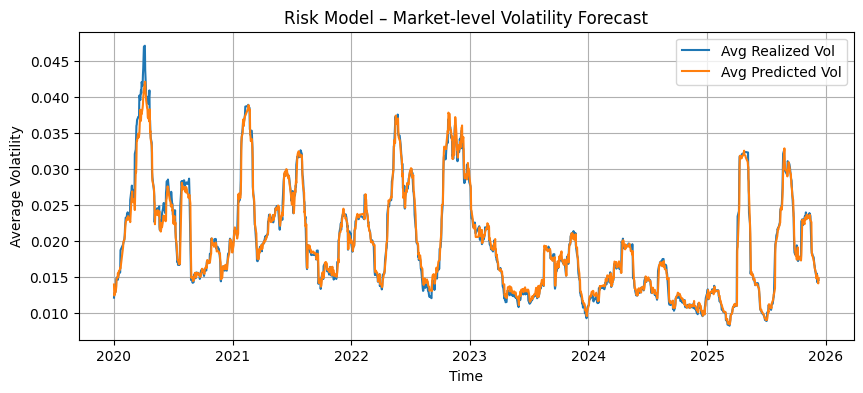

In [821]:
avg_df = (
    preds_df
    .groupby("time")[["y_true","y_pred"]]
    .mean()
    .reset_index()
)

plt.figure(figsize=(10, 4))
plt.plot(avg_df["time"], avg_df["y_true"], label="Avg Realized Vol")
plt.plot(avg_df["time"], avg_df["y_pred"], label="Avg Predicted Vol")

plt.xlabel("Time")
plt.ylabel("Average Volatility")
plt.title("Risk Model – Market-level Volatility Forecast")
plt.legend()
plt.grid(True)
plt.show()


## 3.4. Regime model
Regime model trả lời câu hỏi gì?

**KHÔNG phải**:

* “Cổ phiếu này tốt hay xấu?”
    
* “Có nên mua không?”
    

**MÀ LÀ**:

> “Thị trường / cổ phiếu đang ở **trạng thái vận động nào**?”

Cụ thể:

* **Bull** → xu hướng tăng rõ, nên ưu tiên theo trend
    
* **Sideway** → nhiễu, tránh dự báo return mạnh
    
* **Bear** → xu hướng giảm, ưu tiên phòng thủ / tránh
    

Regime model **không trực tiếp sinh alpha**, nhưng:

* **quyết định có nên tin Return / Direction model hay không**
    
* **điều chỉnh confidence, filter recommendation**
    

* * *

# 2. Regime ≠ Direction (điểm rất quan trọng)

| Khái niệm | Direction | Regime |
| --- | --- | --- |
| Horizon | 1 điểm (t+21d) | 1 giai đoạn |
| Câu hỏi | Lên hay xuống? | Đang trong pha nào? |
| Nhạy | Cao | Thấp |
| Noise | Nhiều | Ít |
| Dùng để | Entry | Strategy / Filter |

👉 **Regime = bối cảnh**, Direction = tín hiệu ngắn hạn.

* * *

# 3. Target cho Regime model (thiết kế đúng)

### Cách chuẩn, đơn giản, không look-ahead

Dùng **return + volatility** trong **quá khứ gần**, không dùng tương lai.

### Ví dụ (21–63 ngày):

```text
ret_63d = sum(log_return_1d[t-63 : t])
vol_63d = std(log_return_1d[t-63 : t])
```

Sau đó gán nhãn:

```text
Bull:
    ret_63d > +θ1 AND vol_63d < θ2

Bear:
    ret_63d < -θ1

Sideway:
    otherwise
```

Ví dụ threshold hợp lý (có thể tune):

```text
θ1 = 5%–7%
θ2 = median(vol_63d)
```

👉 Đây là **labeling heuristic**, không phải ground truth tuyệt đối – và điều này là OK cho regime.

* * *

# 4. Vì sao Regime nên là Classification?

* Regime **mang tính trạng thái**, không liên tục
    
* Không cần dự đoán chính xác từng ngày
    
* Classification giúp:
    
    * ổn định
        
    * dễ diễn giải
        
    * dễ dùng trong decision layer
        

**Số class tối ưu: 3**

```text
{Bear, Sideway, Bull}
```

* * *

# 5. Feature nên dùng cho Regime (rất quan trọng)

## Dùng (CORE)

### 🟢 Group A – Market structure

* ret_21d
    
* ret_63d
    
* vol_21d
    
* vol_63d
    
* close_vs_ma21
    
* close_vs_ma63
    

👉 Regime = trend + volatility

* * *

### 🟢 Group B – Technical structure

* BB_width
    
* ATR_14_pct
    
* RSI_14 (coarse signal, không dùng threshold cứng)
    

* * *

## Dùng hạn chế (OPTIONAL)

### 🟡 Macro

* GDP_t_1Q
    
* INF_t_1Q
    

Chỉ để **ổn định regime dài hạn**, weight nhỏ.

* * *

## KHÔNG dùng

❌ Sentiment (quá nhiễu cho regime)  
❌ Fundamentals (quá chậm)  
❌ Direction label / future return

* * *

# 6. Kiến trúc model khuyến nghị

### Model tốt nhất cho Regime

* **XGBoost Classifier**
    
* Objective: `multi:softprob`
    
* Không cần scaling
    
* Handle non-linearity tốt
    

### Không nên dùng:

* LSTM (overkill)
    
* HMM (khó debug, khó explain cho user)
    
* Rule-only (quá cứng)
    

* * *

# 7. Output của Regime model dùng như thế nào?

### 7.1. Filter recommendation

```text
If Regime == Bear:
    Không recommend BUY
```

* * *

### 7.2. Adjust confidence

```text
FinalScore = ReturnScore × DirectionProb × RegimeWeight
```

Ví dụ:

* Bull → RegimeWeight = 1.0
    
* Sideway → 0.6
    
* Bear → 0.2
    

* * *

### 7.3. Narrative cho LLM (rất quan trọng)

LLM có thể nói:

> “Ngân hàng ACB đang trong pha **sideway**, dù dự báo lợi nhuận tích cực nhưng biên độ dao động lớn → chỉ phù hợp theo dõi, chưa nên giải ngân mạnh.”

👉 Đây là **giá trị UX cực lớn**.

* * *

# 8. Pipeline Regime model (chuẩn)

```text
Daily OHLCV
   ↓
Rolling features (21d, 63d)
   ↓
Label Regime (Bull / Sideway / Bear)
   ↓
Train XGBoost Classifier
   ↓
Predict regime probabilities
   ↓
Feed vào Decision Layer
```

* * *

# 9. Checklist để không sai

*  Regime label dùng **quá khứ**, không dùng future
    
*  Không trùng với Direction target
    
*  Feature thiên về **trend + vol**
    
*  Output dùng để **filter / weight**, không dùng trực tiếp để buy/sell
    
*  Có thể explain bằng ngôn ngữ tự nhiên

In [815]:
import os
import json
import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix, log_loss
)
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# XGBoost
from xgboost import XGBClassifier

# =========================
# 0) Helpers
# =========================

def make_quarter_date(dt: pd.Series) -> pd.Series:
    dt = pd.to_datetime(dt)
    q = dt.dt.quarter
    y = dt.dt.year
    month = (q - 1) * 3 + 1
    return pd.to_datetime(dict(year=y, month=month, day=1))

def safe_logret_1d(close: pd.Series) -> pd.Series:
    """
    log return 1d = log(close_t / close_{t-1})
    Past-only.
    """
    close = close.astype(float)
    close = close.where(close > 0, np.nan)
    return np.log(close / close.shift(1))

def build_walk_forward_folds(df, date_col, start_train, first_test_year, last_test_year, min_test_rows=200):
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])
    folds = []
    for test_year in range(first_test_year, last_test_year + 1):
        train_end = pd.Timestamp(f"{test_year-1}-12-31")
        test_start = pd.Timestamp(f"{test_year}-01-01")
        test_end   = pd.Timestamp(f"{test_year}-12-31")

        train_mask = (df[date_col] >= pd.Timestamp(start_train)) & (df[date_col] <= train_end)
        test_mask  = (df[date_col] >= test_start) & (df[date_col] <= test_end)

        n_train = int(train_mask.sum())
        n_test  = int(test_mask.sum())
        if n_train == 0 or n_test < min_test_rows:
            continue

        folds.append((test_year, train_mask, test_mask, n_train, n_test))
    return folds

def compute_sample_weights(y: np.ndarray) -> np.ndarray:
    """
    Basic inverse-frequency weights for multi-class.
    """
    y = np.asarray(y)
    classes, counts = np.unique(y, return_counts=True)
    freq = counts / counts.sum()
    inv = 1.0 / np.maximum(freq, 1e-12)
    inv = inv / inv.mean()  # normalize
    w_map = {c: inv[i] for i, c in enumerate(classes)}
    return np.array([w_map[v] for v in y], dtype=float)

def eval_multiclass(y_true, proba, labels=(0,1,2)) -> dict:
    """
    y_true: int labels
    proba:  (n, n_classes) softprob
    """
    y_pred = np.argmax(proba, axis=1)

    acc = accuracy_score(y_true, y_pred)
    f1_macro = f1_score(y_true, y_pred, average="macro")
    f1_weighted = f1_score(y_true, y_pred, average="weighted")

    # multiclass logloss
    ll = log_loss(y_true, proba, labels=list(labels))

    cm = confusion_matrix(y_true, y_pred, labels=list(labels))
    return {
        "Accuracy": acc,
        "F1_macro": f1_macro,
        "F1_weighted": f1_weighted,
        "LogLoss": ll,
        "ConfusionMatrix": cm
    }

def drop_all_nan_features(train_df: pd.DataFrame, feature_cols: list) -> list:
    """
    Remove features that are all-NaN in TRAIN fold.
    Prevents sklearn imputer warnings and XGB issues.
    """
    usable = []
    for c in feature_cols:
        if c not in train_df.columns:
            continue
        if train_df[c].notna().any():
            usable.append(c)
    return usable

# =========================
# 1) Regime labeling (past-only)
# =========================

def create_regime_target(
    df: pd.DataFrame,
    symbol_col: str = "symbol",
    date_col: str = "time",
    close_col: str = "close",
    lookback: int = 63,           # ~ 1 quarter trading days
    ret_thr: float = 0.05,        # 5% cumulative log-return threshold (approx)
    vol_quantile: float = 0.5     # median volatility split for "clean bull"
):
    """
    Build:
      - logret_1d
      - ret_lookback: sum(logret_1d over lookback)
      - vol_lookback: std(logret_1d over lookback)
      - regime_label: 0 Bear, 1 Sideway, 2 Bull

    Rules:
      Bull    if ret_lookback >  +ret_thr and vol_lookback <= vol_thresh
      Bear    if ret_lookback <  -ret_thr
      Sideway otherwise
    """
    out = df.copy()
    out[date_col] = pd.to_datetime(out[date_col])
    out = out.sort_values([symbol_col, date_col])

    # log return 1d
    out["logret_1d"] = out.groupby(symbol_col)[close_col].transform(safe_logret_1d)

    # rolling past-only stats
    out[f"ret_{lookback}d"] = (
        out.groupby(symbol_col)["logret_1d"]
           .transform(lambda s: s.rolling(lookback, min_periods=lookback).sum())
    )

    out[f"vol_{lookback}d"] = (
        out.groupby(symbol_col)["logret_1d"]
           .transform(lambda s: s.rolling(lookback, min_periods=lookback).std())
    )

    # volatility threshold: computed on available rows (global) to avoid symbol-specific instability
    vol_thresh = out[f"vol_{lookback}d"].quantile(vol_quantile)

    # regime: 0 Bear, 1 Sideway, 2 Bull
    cond_bull = (out[f"ret_{lookback}d"] >  ret_thr) & (out[f"vol_{lookback}d"] <= vol_thresh)
    cond_bear = (out[f"ret_{lookback}d"] < -ret_thr)

    out["regime"] = 1
    out.loc[cond_bull, "regime"] = 2
    out.loc[cond_bear, "regime"] = 0

    meta = {
        "lookback": lookback,
        "ret_thr": ret_thr,
        "vol_quantile": vol_quantile,
        "vol_thresh_value": float(vol_thresh)
    }
    return out, meta

# =========================
# 2) Assemble DAILY dataset (same style as your regression)
# =========================

# Assumptions you already have in memory:
# - ohlcv: ['symbol','time','open','high','low','close', ... + RSI_14, ATR_14_pct, BB_width]
# - price_feat: market features joined by ['symbol','time'] with market_cols
# - sentiment_features_df: ['symbol','date', ...] (optional to include, here we will EXCLUDE by default)
# - fx_features_daily: ['date','fx_ret_5d','fx_vol_21d'] daily
# - macro_features: ['quarter_date','GDP','INF','DC','GDP_t_1Q','INF_t_1Q','DC_t_1Q']
# - bank_data: ['symbol','quarter_date','ROE','ROA','P_B','LDR','CIR','Assets_Equity']

# ---- base daily keys
df = ohlcv[["symbol","time","close","RSI_14","ATR_14_pct","BB_width"]].copy()
df["time"] = pd.to_datetime(df["time"])
df = df.sort_values(["symbol","time"])

# basic sanity: close > 0
df = df[df["close"].notna() & (df["close"] > 0)].copy()

# ---- join Market Features
market_cols = [
    "ret_1d","ret_5d","ret_21d",
    "vol_5d","vol_21d",
    "high_low_range",
    "close_vs_ma21","close_vs_ma63"
]
df = df.merge(
    price_feat[["symbol","time"] + market_cols],
    on=["symbol","time"],
    how="left"
)

# ---- join FX context (daily)
fx = fx_features_daily.copy()
fx["date"] = pd.to_datetime(fx["date"])
fx = fx.rename(columns={"date":"time"})
df = df.merge(fx, on="time", how="left")

# ---- quarter mapping + macro + bank
df["quarter_date"] = make_quarter_date(df["time"])
df = df.merge(macro_features, on="quarter_date", how="left")
df = df.merge(bank_data, on=["symbol","quarter_date"], how="left")

# ---- timeline
df = df[df["time"] >= pd.Timestamp("2015-01-01")].copy()

# =========================
# 3) Create Regime target
# =========================
df_reg, regime_meta = create_regime_target(
    df,
    symbol_col="symbol",
    date_col="time",
    close_col="close",
    lookback=63,
    ret_thr=0.05,
    vol_quantile=0.5
)

# Drop rows where regime stats not available (first 63 days per symbol)
df_reg = df_reg.dropna(subset=["ret_63d","vol_63d"]).copy()

# =========================
# 4) Feature set for Regime model
# =========================
# Core: A + B + (optional) D + E
group_A = market_cols
group_B = ["RSI_14","ATR_14_pct","BB_width"]

# Macro + FX context
group_D = ["GDP","INF","DC","GDP_t_1Q","INF_t_1Q","DC_t_1Q","fx_ret_5d","fx_vol_21d"]

# Bank quarterly ratios (slow, but ok as context)
group_E = ["ROE","ROA","P_B","LDR","CIR","Assets_Equity"]

# Sentiment: exclude by default for regime (noisy). You can add later.
feature_cols = group_A + group_B + group_D + group_E

model_df = df_reg[["symbol","time","regime"] + feature_cols].copy()

# Only drop missing on very core (A+B), the rest impute
core_cols = group_A + group_B
model_df = model_df.dropna(subset=core_cols).copy()

# =========================
# 5) Walk-forward folds
# =========================
min_year = int(model_df["time"].dt.year.min())
max_year = int(model_df["time"].dt.year.max())

first_test_year = 2020
last_test_year = max_year

folds = build_walk_forward_folds(
    model_df,
    date_col="time",
    start_train="2015-01-01",
    first_test_year=first_test_year,
    last_test_year=last_test_year,
    min_test_rows=200
)

print("Folds created:", len(folds))
if len(folds) == 0:
    raise RuntimeError("No folds available. Check data coverage / min_test_rows.")

# =========================
# 6) Model: Imputer + XGBClassifier
# =========================

# We keep imputer because Macro/Bank might be missing sometimes
# (XGB can handle NaN natively, but imputer makes feature space stable and avoids brittle behaviors.)
imputer = SimpleImputer(strategy="median")

def make_xgb_clf(num_class: int = 3, seed: int = 42) -> XGBClassifier:
    return XGBClassifier(
        n_estimators=500,
        max_depth=4,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=1.0,
        min_child_weight=5,
        objective="multi:softprob",
        num_class=num_class,
        eval_metric="mlogloss",
        tree_method="hist",
        random_state=seed,
        n_jobs=-1
    )

# =========================
# 7) Train + Evaluate + Save artifacts
# =========================
ART_DIR = "./artifacts_regime_model"
os.makedirs(ART_DIR, exist_ok=True)

results = []
pred_rows = []
cm_rows = []

for test_year, train_mask, test_mask, n_train, n_test in folds:
    train = model_df.loc[train_mask].copy()
    test  = model_df.loc[test_mask].copy()

    # Drop all-NaN features in TRAIN fold to avoid warnings/instability
    used_features = drop_all_nan_features(train, feature_cols)
    if len(used_features) < 5:
        print(f"[WARN] Fold {test_year}: too few usable features ({len(used_features)}). Skipping.")
        continue

    X_train_raw = train[used_features]
    y_train = train["regime"].astype(int).values

    X_test_raw = test[used_features]
    y_test = test["regime"].astype(int).values

    # Impute
    X_train = imputer.fit_transform(X_train_raw)
    X_test  = imputer.transform(X_test_raw)

    clf = make_xgb_clf(num_class=3, seed=42)

    # Optional: class imbalance handling via weights
    sw = compute_sample_weights(y_train)
    clf.fit(X_train, y_train, sample_weight=sw)

    proba = clf.predict_proba(X_test)  # (n,3)
    metrics = eval_multiclass(y_test, proba, labels=(0,1,2))

    y_pred = np.argmax(proba, axis=1)

    results.append({
        "Model": "XGBRegime",
        "TestYear": test_year,
        "TrainRows": n_train,
        "TestRows": n_test,
        "NumFeaturesUsed": len(used_features),
        "Accuracy": metrics["Accuracy"],
        "F1_macro": metrics["F1_macro"],
        "F1_weighted": metrics["F1_weighted"],
        "LogLoss": metrics["LogLoss"],
    })

    # Save fold-level predictions for analysis
    for i in range(len(test)):
        pred_rows.append({
            "symbol": test.iloc[i]["symbol"],
            "time": test.iloc[i]["time"],
            "y_true": int(y_test[i]),
            "y_pred": int(y_pred[i]),
            "p_bear": float(proba[i, 0]),
            "p_sideway": float(proba[i, 1]),
            "p_bull": float(proba[i, 2]),
            "TestYear": test_year
        })

    cm = metrics["ConfusionMatrix"]
    cm_rows.append({
        "TestYear": test_year,
        "cm_0_0": int(cm[0,0]), "cm_0_1": int(cm[0,1]), "cm_0_2": int(cm[0,2]),
        "cm_1_0": int(cm[1,0]), "cm_1_1": int(cm[1,1]), "cm_1_2": int(cm[1,2]),
        "cm_2_0": int(cm[2,0]), "cm_2_1": int(cm[2,1]), "cm_2_2": int(cm[2,2]),
    })

# Results table
results_df = pd.DataFrame(results).sort_values("TestYear")
print("Walk-forward results (Regime model):")
display(results_df)

if len(results_df) > 0:
    print("\nOverall mean:")
    display(results_df[["Accuracy","F1_macro","F1_weighted","LogLoss"]].mean(numeric_only=True))

# Save artifacts
results_path = os.path.join(ART_DIR, "walk_forward_results.csv")
preds_path   = os.path.join(ART_DIR, "fold_predictions.csv")
cm_path      = os.path.join(ART_DIR, "confusion_matrices.csv")
cfg_path     = os.path.join(ART_DIR, "config.json")

results_df.to_csv(results_path, index=False)
pd.DataFrame(pred_rows).to_csv(preds_path, index=False)
pd.DataFrame(cm_rows).to_csv(cm_path, index=False)

config = {
    "task": "Regime classification (0=Bear, 1=Sideway, 2=Bull)",
    "labeling": regime_meta,
    "features": {
        "group_A": group_A,
        "group_B": group_B,
        "group_D": group_D,
        "group_E": group_E,
        "used_feature_cols": feature_cols
    },
    "walk_forward": {
        "start_train": "2015-01-01",
        "first_test_year": first_test_year,
        "last_test_year": last_test_year,
        "min_test_rows": 200,
        "num_folds": len(folds)
    },
    "model": {
        "type": "XGBClassifier",
        "objective": "multi:softprob",
        "num_class": 3,
        "n_estimators": 500,
        "max_depth": 4,
        "learning_rate": 0.05,
        "subsample": 0.8,
        "colsample_bytree": 0.8,
        "min_child_weight": 5,
        "reg_lambda": 1.0,
        "tree_method": "hist",
        "class_weighting": "sample_weight inverse-frequency"
    }
}
with open(cfg_path, "w", encoding="utf-8") as f:
    json.dump(config, f, ensure_ascii=False, indent=2)

print("\nSaved artifacts:")
print(f"- {results_path}")
print(f"- {preds_path}")
print(f"- {cm_path}")
print(f"- {cfg_path}")

# =========================
# 8) Train final model on ALL data (optional) + save
# =========================
# Use features usable globally (not all-NaN overall)
usable_global = [c for c in feature_cols if model_df[c].notna().any()]
X_all_raw = model_df[usable_global]
y_all = model_df["regime"].astype(int).values

X_all = imputer.fit_transform(X_all_raw)
final_clf = make_xgb_clf(num_class=3, seed=42)
final_sw = compute_sample_weights(y_all)
final_clf.fit(X_all, y_all, sample_weight=final_sw)

import joblib
model_path = os.path.join(ART_DIR, "regime_model_xgb.pkl")
bundle = {
    "model": final_clf,
    "imputer": imputer,
    "feature_cols": usable_global,
    "label_map": {0: "Bear", 1: "Sideway", 2: "Bull"},
    "labeling_meta": regime_meta
}
joblib.dump(bundle, model_path)

print(f"\nSaved model bundle:\n- {model_path}")


Folds created: 6
Walk-forward results (Regime model):


,Model,TestYear,TrainRows,TestRows,NumFeaturesUsed,Accuracy,F1_macro,F1_weighted,LogLoss
0,XGBRegime,2020,11150,3254,25,0.647511,0.636339,0.663210,0.832602
1,XGBRegime,2021,14404,3382,25,0.708161,0.576125,0.717629,0.620203
2,XGBRegime,2022,17786,3486,25,0.688181,0.586218,0.704981,0.724668
3,XGBRegime,2023,21272,3486,25,0.565691,0.498215,0.531733,0.931189
4,XGBRegime,2024,24758,3500,25,0.659714,0.650790,0.658588,0.693944
5,XGBRegime,2025,28258,3276,25,0.578755,0.565688,0.566334,0.905522



Overall mean:


,0
Accuracy,0.641336
F1_macro,0.585563
F1_weighted,0.640412
LogLoss,0.784688



Saved artifacts:
- ./artifacts_regime_model/walk_forward_results.csv
- ./artifacts_regime_model/fold_predictions.csv
- ./artifacts_regime_model/confusion_matrices.csv
- ./artifacts_regime_model/config.json

Saved model bundle:
- ./artifacts_regime_model/regime_model_xgb.pkl


In [816]:
model_df["regime"].value_counts(normalize=True)


,proportion
regime,
1,0.521501
0,0.270565
2,0.207934


In [817]:
pd.read_csv("./artifacts_regime_model/confusion_matrices.csv")


,TestYear,cm_0_0,cm_0_1,cm_0_2,cm_1_0,cm_1_1,cm_1_2,cm_2_0,cm_2_1,cm_2_2
0,2020,522,200,54,133,1180,615,9,136,405
1,2021,266,319,8,103,1959,415,1,141,170
2,2022,1398,442,17,217,897,323,7,81,104
3,2023,318,270,3,283,1408,85,111,762,246
4,2024,374,129,5,321,871,384,20,332,1064
5,2025,568,97,39,256,1063,354,0,634,265


In [818]:
preds = pd.read_csv("./artifacts_regime_model/fold_predictions.csv")
preds[["p_bear","p_sideway","p_bull"]].describe()


,p_bear,p_sideway,p_bull
count,20384.000000,20384.000000,20384.000000
mean,0.262009,0.499527,0.238463
std,0.328375,0.303784,0.291008
min,0.000083,0.000413,0.000006
25%,0.010589,0.232529,0.006333
50%,0.087020,0.500537,0.084668
75%,0.442526,0.749024,0.414651
max,0.999574,0.999646,0.992242


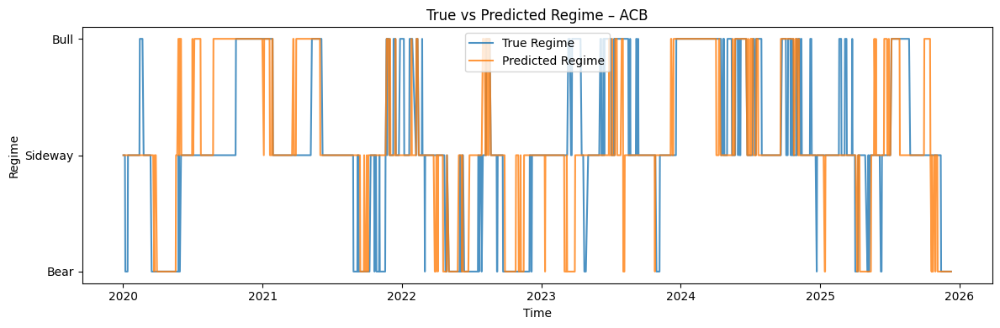

In [823]:
symbol_example = preds["symbol"].iloc[0]
df_sym = preds[preds["symbol"] == symbol_example].sort_values("time")

plt.figure(figsize=(12,4))
plt.plot(df_sym["time"], df_sym["y_true"], label="True Regime", alpha=0.8)
plt.plot(df_sym["time"], df_sym["y_pred"], label="Predicted Regime", alpha=0.8)
plt.yticks([0,1,2], ["Bear","Sideway","Bull"])
plt.title(f"True vs Predicted Regime – {symbol_example}")
plt.xlabel("Time")
plt.ylabel("Regime")
plt.legend()
plt.tight_layout()
plt.show()


### Lưu các model

In [819]:
import os
import shutil

# =========================
# CONFIG – sửa path ở đây
# =========================

SRC_BASE = "/content"
DEST_BASE = f"{ROOT_DIR}/output"  # <-- bạn đổi path này

ITEMS_TO_MOVE = [
    "artifacts_regime_model",
    "artifacts_risk_model",
    "sample_data",
    "direction_xgb_feature_importance.csv",
    "direction_xgb_model.joblib",
    "direction_xgb_results.csv",
]

# =========================
# Helper
# =========================

def ensure_dir(path: str):
    os.makedirs(path, exist_ok=True)

def move_item(src: str, dst: str):
    if not os.path.exists(src):
        print(f"[SKIP] Not found: {src}")
        return
    if os.path.exists(dst):
        print(f"[SKIP] Already exists at destination: {dst}")
        return
    shutil.move(src, dst)
    print(f"[OK] Moved: {src} -> {dst}")

# =========================
# EXECUTE
# =========================

ensure_dir(DEST_BASE)

for item in ITEMS_TO_MOVE:
    src_path = os.path.join(SRC_BASE, item)
    dst_path = os.path.join(DEST_BASE, item)
    move_item(src_path, dst_path)

print("\n✅ Done moving artifacts to Drive")
print("Destination:", DEST_BASE)


[SKIP] Already exists at destination: /content/drive/MyDrive/Data_mining/Data/output/artifacts_regime_model
[SKIP] Already exists at destination: /content/drive/MyDrive/Data_mining/Data/output/artifacts_risk_model
[SKIP] Already exists at destination: /content/drive/MyDrive/Data_mining/Data/output/sample_data
[SKIP] Already exists at destination: /content/drive/MyDrive/Data_mining/Data/output/direction_xgb_feature_importance.csv
[SKIP] Already exists at destination: /content/drive/MyDrive/Data_mining/Data/output/direction_xgb_model.joblib
[SKIP] Already exists at destination: /content/drive/MyDrive/Data_mining/Data/output/direction_xgb_results.csv

✅ Done moving artifacts to Drive
Destination: /content/drive/MyDrive/Data_mining/Data/output
